# Chicago Taxi Trips in Year 2022
#### Copyright © 2024 Danny Ng

In [2]:
import matplotlib.pyplot as plt # https://matplotlib.org/stable/users/
%config InlineBackend.figure_format='retina'

import numpy as np

import pandas as pd
# https://pandas.pydata.org/docs/getting_started/intro_tutorials/
# https://pandas.pydata.org/docs/user_guide/

import seaborn as sns
# https://seaborn.pydata.org/tutorial.html

import bokeh
import plotly
import plotlyexpress
#some other plotting libraries

In [4]:
np.__version__, pd.__version__, sns.__version__

('1.26.4', '2.2.2', '0.13.2')

# Step 1: Read the data

In [6]:
%time df = pd.read_csv('chicago_tax_trip_raw.csv') # 2.43 GB

CPU times: user 44.1 s, sys: 16.2 s, total: 1min
Wall time: 1min 21s


# Step 2a: Overview of the data

Some business questions to answer:
-Is there any missing data for the columns in the dataset
-Does the missing data rows for each column follow a specific pattern
-What could be the reason for the missing data and said pattern
-Should the missing data rows be removed altogether? How does the removal affect the uniformity of the dataset?
-How is the distribution of each column based on counts? Are there any anomalies/outliers?
-Which range of values in each column should be kept/removed?
-Are the values in the column unique? If not, how are they distributed? Are there any anomalies in the distribution?
-Is there a connection between any of the columns? Example: Is total fair a sum of all the other fairs?
-Can we build any logical connections between the columns? Example: Is trip end time always greater than the trip start time?
-Are all the columns in a logical data type? Check if date/time columns are in the datetime data type.
-1-dimensional distribution, histogram, range, box plot, 5# summary of each column to identify anomalies

In [9]:
type(df)

pandas.core.frame.DataFrame

In [10]:
# Q: How many rows and columns are in the data?
df.shape

(6382425, 23)

In [11]:
len(df) # Number of rows

6382425

In [12]:
df.size # (number of rows) x (number of columns)

146795775

In [13]:
# Q: What do the raw data look like?
df

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
0,bcfa19f2539021c054809d4c3993d226996ae095,368ce5511598af2cc07efdb68067d381174fdac1d47a28...,01/01/2022 12:00:00 AM,01/01/2022 12:00:00 AM,152.0,0.10,NaN,NaN,NaN,NaN,...,0.0,3.75,Cash,Medallion Leasin,NaN,NaN,NaN,NaN,NaN,NaN
1,2aba69ff015f9ea8e7bff43cab7eddb228f34a12,449fa4909552757130d09d98ebc7770e2dd94579036b0e...,01/01/2022 12:00:00 AM,01/01/2022 12:30:00 AM,2360.0,17.44,NaN,NaN,NaN,8.0,...,5.0,52.75,Cash,Flash Cab,NaN,NaN,NaN,41.899602,-87.633308,POINT (-87.6333080367 41.899602111)
2,54d812a0b88f8f9707825261014b3563a0a60ace,f98ae5e71fdda8806710af321dce58002146886c013f41...,01/01/2022 12:00:00 AM,01/01/2022 12:00:00 AM,536.0,4.83,NaN,NaN,28.0,22.0,...,0.0,14.75,Cash,Globe Taxi,41.874005,-87.663518,POINT (-87.6635175498 41.874005383),41.922761,-87.699155,POINT (-87.6991553432 41.9227606205)
3,7125b9e03a0f16c2dfb5eaf73ed057dc51eb68ef,8eca35a570101ad24c638f1f43eecce9d0cb7843e13a75...,01/01/2022 12:00:00 AM,01/01/2022 12:15:00 AM,897.0,2.07,NaN,NaN,8.0,32.0,...,1.5,11.25,Cash,Sun Taxi,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)
4,f1a650ee419b4e52d766432e6f86eca3457bfb37,e2d8418fcdb061eee0a4318fba0a6a1200aaff0143feb0...,01/01/2022 12:00:00 AM,01/01/2022 12:30:00 AM,2200.0,2.48,NaN,NaN,8.0,32.0,...,0.0,11.50,Mobile,Chicago Independents,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6382420,f5ba11ba1d2f0dd11c598d05481947e19c8e1a17,0cbf5c0f6aca3628d77c7b6fe89715757ed402a70b0f8b...,12/31/2022 11:45:00 PM,12/31/2022 11:45:00 PM,539.0,1.85,NaN,NaN,32.0,28.0,...,0.0,11.48,Mobile,Globe Taxi,41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),41.874005,-87.663518,POINT (-87.6635175498 41.874005383)
6382421,f8fad61a583724263dcc628c822ec835f212665d,081758ced4767105bfa217f7b0784d72d37e12a016fe2a...,12/31/2022 11:45:00 PM,01/01/2023 12:30:00 AM,3029.0,12.93,NaN,NaN,NaN,38.0,...,0.0,40.50,Cash,5 Star Taxi,NaN,NaN,NaN,41.812949,-87.617860,POINT (-87.6178596758 41.8129489392)
6382422,f88a3f1bc24e4afa13d6a5697be43d953f2065cd,96c3fa383c9adacc965af778248d6ef1b3a20ada7e623e...,12/31/2022 11:45:00 PM,01/01/2023 12:00:00 AM,449.0,1.66,NaN,NaN,8.0,28.0,...,4.0,11.75,Cash,Flash Cab,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.874005,-87.663518,POINT (-87.6635175498 41.874005383)
6382423,f7d9a0b1514d58cb2af513b76759b999b67e5d11,835869d6df51f9ec6e53cb4ac6a1f9e386c26f948cdcca...,12/31/2022 11:45:00 PM,01/01/2023 12:00:00 AM,321.0,0.77,1.703108e+10,1.703108e+10,8.0,8.0,...,1.0,17.00,Credit Card,Taxicab Insurance Agency Llc,41.898332,-87.620763,POINT (-87.6207628651 41.8983317935),41.895033,-87.619711,POINT (-87.6197106717 41.8950334495)


In [14]:
df.head()

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
0,bcfa19f2539021c054809d4c3993d226996ae095,368ce5511598af2cc07efdb68067d381174fdac1d47a28...,01/01/2022 12:00:00 AM,01/01/2022 12:00:00 AM,152.0,0.10,NaN,NaN,NaN,NaN,...,0.0,3.75,Cash,Medallion Leasin,NaN,NaN,NaN,NaN,NaN,NaN
1,2aba69ff015f9ea8e7bff43cab7eddb228f34a12,449fa4909552757130d09d98ebc7770e2dd94579036b0e...,01/01/2022 12:00:00 AM,01/01/2022 12:30:00 AM,2360.0,17.44,NaN,NaN,NaN,8.0,...,5.0,52.75,Cash,Flash Cab,NaN,NaN,NaN,41.899602,-87.633308,POINT (-87.6333080367 41.899602111)
2,54d812a0b88f8f9707825261014b3563a0a60ace,f98ae5e71fdda8806710af321dce58002146886c013f41...,01/01/2022 12:00:00 AM,01/01/2022 12:00:00 AM,536.0,4.83,NaN,NaN,28.0,22.0,...,0.0,14.75,Cash,Globe Taxi,41.874005,-87.663518,POINT (-87.6635175498 41.874005383),41.922761,-87.699155,POINT (-87.6991553432 41.9227606205)
3,7125b9e03a0f16c2dfb5eaf73ed057dc51eb68ef,8eca35a570101ad24c638f1f43eecce9d0cb7843e13a75...,01/01/2022 12:00:00 AM,01/01/2022 12:15:00 AM,897.0,2.07,NaN,NaN,8.0,32.0,...,1.5,11.25,Cash,Sun Taxi,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)
4,f1a650ee419b4e52d766432e6f86eca3457bfb37,e2d8418fcdb061eee0a4318fba0a6a1200aaff0143feb0...,01/01/2022 12:00:00 AM,01/01/2022 12:30:00 AM,2200.0,2.48,NaN,NaN,8.0,32.0,...,0.0,11.50,Mobile,Chicago Independents,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)


In [15]:
df.tail(2)

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
6382423,f7d9a0b1514d58cb2af513b76759b999b67e5d11,835869d6df51f9ec6e53cb4ac6a1f9e386c26f948cdcca...,12/31/2022 11:45:00 PM,01/01/2023 12:00:00 AM,321.0,0.77,1.703108e+10,1.703108e+10,8.0,8.0,...,1.0,17.0,Credit Card,Taxicab Insurance Agency Llc,41.898332,-87.620763,POINT (-87.6207628651 41.8983317935),41.895033,-87.619711,POINT (-87.6197106717 41.8950334495)
6382424,fbfa856b7c2adbeb613cd4eadf76c9c9477ea578,524bfb96fdc1b3d414cade414c1dbc14c16402eb60137f...,12/31/2022 11:45:00 PM,12/31/2022 11:45:00 PM,240.0,0.00,NaN,NaN,NaN,NaN,...,1.0,7.8,Cash,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# Q: What are the row indices?
df.index

RangeIndex(start=0, stop=6382425, step=1)

In [17]:
# Q: What are the column names?
df.columns

Index(['Trip ID', 'Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp',
       'Trip Seconds', 'Trip Miles', 'Pickup Census Tract',
       'Dropoff Census Tract', 'Pickup Community Area',
       'Dropoff Community Area', 'Fare', 'Tips', 'Tolls', 'Extras',
       'Trip Total', 'Payment Type', 'Company', 'Pickup Centroid Latitude',
       'Pickup Centroid Longitude', 'Pickup Centroid Location',
       'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude',
       'Dropoff Centroid  Location'],
      dtype='object')

In [18]:
# Q: What does a row of raw data look like?
#Accessing a row by row number
df.iloc[2] # See .loc[] .at[] .iat[]

Trip ID                                54d812a0b88f8f9707825261014b3563a0a60ace
Taxi ID                       f98ae5e71fdda8806710af321dce58002146886c013f41...
Trip Start Timestamp                                     01/01/2022 12:00:00 AM
Trip End Timestamp                                       01/01/2022 12:00:00 AM
Trip Seconds                                                              536.0
Trip Miles                                                                 4.83
Pickup Census Tract                                                         NaN
Dropoff Census Tract                                                        NaN
Pickup Community Area                                                      28.0
Dropoff Community Area                                                     22.0
Fare                                                                      14.75
Tips                                                                        0.0
Tolls                                   

In [19]:
#Accessing a row by row label
df.loc[2]

#Output here the same since the row labels are the same as row number

Trip ID                                54d812a0b88f8f9707825261014b3563a0a60ace
Taxi ID                       f98ae5e71fdda8806710af321dce58002146886c013f41...
Trip Start Timestamp                                     01/01/2022 12:00:00 AM
Trip End Timestamp                                       01/01/2022 12:00:00 AM
Trip Seconds                                                              536.0
Trip Miles                                                                 4.83
Pickup Census Tract                                                         NaN
Dropoff Census Tract                                                        NaN
Pickup Community Area                                                      28.0
Dropoff Community Area                                                     22.0
Fare                                                                      14.75
Tips                                                                        0.0
Tolls                                   

In [20]:
#Accessing one single element based on row_number and col_number
df.iat[2,2]

'01/01/2022 12:00:00 AM'

In [21]:
#Accessing one single element based on row_label and col_label
df.at[3,'Trip Miles']

2.07

In [22]:
# Q: What column data types did Pandas infer?
df.dtypes

Trip ID                        object
Taxi ID                        object
Trip Start Timestamp           object
Trip End Timestamp             object
Trip Seconds                  float64
Trip Miles                    float64
Pickup Census Tract           float64
Dropoff Census Tract          float64
Pickup Community Area         float64
Dropoff Community Area        float64
Fare                          float64
Tips                          float64
Tolls                         float64
Extras                        float64
Trip Total                    float64
Payment Type                   object
Company                        object
Pickup Centroid Latitude      float64
Pickup Centroid Longitude     float64
Pickup Centroid Location       object
Dropoff Centroid Latitude     float64
Dropoff Centroid Longitude    float64
Dropoff Centroid  Location     object
dtype: object

In [23]:
# Q: How much memory is used?
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6382425 entries, 0 to 6382424
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   Trip ID                     object 
 1   Taxi ID                     object 
 2   Trip Start Timestamp        object 
 3   Trip End Timestamp          object 
 4   Trip Seconds                float64
 5   Trip Miles                  float64
 6   Pickup Census Tract         float64
 7   Dropoff Census Tract        float64
 8   Pickup Community Area       float64
 9   Dropoff Community Area      float64
 10  Fare                        float64
 11  Tips                        float64
 12  Tolls                       float64
 13  Extras                      float64
 14  Trip Total                  float64
 15  Payment Type                object 
 16  Company                     object 
 17  Pickup Centroid Latitude    float64
 18  Pickup Centroid Longitude   float64
 19  Pickup Centroid Locat

In [24]:
df.describe().transpose() # Only numerical columns

,count,mean,std,min,25%,50%,75%,max
Trip Seconds,6380960.0,1.198209e+03,1895.664878,0.000000e+00,4.580000e+02,8.620000e+02,1.620000e+03,8.634100e+04
Trip Miles,6382369.0,6.185569e+00,8.002858,0.000000e+00,8.500000e-01,2.600000e+00,1.110000e+01,2.967540e+03
Pickup Census Tract,2623831.0,1.703147e+10,368945.901068,1.703101e+10,1.703108e+10,1.703132e+10,1.703184e+10,1.703198e+10
Dropoff Census Tract,2675331.0,1.703141e+10,345773.492358,1.703101e+10,1.703108e+10,1.703132e+10,1.703184e+10,1.703198e+10
Pickup Community Area,5868572.0,3.235048e+01,25.203045,1.000000e+00,8.000000e+00,3.200000e+01,4.400000e+01,7.700000e+01
Dropoff Community Area,5748741.0,2.584317e+01,20.925425,1.000000e+00,8.000000e+00,2.800000e+01,3.200000e+01,7.700000e+01
Fare,6378889.0,2.172931e+01,49.416239,0.000000e+00,8.000000e+00,1.400000e+01,3.325000e+01,9.999750e+03
Tips,6378889.0,2.754555e+00,4.083892,0.000000e+00,0.000000e+00,9.200000e-01,4.000000e+00,4.960000e+02
Tolls,6378889.0,2.128382e-02,7.659939,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.666660e+03
Extras,6378889.0,2.163036e+00,21.752692,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,8.888880e+03


In [25]:
df.describe(include=object).T # Only non-numerical columns

,count,unique,top,freq
Trip ID,6382425,6382425,bcfa19f2539021c054809d4c3993d226996ae095,1
Taxi ID,6382071,2950,2780ead18beaa862cc67315ddabd9d1acaadcd6da82eba...,10056
Trip Start Timestamp,6382425,35036,09/29/2022 05:45:00 PM,520
Trip End Timestamp,6382213,35050,05/20/2022 07:15:00 PM,543
Payment Type,6382425,8,Credit Card,2481231
Company,6382425,38,Flash Cab,1406928
Pickup Centroid Location,5870874,616,POINT (-87.6333080367 41.899602111),673556
Dropoff Centroid Location,5784494,661,POINT (-87.6333080367 41.899602111),526527


In [26]:
# Q: Number of missing data per column?
len(df) - df.count()

Trip ID                             0
Taxi ID                           354
Trip Start Timestamp                0
Trip End Timestamp                212
Trip Seconds                     1465
Trip Miles                         56
Pickup Census Tract           3758594
Dropoff Census Tract          3707094
Pickup Community Area          513853
Dropoff Community Area         633684
Fare                             3536
Tips                             3536
Tolls                            3536
Extras                           3536
Trip Total                       3536
Payment Type                        0
Company                             0
Pickup Centroid Latitude       511551
Pickup Centroid Longitude      511551
Pickup Centroid Location       511551
Dropoff Centroid Latitude      597931
Dropoff Centroid Longitude     597931
Dropoff Centroid  Location     597931
dtype: int64

# Step 2b: Examine each column of the data for anomaly

/var/folders/_5/5xzxgkc15jdg71sltgfrs8rm0000gn/T/ipykernel_51092/3679744673.py:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df.hist(ax=ax)


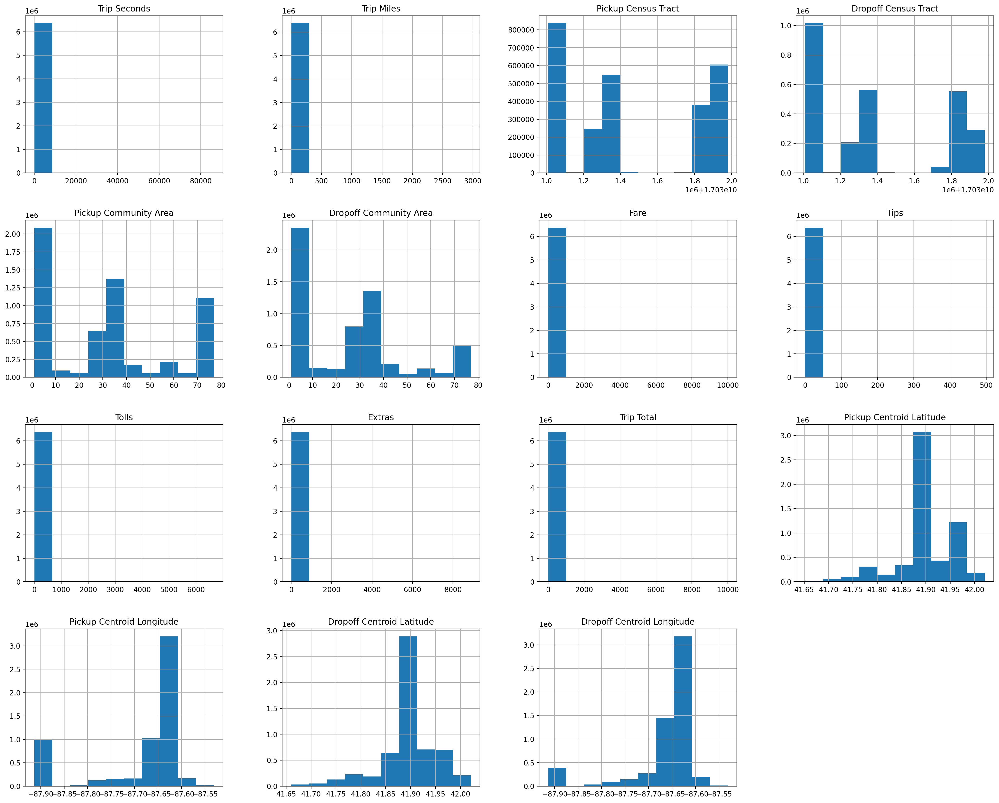

In [28]:
fig = plt.figure(figsize=(25,20))
ax = fig.gca()
df.hist(ax=ax)
pass #to remove the axes descriptions from the output
#can be used to plot histograms of all numerical variables together

In [29]:
type(df['Trip ID'])

pandas.core.series.Series

In [30]:
df['Trip ID']

0          bcfa19f2539021c054809d4c3993d226996ae095
1          2aba69ff015f9ea8e7bff43cab7eddb228f34a12
2          54d812a0b88f8f9707825261014b3563a0a60ace
3          7125b9e03a0f16c2dfb5eaf73ed057dc51eb68ef
4          f1a650ee419b4e52d766432e6f86eca3457bfb37
                             ...                   
6382420    f5ba11ba1d2f0dd11c598d05481947e19c8e1a17
6382421    f8fad61a583724263dcc628c822ec835f212665d
6382422    f88a3f1bc24e4afa13d6a5697be43d953f2065cd
6382423    f7d9a0b1514d58cb2af513b76759b999b67e5d11
6382424    fbfa856b7c2adbeb613cd4eadf76c9c9477ea578
Name: Trip ID, Length: 6382425, dtype: object

In [31]:
# Q: Any missing trip ID?
df['Trip ID'].isna().any() # See .isnull() .notna() .notnull()

False

In [32]:
df['Trip ID'].isnull().any()
#No null or NA values

False

In [33]:
# Q: Number of unique Trip IDs?
df['Trip ID'].nunique()

6382425

In [34]:
# Q: Any duplicated Trip ID?
df['Trip ID'].duplicated().any()

#No duplicates, i.e., all unique values

False

In [35]:
df['Taxi ID'].head()

0    368ce5511598af2cc07efdb68067d381174fdac1d47a28...
1    449fa4909552757130d09d98ebc7770e2dd94579036b0e...
2    f98ae5e71fdda8806710af321dce58002146886c013f41...
3    8eca35a570101ad24c638f1f43eecce9d0cb7843e13a75...
4    e2d8418fcdb061eee0a4318fba0a6a1200aaff0143feb0...
Name: Taxi ID, dtype: object

In [36]:
# Q: How many missing taxi ID?
df['Taxi ID'].isna().sum()

354

In [37]:
# Q: Anything special about rows with missing taxi ID?
df[df['Taxi ID'].isna()]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
2485,dc68a5b6e3eeb4922738e6b480caf8f026f4e1fc,NaN,01/01/2022 05:45:00 AM,01/01/2022 05:45:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,39.10,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
18400,f0d90d5a27d05dbd91299ae01249905cbe18d59f,NaN,01/03/2022 07:45:00 AM,01/03/2022 07:45:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,11.21,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
29637,6b7f079e0965128a736bf9809c3aa4a107ea7b2a,NaN,01/04/2022 08:15:00 AM,01/04/2022 08:15:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,11.79,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
30977,9e67eb8c8085bde49c60693a5e208941c9640485,NaN,01/04/2022 10:30:00 AM,01/04/2022 10:30:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,11.79,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
39773,024d85ad7447761986c1239aa3586af78dcd1022,NaN,01/05/2022 08:15:00 AM,01/05/2022 08:15:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,10.92,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6316322,d849a122f2dd7a87d6c744511b8300d909c29538,NaN,12/28/2022 07:15:00 AM,12/28/2022 07:15:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,48.30,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
6319287,28410462c3243001cfd161ea656b7af2ea85f10f,NaN,12/28/2022 11:45:00 AM,12/28/2022 11:45:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,11.21,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
6321566,881c0de8faa54f70d085da6583f3f5645834871d,NaN,12/28/2022 02:15:00 PM,12/28/2022 02:15:00 PM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,6.61,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
6360431,9aea1a6451855b78ba53653300c9c5c74dd0a92c,NaN,12/31/2022 06:00:00 AM,12/31/2022 06:00:00 AM,0.0,0.0,NaN,NaN,NaN,NaN,...,0.0,47.72,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
df['Company'][df['Taxi ID'].isna()].value_counts() # Most are from one company

Company
Taxi Affiliation Services       352
Chicago Medallion Management      2
Name: count, dtype: int64

In [39]:
df[df['Taxi ID'].isna()].count() # Most do not have pickup and dropoff locations

Trip ID                       354
Taxi ID                         0
Trip Start Timestamp          354
Trip End Timestamp            353
Trip Seconds                  353
Trip Miles                    354
Pickup Census Tract             1
Dropoff Census Tract            1
Pickup Community Area           2
Dropoff Community Area          2
Fare                          351
Tips                          351
Tolls                         351
Extras                        351
Trip Total                    351
Payment Type                  354
Company                       354
Pickup Centroid Latitude        2
Pickup Centroid Longitude       2
Pickup Centroid Location        2
Dropoff Centroid Latitude       2
Dropoff Centroid Longitude      2
Dropoff Centroid  Location      2
dtype: int64

In [40]:
# Q: What data are missing taxi ID but have pickup location?
df[df['Taxi ID'].isna() & df['Pickup Centroid Location'].notna()] # The other company

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
314091,10ac28fefa6cc848131a325f51088e09206ca20f,NaN,02/01/2022 02:00:00 PM,02/01/2022 02:00:00 PM,0.0,0.0,1.703184e+10,1.703184e+10,28.0,28.0,...,0.0,3.25,Cash,Chicago Medallion Management,41.884768,-87.684147,POINT (-87.6841474493 41.8847677845),41.884768,-87.684147,POINT (-87.6841474493 41.8847677845)
1999363,316d01355531ecf123bd51ae9cec9cbc64764eb1,NaN,05/16/2022 11:00:00 AM,05/16/2022 11:00:00 AM,180.0,0.0,NaN,NaN,16.0,16.0,...,0.0,4.25,Cash,Chicago Medallion Management,41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),41.953582,-87.723452,POINT (-87.7234523905 41.9535821253)


In [41]:
# Q: How many unique taxi IDs?
df['Taxi ID'].nunique()

2950

In [42]:
# Q: How many trips per taxi ID?
df['Taxi ID'].value_counts().reset_index()

,Taxi ID,count
0,2780ead18beaa862cc67315ddabd9d1acaadcd6da82eba...,10056
1,f98ae5e71fdda8806710af321dce58002146886c013f41...,8512
2,8da9e1d18757022c6a6a614fc2d38483e38aae441feff5...,8413
3,3d9da170c3265c7027541b4dd1802eb22d897f005fedfa...,7888
4,66d3807bc1b0bcf7c3b90c19f7c13356cdd60995199804...,7794
...,...,...
2945,bc4298d28798c82fa6b6b3ec651f6d646f6f65f54661f5...,1
2946,0dc4dcab0d31652495c375840a0b99047c95d67649bf09...,1
2947,e97ff21e0c8f655aa03ec62fbccdf33578a21516535ce7...,1
2948,d22322e70c20de00bea8fdc7b90805545bb82ef14859e0...,1


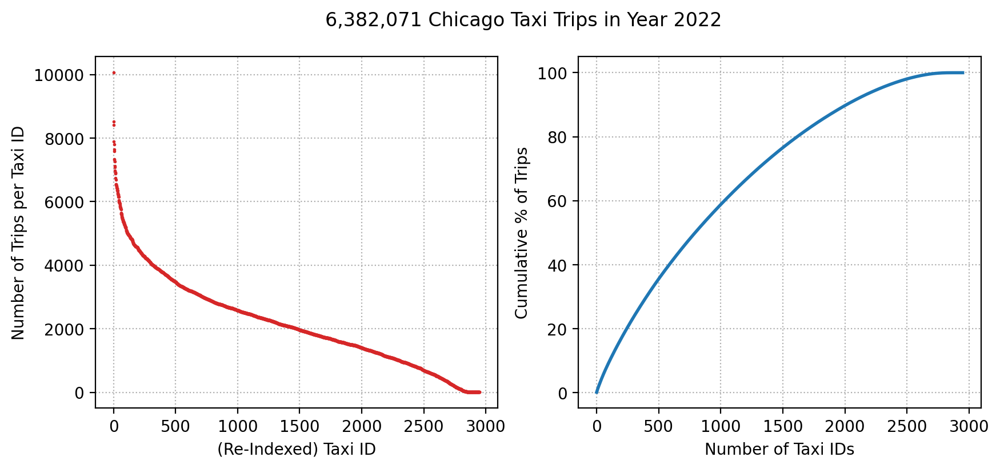

In [43]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
a = df['Taxi ID'].value_counts().to_numpy() # https://pandas.pydata.org/docs/user_guide/basics.html#attributes-and-underlying-data
plt.plot(a, '.', markersize=2, color='C3') # https://matplotlib.org/stable/users/explain/colors/colormaps.html
plt.grid(linestyle=':')
plt.xlabel('(Re-Indexed) Taxi ID')
plt.ylabel('Number of Trips per Taxi ID')

plt.subplot(122)
plt.plot(a.cumsum() / a.sum() * 100, linewidth=2, color='C0')
ax = plt.gca()
ax.grid(linestyle=':')
ax.set_axisbelow(True) # plt.rcParams['axes.axisbelow'] = True
ax.set_xlabel('Number of Taxi IDs')
ax.set_ylabel('Cumulative % of Trips')

plt.suptitle(f'{a.sum():,} Chicago Taxi Trips in Year 2022')
plt.show()

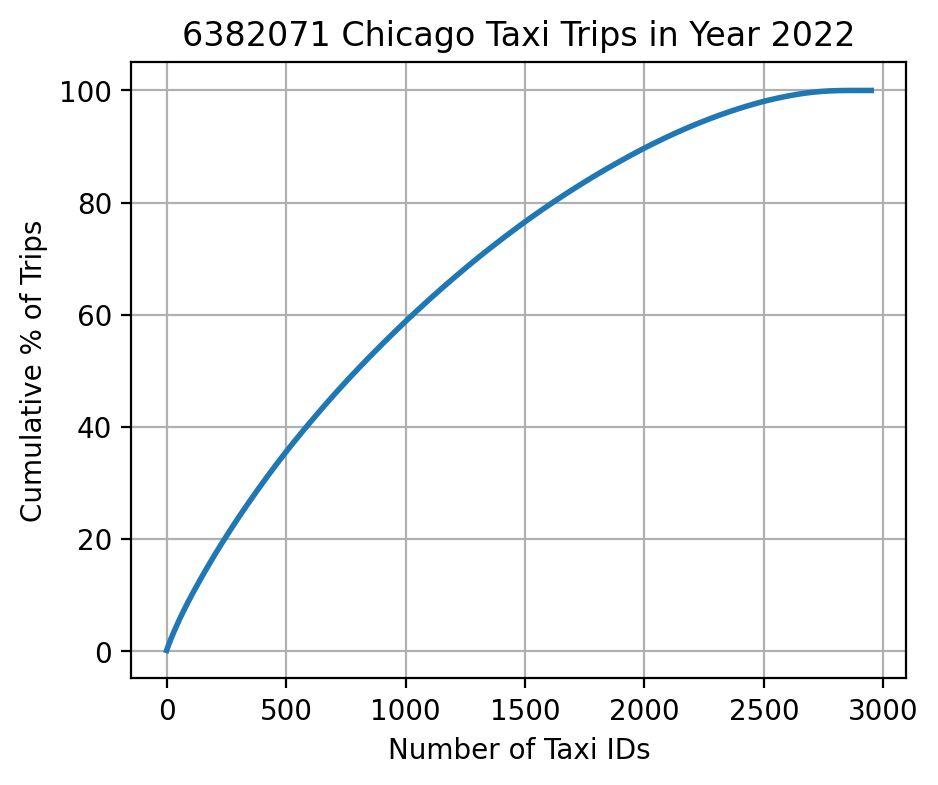

In [44]:
((df['Taxi ID'].value_counts().cumsum().reset_index(drop=True) / df['Taxi ID'].count() * 100)
 .plot(figsize=(5, 4),
       linewidth=2,
       grid=True,
       xlabel='Number of Taxi IDs',
       ylabel='Cumulative % of Trips',
       title=str(df['Taxi ID'].count()) + ' Chicago Taxi Trips in Year 2022'));
# https://pandas.pydata.org/docs/user_guide/visualization.html

In [45]:
df['Trip Start Timestamp']

0          01/01/2022 12:00:00 AM
1          01/01/2022 12:00:00 AM
2          01/01/2022 12:00:00 AM
3          01/01/2022 12:00:00 AM
4          01/01/2022 12:00:00 AM
                    ...          
6382420    12/31/2022 11:45:00 PM
6382421    12/31/2022 11:45:00 PM
6382422    12/31/2022 11:45:00 PM
6382423    12/31/2022 11:45:00 PM
6382424    12/31/2022 11:45:00 PM
Name: Trip Start Timestamp, Length: 6382425, dtype: object

In [46]:
type(df['Trip Start Timestamp'].iat[0])

str

In [47]:
#Parse to datetime object in the standard ISO notation

df['Trip Start Timestamp'] = pd.to_datetime(df['Trip Start Timestamp'], format='%m/%d/%Y %I:%M:%S %p')
# https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior

df['Trip Start Timestamp']

0         2022-01-01 00:00:00
1         2022-01-01 00:00:00
2         2022-01-01 00:00:00
3         2022-01-01 00:00:00
4         2022-01-01 00:00:00
                  ...        
6382420   2022-12-31 23:45:00
6382421   2022-12-31 23:45:00
6382422   2022-12-31 23:45:00
6382423   2022-12-31 23:45:00
6382424   2022-12-31 23:45:00
Name: Trip Start Timestamp, Length: 6382425, dtype: datetime64[ns]

In [48]:
type(df['Trip Start Timestamp'].iat[0])

pandas._libs.tslibs.timestamps.Timestamp

In [49]:
# Q: Any missing trip start time?
df['Trip Start Timestamp'].isna().sum()

0

In [50]:
# Q: Any trip start time not in year 2022?
(df['Trip Start Timestamp'].dt.year == 2022).all()

# https://pandas.pydata.org/docs/user_guide/basics.html#basics-dt-accessors
# https://pandas.pydata.org/docs/user_guide/timeseries.html#time-date-components

True

In [51]:
# Q: Any calendar date not present?
df['Trip Start Timestamp'].dt.date.unique().size

365

In [52]:
# Q: How many trips per month?
df['Trip Start Timestamp'].dt.month.value_counts().sort_index()

Trip Start Timestamp
1     308179
2     364545
3     518637
4     521742
5     596191
6     639269
7     573232
8     589033
9     608507
10    606713
11    542788
12    513589
Name: count, dtype: int64

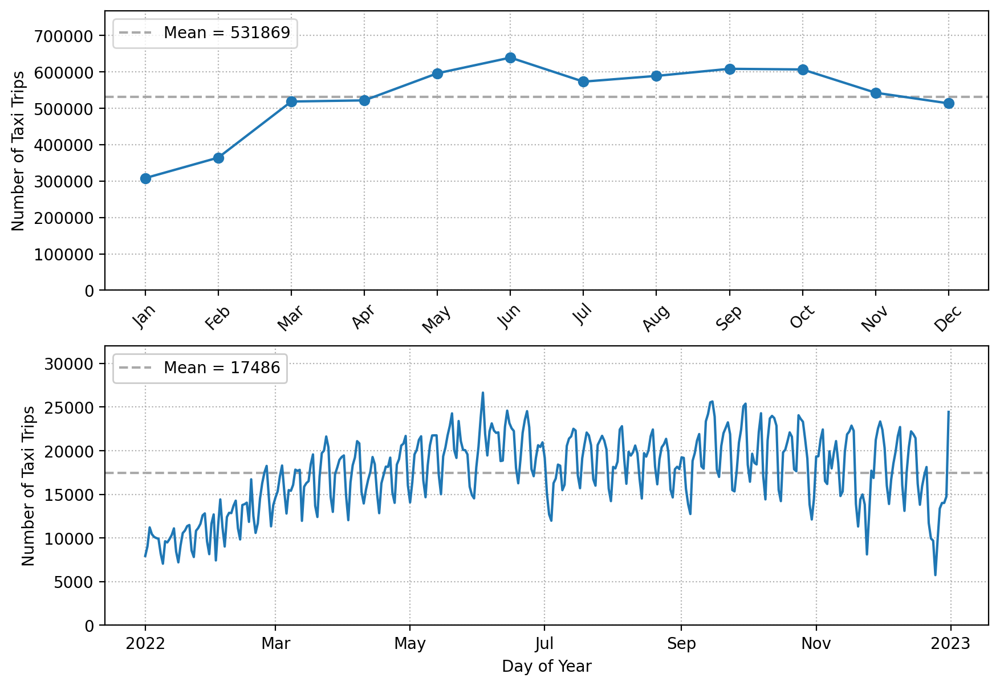

In [53]:
import calendar # https://docs.python.org/3/library/calendar.html
import matplotlib.dates

fig = plt.figure(figsize=(10, 7))

ax1 = plt.subplot(2, 1, 1)
v1 = df['Trip Start Timestamp'].dt.month.value_counts().sort_index()
ax1.plot(list(calendar.month_abbr)[1:], v1, 'o-', )
ax1.axhline(v1.mean(), linestyle='--', color='darkgray', zorder=1.5, # https://matplotlib.org/stable/gallery/misc/zorder_demo.html
            label=f'Mean = {round(v1.mean())}')
ax1.set_ylim(bottom=0, top=v1.max() * 1.2)
ax1.grid(linestyle=':')
ax1.tick_params(axis='x', rotation=45)
ax1.set_ylabel('Number of Taxi Trips')
ax1.legend(loc='upper left')

ax2 = plt.subplot(2, 1, 2)
v2 = df['Trip Start Timestamp'].dt.date.value_counts().sort_index()
ax2.plot(v2)
ax2.axhline(v2.mean(), linestyle='--', color='darkgray', zorder=1.5, label=f'Mean = {v2.mean():.0f}')
ax2.xaxis.set(major_formatter=matplotlib.dates.ConciseDateFormatter(matplotlib.dates.AutoDateLocator()))
ax2.set_ylim(bottom=0, top=v2.max() * 1.2)
ax2.grid(linestyle=':')
ax2.set_xlabel('Day of Year')
ax2.set_ylabel('Number of Taxi Trips')
ax2.legend(loc='upper left', framealpha=1)

plt.show()

In [54]:
# Q: Which dates had most trips?
df['Trip Start Timestamp'].dt.date.value_counts().nlargest(10)

Trip Start Timestamp
2022-06-03    26650
2022-09-15    25641
2022-09-14    25533
2022-09-30    25389
2022-09-29    25074
2022-06-14    24588
2022-06-23    24530
2022-12-31    24445
2022-10-07    24289
2022-05-20    24274
Name: count, dtype: int64

In [55]:
# Q: Which dates had fewest trips?
df['Trip Start Timestamp'].dt.date.value_counts().nsmallest(10)

Trip Start Timestamp
2022-12-25    5748
2022-01-09    7056
2022-01-16    7210
2022-02-02    7429
2022-01-23    7820
2022-01-01    7939
2022-11-24    8121
2022-01-30    8147
2022-01-08    8207
2022-01-15    8436
Name: count, dtype: int64

In [56]:
# Q: How many trips per day of week?
df['Trip Start Timestamp'].dt.dayofweek.value_counts().sort_index() # 0 is Monday

Trip Start Timestamp
0     887351
1     954151
2     978410
3    1010665
4    1016192
5     821606
6     714050
Name: count, dtype: int64

In [57]:
# Q: How many trips per hour?
df['Trip Start Timestamp'].dt.hour.value_counts().sort_index()

Trip Start Timestamp
0     132168
1      90280
2      55245
3      38776
4      39717
5      60098
6     108468
7     192698
8     281855
9     320206
10    340711
11    364707
12    398371
13    407572
14    418096
15    428276
16    438406
17    457721
18    441778
19    395986
20    320037
21    263510
22    216385
23    171358
Name: count, dtype: int64

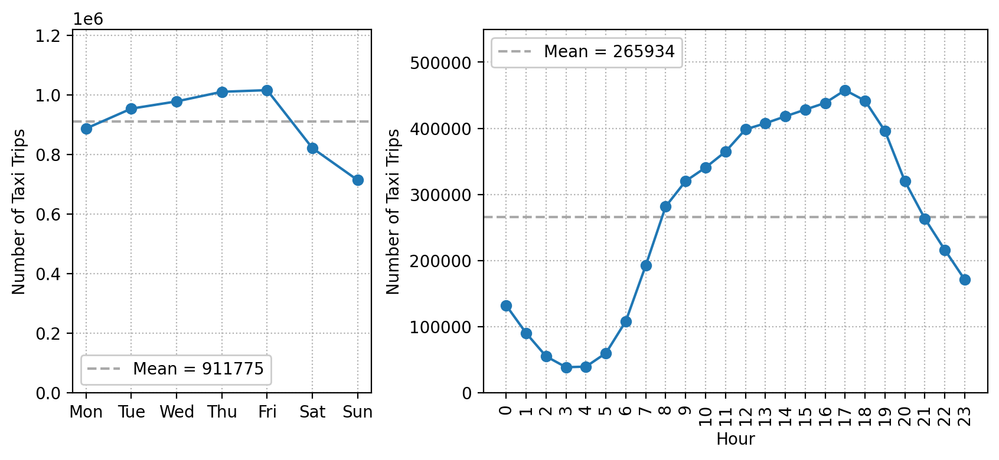

In [58]:
import matplotlib.gridspec
# https://matplotlib.org/stable/gallery/subplots_axes_and_figures/gridspec_multicolumn.html

fig = plt.figure(figsize=(10, 4))
gs = matplotlib.gridspec.GridSpec(1, 5, figure=fig, wspace=1.2)
ax1 = fig.add_subplot(gs[0, :2])
ax2 = fig.add_subplot(gs[0, 2:])

v1 = df['Trip Start Timestamp'].dt.dayofweek.value_counts().sort_index()
ax1.plot(calendar.day_abbr, v1, 'o-')
ax1.axhline(v1.mean(), linestyle='--', color='darkgray', zorder=1.5, label=f'Mean = {v1.mean():.0f}')
ax1.set_ylim(bottom=0, top=v1.max() * 1.2)
ax1.grid(linestyle=':')
ax1.set_ylabel('Number of Taxi Trips')
ax1.legend(loc='lower left', framealpha=1)

v2 = df['Trip Start Timestamp'].dt.hour.value_counts().sort_index()
ax2.plot(v2, 'o-')
ax2.axhline(v2.mean(), linestyle='--', color='darkgray', zorder=1.5, label=f'Mean = {v2.mean():.0f}')
ax2.set_ylim(bottom=0, top=v2.max() * 1.2)
ax2.grid(linestyle=':')
ax2.set_xticks(np.arange(24))
ax2.tick_params(axis='x', rotation=90)
ax2.set_xlabel('Hour')
ax2.set_ylabel('Number of Taxi Trips')
ax2.legend(loc='upper left', framealpha=1)

plt.show()

In [59]:
# Q: Number of trips per date for the busiest taxi IDs?
busy_taxi = df['Taxi ID'].value_counts().nlargest(5).index
df2 = (df
       [df['Taxi ID'].isin(busy_taxi)]
       .value_counts(['Taxi ID', df['Trip Start Timestamp'].dt.date])
       .unstack()
       .T
       .fillna(0)
       .rename(columns=lambda x: x[:6])
       .rename_axis('Trip Start Date'))

df2

Taxi ID,2780ea,3d9da1,66d380,8da9e1,f98ae5
Trip Start Date,,,,,
2022-01-01,39.0,12.0,36.0,0.0,22.0
2022-01-02,39.0,13.0,33.0,9.0,14.0
2022-01-03,22.0,17.0,17.0,15.0,12.0
2022-01-04,31.0,11.0,20.0,20.0,7.0
2022-01-05,23.0,16.0,18.0,24.0,9.0
...,...,...,...,...,...
2022-12-27,29.0,17.0,23.0,22.0,16.0
2022-12-28,35.0,18.0,17.0,25.0,22.0
2022-12-29,30.0,22.0,22.0,14.0,26.0


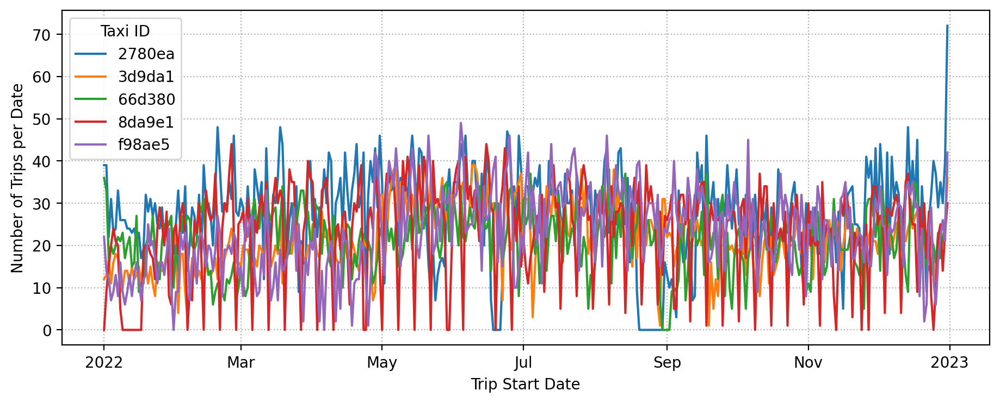

In [60]:
ax = df2.plot(figsize=(11, 4), ylabel='Number of Trips per Date')
ax.grid(linestyle=':')
ax.xaxis.set(major_formatter=matplotlib.dates.ConciseDateFormatter(matplotlib.dates.AutoDateLocator()));

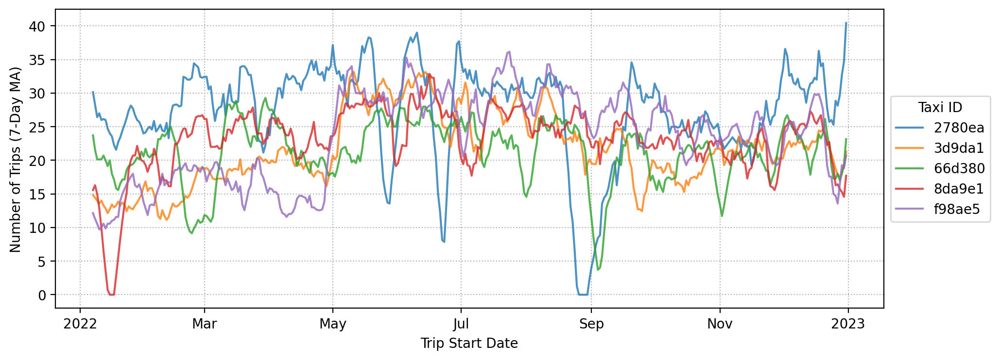

In [61]:
ax = (df2
      .rolling(window=7) # https://pandas.pydata.org/docs/user_guide/window.html#window-generic
      .mean()
      .plot(figsize=(11, 4), alpha=0.8, ylabel='Number of Trips (7-Day MA)'))
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), title='Taxi ID')
ax.grid(linestyle=':')
ax.xaxis.set(major_formatter=matplotlib.dates.ConciseDateFormatter(matplotlib.dates.AutoDateLocator()));

In [62]:
df['Trip End Timestamp'] = pd.to_datetime(df['Trip End Timestamp'], format='%m/%d/%Y %I:%M:%S %p')

In [63]:
# Q: How many missing trip end time?
df['Trip End Timestamp'].isna().sum()

212

In [64]:
# Q: Anything special about rows with missing trip end time?
df[df['Trip End Timestamp'].isna()]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
7947,2138daabdc8a40e4003f37a9afb950f264570ef5,1f3593421771a4a6cc906137e5d3221ed2ab7bef3c2bfa...,2022-01-02 00:00:00,NaT,NaN,0.0,NaN,NaN,8.0,NaN,...,0.0,0.0,Unknown,"Taxicab Insurance Agency, LLC",41.899602,-87.633308,POINT (-87.6333080367 41.899602111),NaN,NaN,NaN
23973,feee626970be5f6fab328e653f7ddb399ea6862c,34ed8ae3af562da8ab7ee7aa07c83287baf647219d79cf...,2022-01-03 15:30:00,NaT,NaN,0.0,1.703116e+10,NaN,16.0,NaN,...,0.0,0.0,Unknown,Taxi Affiliation Services,41.949876,-87.738142,POINT (-87.7381418906 41.9498764323),NaN,NaN,NaN
64607,1595ad9be307fb884203c0b7d0d82bf6f2aa61bd,e585218a9f728ba533db40a74237a1caa23f01212f0fa8...,2022-01-07 16:00:00,NaT,NaN,0.0,NaN,NaN,24.0,NaN,...,0.0,0.0,Unknown,Blue Ribbon Taxi Association Inc.,41.901207,-87.676356,POINT (-87.6763559892 41.9012069941),NaN,NaN,NaN
66794,ea888612112af451bd5eeaa7f2bb6aec5d227d02,bef8b8ce015170bb9aa8b1572ae3c5b704aafc09cf971c...,2022-01-07 18:45:00,NaT,NaN,0.0,1.703113e+10,NaN,13.0,NaN,...,0.0,0.0,Unknown,Blue Ribbon Taxi Association Inc.,41.980844,-87.736084,POINT (-87.7360839271 41.9808436155),NaN,NaN,NaN
71915,62a109ee095aafc1bf0215936522ea8be9d2f8db,1b0a05f16ca6759e00f934c5b39e93939b52bb1e28c114...,2022-01-08 13:30:00,NaT,NaN,0.0,1.703198e+10,NaN,76.0,NaN,...,0.0,0.0,Unknown,Taxi Affiliation Services,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6258400,f95efdeb7f97365cb6ce502435bc0037174557a8,fbb69858d94acd550ff8b8d685137eae3aae40bf83c3a5...,2022-12-22 10:00:00,NaT,NaN,0.0,1.703108e+10,NaN,8.0,NaN,...,0.0,0.0,Unknown,"Taxicab Insurance Agency, LLC",41.892508,-87.626215,POINT (-87.6262149064 41.8925077809),NaN,NaN,NaN
6263652,0d80dd153293482cd0ca03ab76be51e8464641b8,f3e31800d0d53c00d6b0f4e35242f868b87fc31ebc11d5...,2022-12-22 16:30:00,NaT,NaN,0.0,1.703108e+10,NaN,8.0,NaN,...,0.0,0.0,Unknown,Top Cab Affiliation,41.899156,-87.626211,POINT (-87.6262105324 41.8991556134),NaN,NaN,NaN
6274621,b5ee9d7fc97216b77a6d51653cfc75d5c5890e06,b12c6be9f088bab50b80d41139e9c64c78030e062ad567...,2022-12-23 19:30:00,NaT,NaN,0.0,1.703198e+10,NaN,76.0,NaN,...,0.0,0.0,Unknown,Taxi Affiliation Services,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN
6293343,ae6eed5440800aac7f6c183f8f55a113d0023d64,56f2fce86600dd132681be1323fe78ce26e60f2fffe4b3...,2022-12-26 09:00:00,NaT,NaN,0.0,NaN,NaN,8.0,NaN,...,0.0,0.0,Unknown,Taxi Affiliation Services,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),NaN,NaN,NaN


In [65]:
df[df['Trip End Timestamp'].isna()].count() # All do not have trip seconds and dropoff location

Trip ID                       212
Taxi ID                       211
Trip Start Timestamp          212
Trip End Timestamp              0
Trip Seconds                    0
Trip Miles                    212
Pickup Census Tract            73
Dropoff Census Tract            0
Pickup Community Area         108
Dropoff Community Area          0
Fare                          212
Tips                          212
Tolls                         212
Extras                        212
Trip Total                    212
Payment Type                  212
Company                       212
Pickup Centroid Latitude      108
Pickup Centroid Longitude     108
Pickup Centroid Location      108
Dropoff Centroid Latitude       0
Dropoff Centroid Longitude      0
Dropoff Centroid  Location      0
dtype: int64

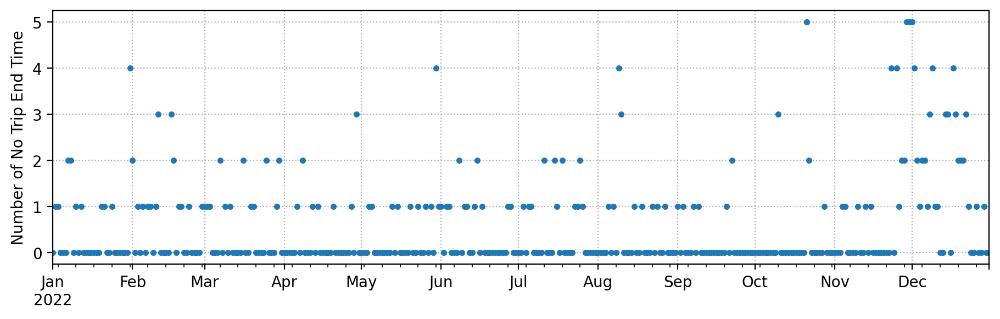

In [66]:
# Q: Is trip end time missing randomly over date?
ax = (df['Trip Start Timestamp']
      [df['Trip End Timestamp'].isna()]
      .dt.date
      .value_counts()
      .reindex(index=pd.date_range('2022-01-01', '2022-12-31'), fill_value=0) # https://pandas.pydata.org/docs/user_guide/basics.html#basics-reindexing
      .plot(figsize=(11, 3), marker='.', linestyle='', ylabel='Number of No Trip End Time'))
ax.grid(linestyle=':')

In [67]:
# Q: Any trip end time not in year 2022?
df['Trip End Timestamp'].dt.year.value_counts()

Trip End Timestamp
2022.0    6382063
2023.0        148
2014.0          1
2003.0          1
Name: count, dtype: int64

In [68]:
# Q: What dates if trip ends in year 2023?
df['Trip End Timestamp'][df['Trip End Timestamp'].dt.year == 2023].value_counts().sort_index()

Trip End Timestamp
2023-01-01 00:00:00    96
2023-01-01 00:15:00    24
2023-01-01 00:30:00     8
2023-01-01 00:45:00     2
2023-01-01 01:00:00     2
2023-01-01 07:15:00     4
2023-01-01 09:00:00     2
2023-01-01 12:45:00     2
2023-01-01 15:00:00     2
2023-01-01 15:30:00     2
2023-01-01 15:45:00     2
2023-01-01 16:00:00     2
Name: count, dtype: int64

In [69]:
# Q: What dates if trip ends before year 2022?
df[df['Trip End Timestamp'].dt.year < 2022]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
1047299,18c63ea0856a928490f91acfc35043ca3dca1fcc,55e53aceec1519445bae3e8414b4cbf11e59e50800f714...,2022-03-23 22:30:00,2014-09-22 14:00:00,NaN,1.00,NaN,NaN,NaN,8.0,...,2.0,38.05,Cash,Blue Ribbon Taxi Association Inc.,NaN,NaN,NaN,41.899602,-87.633308,POINT (-87.6333080367 41.899602111)
4639829,f86ed2a122e570c353f2fce9989ba6a3481c2b69,813f13e9ed00615788ec81497e9585ef6ae4993a4491b8...,2022-09-27 17:15:00,2003-02-11 17:45:00,NaN,4.42,NaN,NaN,8.0,8.0,...,1.0,15.00,Cash,5 Star Taxi,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111)


In [70]:
# Q: How many trips have end time before start time?
df[df['Trip Start Timestamp'] > df['Trip End Timestamp']]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
37703,4437b5efa8b632abf91b24d4dbfbd7b2aebb4c8b,f8b84760a5c303b6f781d9864346b47bc9d11271782082...,2022-01-04 20:30:00,2022-01-04 20:15:00,NaN,16.50,NaN,NaN,NaN,NaN,...,4.0,53.70,Credit Card,Top Cab Affiliation,NaN,NaN,NaN,NaN,NaN,NaN
266119,8eb67d250438864bd3f355e10c3ab0ce38bb0207,daf26343c74ba7742cf4ea2c61ffbff2209dd45f36a891...,2022-01-28 00:45:00,2022-01-27 10:15:00,NaN,0.00,NaN,NaN,28.0,8.0,...,0.0,7.50,Cash,Taxi Affiliation Services,41.874005,-87.663518,POINT (-87.6635175498 41.874005383),41.899602,-87.633308,POINT (-87.6333080367 41.899602111)
670005,f9e1520bdd97f5a1c7e1bf8cb6798024d2719a3c,098ac56b572ab91b2ce62b528a811d7e5e1ff9abdd3f87...,2022-02-28 18:30:00,2022-02-28 18:15:00,NaN,0.00,NaN,NaN,NaN,NaN,...,0.0,14.75,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
706947,d1ac33bacb551f0522d74bc6a57d66bebaa7714e,104880671c858323475b279b1ea4370cca4508a64a70e4...,2022-03-03 11:00:00,2022-03-03 10:45:00,NaN,0.00,NaN,NaN,NaN,NaN,...,0.0,8.75,Credit Card,Taxi Affiliation Services,NaN,NaN,NaN,NaN,NaN,NaN
767641,39ea48ace580b8ff69d4e40f13dc6d06d889bf9b,f8b84760a5c303b6f781d9864346b47bc9d11271782082...,2022-03-07 07:15:00,2022-03-05 07:45:00,NaN,4.80,NaN,NaN,NaN,NaN,...,5.0,19.25,No Charge,Top Cab Affiliation,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5426107,e147b72ed90f0ffdb06c7d13deae98ab55127888,f962126062d38e2ef0fa177812eba73ccd30513c1c6cfa...,2022-11-06 02:00:00,2022-11-06 01:15:00,NaN,8.51,NaN,NaN,76.0,NaN,...,5.5,34.25,Credit Card,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),NaN,NaN,NaN
5785984,730e27de91a884ceee1ca1d4108f78446a8b897f,0bd1d932b3086e8afc5ffa6372c26866d85ff1abaa15db...,2022-11-27 03:45:00,2022-11-25 06:45:00,NaN,12.80,NaN,NaN,76.0,6.0,...,7.0,40.00,Cash,"Taxicab Insurance Agency, LLC",41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014)
6084476,948bd9d02589b2cfb547a7f5b8a7df7b863e83d1,ace613150343ec9584249a0595c0c35af8e99fad625ade...,2022-12-12 18:45:00,2022-12-05 12:15:00,NaN,0.90,NaN,NaN,6.0,6.0,...,0.0,5.50,Cash,Top Cab Affiliation,41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014)
6153759,610820dc04f1bd59268e0995ea0580d735fe39cb,ace613150343ec9584249a0595c0c35af8e99fad625ade...,2022-12-16 06:30:00,2022-12-07 13:00:00,NaN,6.80,NaN,NaN,6.0,32.0,...,0.0,28.00,Credit Card,Top Cab Affiliation,41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)


In [71]:
# Q: Is trip seconds always missing when trip end time before start time?
df['Trip Seconds'][df['Trip Start Timestamp'] > df['Trip End Timestamp']].isna().all()

True

In [72]:
is_dirty = (df['Taxi ID'].isna() |
            df['Trip End Timestamp'].isna() |
            (df['Trip Start Timestamp'] > df['Trip End Timestamp']))
is_dirty.sum()

687

In [73]:
df = df[~is_dirty]

In [74]:
# Q: How many missing trip seconds?
df['Trip Seconds'].isna().sum()

1131

In [75]:
# Q: Anything special about rows with missing trip seconds?
df[df['Trip Seconds'].isna()]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
1594,740ae3212d0045e45912076a55f305a8c181e723,b7ac65c02ae59d09e31fdebdc18a4780593de3157d9c9c...,2022-01-01 02:45:00,2022-01-03 15:45:00,NaN,45.08,NaN,NaN,32.0,NaN,...,1.0,107.00,Cash,Chicago Independents,41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),NaN,NaN,NaN
2447,ab68a5166296c562f3ca5965039b5c78c08d3305,a7757fb6744a93997834888d41a9677289de26a17a110d...,2022-01-01 05:30:00,2022-01-02 10:30:00,NaN,8.24,NaN,NaN,4.0,2.0,...,0.0,22.50,Cash,Medallion Leasin,41.975171,-87.687516,POINT (-87.6875155152 41.9751709433),42.001571,-87.695013,POINT (-87.6950125892 42.001571027)
16624,b681ddee00663ae9177a06b5362ed069c9d7e771,175a4c9a16e22bfd2fee721e6cdfdc85dfde21cccb1fdc...,2022-01-02 22:45:00,2022-01-04 09:00:00,NaN,1.43,NaN,NaN,77.0,3.0,...,0.0,7.75,Cash,Sun Taxi,41.986712,-87.663416,POINT (-87.6634164054 41.9867117999),41.965812,-87.655879,POINT (-87.6558787862 41.96581197)
24472,b43e05d5c0ea3603af45b6723177e941d5ca432a,c51a860a4716b6a9e4529f8270d895478e79b5369d3fc2...,2022-01-03 16:15:00,2022-01-05 12:45:00,NaN,0.00,NaN,NaN,4.0,4.0,...,0.0,3.25,Cash,Flash Cab,41.975171,-87.687516,POINT (-87.6875155152 41.9751709433),41.975171,-87.687516,POINT (-87.6875155152 41.9751709433)
31493,6d331c19587a7a373efc20c4d599acb156525506,54ab53ea65bdfb30a1d764d23fa4f40261b6d8a657125a...,2022-01-04 11:30:00,2022-01-05 14:15:00,NaN,0.46,NaN,NaN,NaN,NaN,...,0.0,4.25,Cash,Flash Cab,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6342906,7a6b78376ef94ff10fd26327a29adbce8f264788,175a4c9a16e22bfd2fee721e6cdfdc85dfde21cccb1fdc...,2022-12-29 23:00:00,2022-12-31 10:00:00,NaN,1.43,NaN,NaN,3.0,32.0,...,0.0,8.00,Cash,Sun Taxi,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)
6365181,d84681187d394cbfb7ecc94e62634950683a3639,1c42c627375b79ab89fd3e55c3ad10309264d758ac270d...,2022-12-31 12:30:00,2023-01-01 15:00:00,NaN,15.57,NaN,NaN,8.0,13.0,...,0.0,15.76,Mobile,Chicago Independents,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.983636,-87.723583,POINT (-87.7235831853 41.9836363072)
6365214,0b78f4b50bdf3182f2bf9a27a33ef201e9953546,1c42c627375b79ab89fd3e55c3ad10309264d758ac270d...,2022-12-31 12:30:00,2023-01-01 15:00:00,NaN,15.57,NaN,NaN,8.0,13.0,...,0.0,15.76,Mobile,Chicago Independents,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.983636,-87.723583,POINT (-87.7235831853 41.9836363072)
6368739,783e5a2b743b7ee64876db139445b38c82ee0fa0,da1ddce066f7f02d7f134cb4b049fa71f94412f4b8e2af...,2022-12-31 15:00:00,2023-01-01 15:45:00,NaN,0.04,NaN,NaN,NaN,NaN,...,8.0,11.25,Cash,5 Star Taxi,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
df[df['Trip Seconds'].isna()].count() # Most still have trip miles and pickup dropoff locations

Trip ID                       1131
Taxi ID                       1131
Trip Start Timestamp          1131
Trip End Timestamp            1131
Trip Seconds                     0
Trip Miles                    1130
Pickup Census Tract            309
Dropoff Census Tract           325
Pickup Community Area          970
Dropoff Community Area         943
Fare                           961
Tips                           961
Tolls                          961
Extras                         961
Trip Total                     961
Payment Type                  1131
Company                       1131
Pickup Centroid Latitude       971
Pickup Centroid Longitude      971
Pickup Centroid Location       971
Dropoff Centroid Latitude      944
Dropoff Centroid Longitude     944
Dropoff Centroid  Location     944
dtype: int64

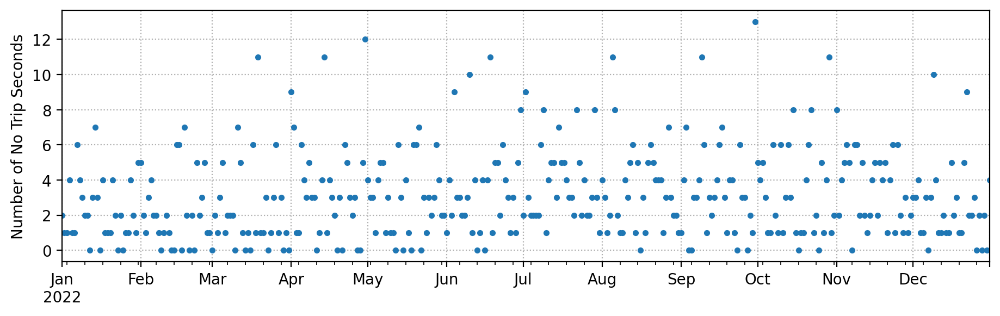

In [77]:
# Q: Is trip seconds missing randomly over date?
ax = (df['Trip Start Timestamp']
      [df['Trip Seconds'].isna()]
      .dt.date
      .value_counts()
      .reindex(index=pd.date_range('2022-01-01', '2022-12-31'), fill_value=0)
      .plot(figsize=(11, 3), marker='.', linestyle='', ylabel='Number of No Trip Seconds'))
ax.grid(linestyle=':')

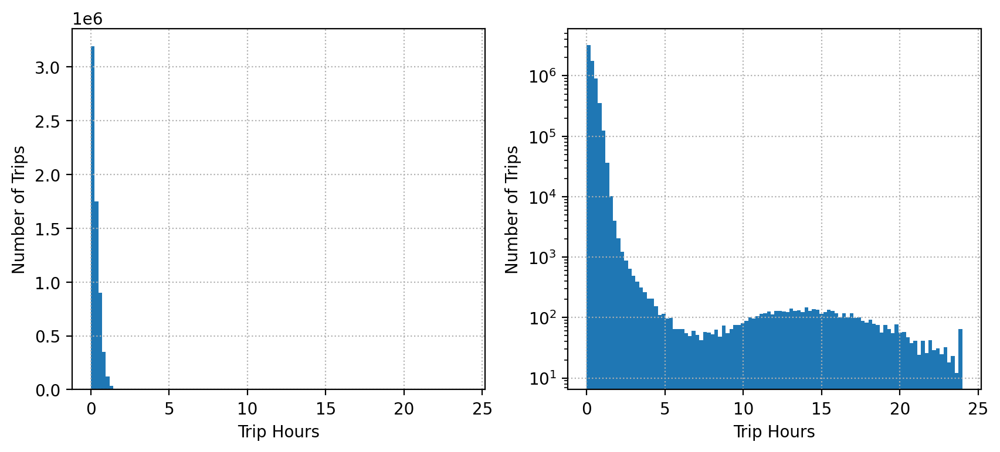

In [78]:
# Q: What is the distribution of trip seconds?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Trip Seconds'] / 3600).hist(ax=ax1, bins=100, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Trip Hours')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Trip Seconds'] / 3600).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Trip Hours')
ax2.set_ylabel('Number of Trips')

plt.show()

In [79]:
# Q: What is the range of trip seconds?
df['Trip Seconds'].min(), df['Trip Seconds'].max(), df['Trip Seconds'].max() / 3600

(0.0, 86341.0, 23.98361111111111)

In [80]:
# Q: Is trip seconds an integer?
idx = df['Trip Seconds'].notna()
(df['Trip Seconds'][idx].round() == df['Trip Seconds'][idx]).all()

True

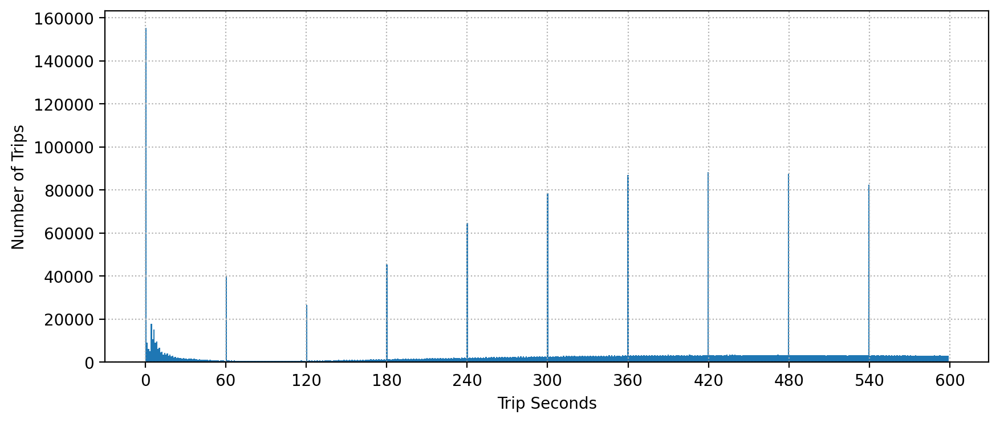

In [81]:
# Q: What is the distribution of trip seconds < 10 mins?
ax = (df['Trip Seconds'][df['Trip Seconds'] < 10 * 60]).hist(figsize=(10, 4), bins=600, grid=False)
ax.set_xticks(np.arange(0, 600 + 0.1, 60))
ax.grid(linestyle=':')
ax.set_xlabel('Trip Seconds')
ax.set_ylabel('Number of Trips');

In [82]:
# Q: What trip seconds represent the spikes above?
df['Trip Seconds'][df['Trip Seconds'] < 600].value_counts().head(10).sort_index()

Trip Seconds
0.0      155315
60.0      40107
120.0     26601
180.0     45509
240.0     64652
300.0     78467
360.0     86876
420.0     88281
480.0     87509
540.0     82453
Name: count, dtype: int64

In [83]:
# Q: Anything special about rows with 0 trip seconds?
df[df['Trip Seconds'] == 0].sample(10)

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
4456039,3bc09b21011b5f48148351aee6fe9b8a54fc9ef9,b9365537031797f54f7e3c06ce06e3e22cf2bb223772cd...,2022-09-18 12:45:00,2022-09-18 12:45:00,0.0,0.0,1.703198e+10,NaN,76.0,NaN,...,4.0,7.25,Cash,Taxi Affiliation Services,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN
3771688,7fd28e6e481511b9ea31ff086c530b9101bb8424,9ff153898c75dbd960a207b660a71f92f79b666dcec98e...,2022-08-13 21:45:00,2022-08-13 21:45:00,0.0,0.0,1.703108e+10,1.703108e+10,8.0,8.0,...,17.5,25.00,Credit Card,Taxi Affiliation Services,41.902788,-87.626146,POINT (-87.6261455896 41.9027880476),41.902788,-87.626146,POINT (-87.6261455896 41.9027880476)
1442452,1cb42b8fd87a0aff1f1ddb073acf3ad248968159,4d8dd79d73d84842c07b0c02f170a812b9bedd4b99a79a...,2022-04-15 16:00:00,2022-04-15 16:00:00,0.0,0.0,NaN,NaN,3.0,3.0,...,36.5,47.80,Credit Card,Choice Taxi Association,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),41.965812,-87.655879,POINT (-87.6558787862 41.96581197)
3341163,2482cf8e285ed048ad0ba43fc1229f40d98f9f34,14685d7c19b1bcf05466194de4a62ee39d4144f9786750...,2022-07-22 13:00:00,2022-07-22 13:00:00,0.0,0.0,NaN,NaN,35.0,35.0,...,0.0,3.25,Cash,Taxi Affiliation Services,41.835118,-87.618678,POINT (-87.6186777673 41.8351179863),41.835118,-87.618678,POINT (-87.6186777673 41.8351179863)
2594192,b44b933a3864cecb37d08ec7729ee01c6ca4fd8b,3f68542d52a06c2f726a08b3888acb6e7979a3ade1b74c...,2022-06-14 00:30:00,2022-06-14 00:30:00,0.0,0.0,NaN,NaN,3.0,3.0,...,0.0,3.25,Cash,Taxi Affiliation Services,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),41.965812,-87.655879,POINT (-87.6558787862 41.96581197)
5249617,342315623cd3d76db195ef3151b36638f2071ee7,4f4cae403660ec4c1e2e3b03128bd7a5af139619e3e513...,2022-10-27 10:00:00,2022-10-27 10:00:00,0.0,0.0,1.703132e+10,1.703132e+10,32.0,32.0,...,0.0,3.25,Cash,Taxi Affiliation Services,41.877406,-87.621972,POINT (-87.6219716519 41.8774061234),41.877406,-87.621972,POINT (-87.6219716519 41.8774061234)
3373602,5ed522a1596e853e2127c80d892ae6e77dd6d5a2,df35bea14bce060878d1332fe8559c86dcf87c517637b4...,2022-07-24 06:45:00,2022-07-24 06:45:00,0.0,0.0,NaN,NaN,8.0,8.0,...,0.0,3.25,Cash,Taxi Affiliation Services,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111)
4439780,e61659a408288c96f0d5edf6c72d4730716635ae,5e3077a68e0439a1168a98d848e9ae3fd8c74f61bc4323...,2022-09-17 14:00:00,2022-09-17 14:00:00,0.0,0.0,NaN,NaN,2.0,NaN,...,0.0,14.25,Cash,Top Cab Affiliation,42.001571,-87.695013,POINT (-87.6950125892 42.001571027),NaN,NaN,NaN
4355367,b07d2197e2ab782eb7ece83c3f3201eae774f0b0,c3bb697ebd10de692888e34f4f3c1ad35d7d5bc0bccc15...,2022-09-13 21:30:00,2022-09-13 21:30:00,0.0,0.0,1.703108e+10,1.703108e+10,8.0,8.0,...,0.0,3.25,Cash,"Taxicab Insurance Agency, LLC",41.892508,-87.626215,POINT (-87.6262149064 41.8925077809),41.892508,-87.626215,POINT (-87.6262149064 41.8925077809)
1872256,cfcd695df32cbd01d689b5607095d405f181fe9b,b83ba3da1a4bc2a686d885ec2f802c3f256c518d93816c...,2022-05-09 18:45:00,2022-05-09 18:45:00,0.0,0.0,1.703132e+10,NaN,32.0,NaN,...,5.0,21.75,Cash,Taxi Affiliation Services,41.870607,-87.622173,POINT (-87.6221729369 41.8706073724),NaN,NaN,NaN


In [84]:
# Q: Does 0 trip seconds always have same trip start and end times?
idx = df['Trip Seconds'] == 0
(df['Trip Start Timestamp'][idx] == df['Trip End Timestamp'][idx]).all()

True

In [85]:
# Q: Does 0 trip seconds always have 0 trip miles?
df['Trip Miles'][df['Trip Seconds'] == 0].value_counts().head(20)

Trip Miles
0.00    148340
0.10      3340
0.20       759
0.30       286
0.40       180
1.00       138
0.50        97
0.60        82
0.70        78
1.10        76
0.90        63
0.80        62
1.20        61
1.30        56
1.40        45
0.01        43
1.80        39
1.60        39
1.50        37
1.90        24
Name: count, dtype: int64

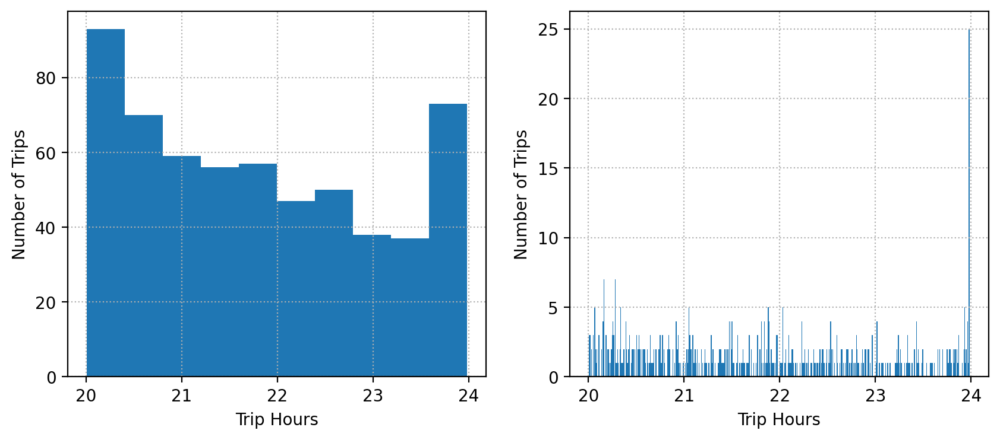

In [86]:
# Q: What is the distribution of trip seconds > 20 hours?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
idx = df['Trip Seconds'] > 20 * 3600
(df['Trip Seconds'][idx] / 3600).hist(ax=ax1, bins=10, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Trip Hours')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Trip Seconds'][idx] / 3600).hist(ax=ax2, bins=500, grid=False)
ax2.grid(linestyle=':')
ax2.set_xlabel('Trip Hours')
ax2.set_ylabel('Number of Trips')

plt.show()

In [87]:
# Q: Anything special about rows with largest trip seconds?
df.nlargest(10, 'Trip Seconds') # df.sort_values('Trip Seconds', ascending=False).head(10)

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location
6288168,a5deb6ab2df749afb7311157e1772f9c143020fe,bd374a36d0bd458e1312943ef55bd51b64d65bdc654154...,2022-12-25 11:45:00,2022-12-26 11:45:00,86341.0,1.94,NaN,NaN,8.0,32.0,...,1.5,9.75,Cash,Sun Taxi,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841)
10032,bdfca001e3fbe3aa83a3923ee3af7cef9ff17520,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-01-02 11:15:00,2022-01-03 11:00:00,86340.0,0.00,NaN,NaN,56.0,6.0,...,0.0,58.25,Credit Card,Globe Taxi,41.792592,-87.769615,POINT (-87.7696154528 41.7925923603),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014)
23719,d2ceca4d538bc6bdb0c7cfde1fdd934580e5350e,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-01-03 15:15:00,2022-01-04 15:15:00,86340.0,0.00,1.703198e+10,NaN,56.0,NaN,...,0.0,84.50,Credit Card,Globe Taxi,41.785999,-87.750934,POINT (-87.7509342894 41.785998518),NaN,NaN,NaN
136776,aa15c3e7cc3a552be9e2c2f6c4c7f5669b62fdf6,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-01-15 11:30:00,2022-01-16 11:15:00,86340.0,0.00,NaN,NaN,8.0,NaN,...,0.0,105.50,Credit Card,Globe Taxi,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),NaN,NaN,NaN
414236,5bc0e6b1d8605920b3c23eb2cec072ac486fa73b,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-02-10 08:45:00,2022-02-11 08:45:00,86340.0,0.00,1.703198e+10,NaN,56.0,NaN,...,0.0,92.50,Credit Card,Globe Taxi,41.785999,-87.750934,POINT (-87.7509342894 41.785998518),NaN,NaN,NaN
723997,acaae1d2bc56fa6288d5676b1a459f0c82991dc5,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-03-04 11:00:00,2022-03-05 11:00:00,86340.0,0.00,1.703184e+10,1.703108e+10,32.0,8.0,...,0.0,40.75,Credit Card,Globe Taxi,41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),41.892508,-87.626215,POINT (-87.6262149064 41.8925077809)
971144,f7ded1b39f3992efc8aac01a4535396cd84062b9,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-03-19 14:15:00,2022-03-20 14:15:00,86340.0,0.00,NaN,NaN,56.0,NaN,...,0.0,55.50,Credit Card,Globe Taxi,41.792592,-87.769615,POINT (-87.7696154528 41.7925923603),NaN,NaN,NaN
1173965,b0827c1f523937c84f9d062f53e295eb2823a99c,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-03-31 08:00:00,2022-04-01 08:00:00,86340.0,0.00,1.703132e+10,NaN,32.0,NaN,...,0.0,109.50,Credit Card,Globe Taxi,41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),NaN,NaN,NaN
1813282,bf4fa12348122bcc9b38e0755933f7fd613f7ac5,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-05-06 13:15:00,2022-05-07 13:15:00,86340.0,0.00,1.703198e+10,NaN,76.0,NaN,...,0.0,105.00,Credit Card,Globe Taxi,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN
2000727,e431bed9f472bbda0fc545e9bab948302f765e39,82436a5c2f9503cc461215c839f24fa16fa7f02d9390bb...,2022-05-16 12:00:00,2022-05-17 12:00:00,86340.0,0.00,NaN,NaN,NaN,NaN,...,0.0,32.25,Credit Card,Globe Taxi,NaN,NaN,NaN,NaN,NaN,NaN


In [88]:
df['trip_time'] = (df['Trip End Timestamp'] - df['Trip Start Timestamp']).dt.total_seconds()
# http://dev.cityofchicago.org/open%20data/data%20portal/2019/04/12/tnp-taxi-privacy.html

/var/folders/_5/5xzxgkc15jdg71sltgfrs8rm0000gn/T/ipykernel_51092/3251285320.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['trip_time'] = (df['Trip End Timestamp'] - df['Trip Start Timestamp']).dt.total_seconds()


In [89]:
# Q: What is the range of derived trip time?
df['trip_time'].min(), df['trip_time'].max(), df['trip_time'].max() / 3600

(0.0, 1788300.0, 496.75)

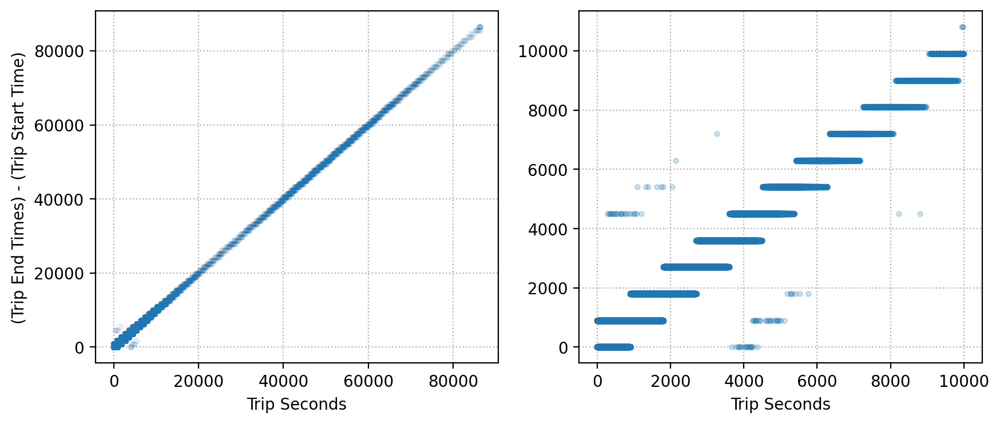

In [90]:
# Q: Is trip seconds vs derived trip time consistent?
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
idx = df['Trip Seconds'].notna()
plt.plot(df['Trip Seconds'][idx], df['trip_time'][idx], '.', alpha=0.01)
plt.xlabel('Trip Seconds')
plt.ylabel('(Trip End Times) - (Trip Start Time)')
plt.grid(linestyle=':')

plt.subplot(1, 2, 2)
idx = df['Trip Seconds'].notna() & (df['Trip Seconds'] < 10000)
plt.plot(df['Trip Seconds'][idx], df['trip_time'][idx], '.', alpha=0.2)
plt.xlabel('Trip Seconds')
plt.grid(linestyle=':')

plt.show()

In [91]:
# Q: Anything special about rows with largest trip time?
df.nlargest(10, 'trip_time')

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
383030,7f5ab878f7da793a989acfbdf26562b5ee334017,daf26343c74ba7742cf4ea2c61ffbff2209dd45f36a891...,2022-02-07 17:00:00,2022-02-28 09:45:00,NaN,1.20,NaN,NaN,3.0,51.0,...,52.25,Unknown,Taxi Affiliation Services,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),41.690633,-87.570058,POINT (-87.5700582686 41.6906333472),1788300.0
2518294,cbe2504677538822edc5fd198d7d3d328a6cdbc2,4f78222d267c08ee7267810e5f3f2241dc61bf1396d036...,2022-06-10 11:45:00,2022-06-30 06:15:00,NaN,12.10,NaN,NaN,8.0,30.0,...,39.25,Cash,"Taxicab Insurance Agency, LLC",41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.839087,-87.714004,POINT (-87.714003807 41.8390869059),1708200.0
1789091,3de00b7c66e0e2b73fd740f08a8f7efd85cdb4ec,cfee0ed5f6fc991e0676185e33e05756684b245a257633...,2022-05-05 11:45:00,2022-05-22 13:15:00,NaN,19.60,1.703198e+10,1.703184e+10,76.0,33.0,...,53.75,Cash,U Taxicab,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),41.849247,-87.624135,POINT (-87.6241352979 41.8492467545),1474200.0
867358,2a9f1a69f80d72f55b1feda68660155d43446bd4,e54b5e0b458fbbfdbd31472d001c5a9fe79aec496e24b4...,2022-03-13 01:30:00,2022-03-28 07:45:00,NaN,16.70,NaN,NaN,76.0,NaN,...,57.40,Credit Card,Choice Taxi Association,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),NaN,NaN,NaN,1318500.0
426592,b5a4a54f0e872dfb6fcc219fdaa681c2b8d226f7,3278a0dd17ed3de47adf8cf7236bf8f21f29e62c04394b...,2022-02-11 03:45:00,2022-02-20 17:15:00,NaN,15.40,NaN,NaN,76.0,7.0,...,48.00,Credit Card,Taxi Affiliation Services,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),826200.0
3625360,a5d3156de72380b0b41de34b1af3bb55c8cd273c,daf26343c74ba7742cf4ea2c61ffbff2209dd45f36a891...,2022-08-06 09:30:00,2022-08-13 12:00:00,NaN,1.10,1.703132e+10,1.703198e+10,32.0,76.0,...,47.75,Credit Card,Taxi Affiliation Services,41.870607,-87.622173,POINT (-87.6221729369 41.8706073724),41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),613800.0
3141146,a34575cf20f0fdcd2b7ec5fefc4d773c4a9de531,6cf97b9e8e3e1c183c090cdd868df381de772a52987239...,2022-07-12 15:15:00,2022-07-19 12:15:00,NaN,0.00,NaN,NaN,22.0,22.0,...,3.25,Cash,Flash Cab,41.922761,-87.699155,POINT (-87.6991553432 41.9227606205),41.922761,-87.699155,POINT (-87.6991553432 41.9227606205),594000.0
5340256,0abc651fe0c0df890c58764de5c7454cadeb2b18,def4d7f708bad8d98ae110c6986f6b77558d0f431abe51...,2022-11-01 17:45:00,2022-11-08 12:45:00,NaN,8.62,1.703198e+10,1.703198e+10,76.0,76.0,...,51.00,Cash,5 Star Taxi,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),586800.0
166590,6775fb2b8591005e5feb7f463e6498a396c5897b,afd6682bb3e13d9d0fc86c0a11d897f505a5d529808311...,2022-01-18 16:45:00,2022-01-25 10:15:00,NaN,0.00,NaN,NaN,NaN,NaN,...,3.25,Cash,Sun Taxi,NaN,NaN,NaN,NaN,NaN,NaN,581400.0
4320046,b2ecd7681dc3e96bd4b1f33884debac1447995a2,dd49823dc32cc1ab686ed5873c2652d7bc1ffde6aac7cc...,2022-09-12 14:00:00,2022-09-19 07:00:00,NaN,0.00,NaN,NaN,2.0,2.0,...,3.25,Cash,Medallion Leasin,42.001571,-87.695013,POINT (-87.6950125892 42.001571027),42.001571,-87.695013,POINT (-87.6950125892 42.001571027),579600.0


In [92]:
# Q: Anything special about rows with inconsistent trip seconds vs derived trip time?
df[(df['Trip Seconds'] - df['trip_time']).abs() > 15 * 60]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
867103,2b916b12d79ba8a79b5cbee62c1d40058d34719f,1aa7696cf1ac4c5d9e302177fdb918829d2ddcd9d420a3...,2022-03-13 01:00:00,2022-03-13 03:00:00,3260.0,10.32,NaN,NaN,70.0,35.0,...,35.75,Prcard,Flash Cab,41.745758,-87.708366,POINT (-87.7083657043 41.7457577128),41.835118,-87.618678,POINT (-87.6186777673 41.8351179863),7200.0
867238,1dd26b34200e2376e2ffcca4fdac3b6e151596af,5648d53206ccad62bbe17e3d36016271b55c5b23916cc0...,2022-03-13 01:15:00,2022-03-13 03:00:00,2131.0,27.41,1.703198e+10,NaN,76.0,NaN,...,127.81,Credit Card,Flash Cab,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN,6300.0
867350,1576ec5b21fa02b5434b84981b36484eea576ca6,678095878a2306fa01b08e520d914baaf2ace4999c5118...,2022-03-13 01:30:00,2022-03-13 03:00:00,2043.0,23.97,NaN,NaN,NaN,NaN,...,91.00,Cash,Flash Cab,NaN,NaN,NaN,NaN,NaN,NaN,5400.0
867371,3e66777056aa36be03320132873964e196c847c2,1cbeb81c014454ffb50758bd2968302bb9a443b3df9889...,2022-03-13 01:30:00,2022-03-13 03:00:00,1620.0,16.30,NaN,NaN,56.0,6.0,...,51.75,Credit Card,Top Cab Affiliation,41.792592,-87.769615,POINT (-87.7696154528 41.7925923603),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),5400.0
867382,54c81ffd18f27fa1c86321fbaf737e9fe38b0f1a,31d18c12a75eaeb647e36a502a0c3e548fe4e08ed6f7f4...,2022-03-13 01:30:00,2022-03-13 03:00:00,1330.0,17.18,NaN,NaN,3.0,NaN,...,94.00,Credit Card,Flash Cab,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),NaN,NaN,NaN,5400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
867644,e143f1e71a6562b430a223fd38cc78497da7a0b8,ac631f0167353286bd820a3d29d38490cf7380d95b59d5...,2022-03-13 03:00:00,2022-03-13 03:15:00,4224.0,0.82,NaN,NaN,8.0,8.0,...,7.50,Cash,City Service,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),900.0
867647,e2c5fab1ff5aeaf8e170ba912c4249c6b1c81dde,4136627ef25b9fad79910c55679c02d8e1f2a42925d29c...,2022-03-13 03:00:00,2022-03-13 03:30:00,5520.0,1.00,NaN,NaN,56.0,7.0,...,57.25,Credit Card,Taxi Affiliation Services,41.792592,-87.769615,POINT (-87.7696154528 41.7925923603),41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),1800.0
867649,e6d778349506a6258058d94cf297d091e0957dd6,0a2412f478181908974ce4f03ac52607833c0a92f3c4ff...,2022-03-13 03:00:00,2022-03-13 03:00:00,4119.0,1.40,NaN,NaN,8.0,32.0,...,8.50,Cash,Globe Taxi,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),0.0
867651,eab514cbbd6fc750a8e7902530a1ac286b6024bf,9a8899dcdf0d6b8a716018392bed8c6dafe929b0b7ea7d...,2022-03-13 03:00:00,2022-03-13 03:15:00,4320.0,4.16,NaN,NaN,6.0,8.0,...,17.29,Mobile,City Service,41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),900.0


In [93]:
# Q: What trip start time have inconsistent trip seconds and derived trip time?
df['Trip Start Timestamp'][(df['Trip Seconds'] - df['trip_time']).abs() > 15 * 60].value_counts().sort_index()

Trip Start Timestamp
2022-03-13 01:00:00     1
2022-03-13 01:15:00     1
2022-03-13 01:30:00     7
2022-03-13 01:45:00    23
2022-03-13 03:00:00    51
Name: count, dtype: int64

In [94]:
# Q: How many missing trip miles?
df['Trip Miles'].isna().sum()

56

In [95]:
# Q: Anything special about rows with missing trip miles?
df[df['Trip Miles'].isna()]

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
561,cbca8a8c3f25c86499bd64b847e7ca47f46e6a3e,201c8f3d95f81b3d765f2ea3fc7a640031a3f73d6dbfb1...,2022-01-01 01:00:00,2022-01-01 01:15:00,1022.0,NaN,NaN,NaN,16.0,32.0,...,36.52,Mobile,Flash Cab,41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),900.0
6998,5440c56a4c96a4800279419918aaa73e5781b8d4,137a3605d33badaf4f3ced9115d44ebd822c90ec3cedcb...,2022-01-01 20:00:00,2022-01-01 20:15:00,379.0,NaN,NaN,NaN,7.0,28.0,...,23.68,Mobile,Flash Cab,41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),41.874005,-87.663518,POINT (-87.6635175498 41.874005383),900.0
10842,ced3875911ddb95261695ded805d788b5e597c58,af81055879d24a95160c247f6cd3e00fe32d1810082902...,2022-01-02 12:45:00,2022-01-02 12:45:00,2.0,NaN,NaN,NaN,8.0,8.0,...,12.93,Mobile,Flash Cab,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),0.0
18182,350a74da7035f5adc4a0c2e034251e3c674c566a,b597697c5b962a3f36ed67d274ec82ed1b72232c537b5a...,2022-01-03 07:00:00,2022-01-03 07:00:00,15.0,NaN,1.703184e+10,1.703184e+10,32.0,32.0,...,11.50,Mobile,Flash Cab,41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),0.0
21907,bfa369223ce70f216b8d7c79700e4b4736604aaf,ddc0a237498a82a0803761188d0ea048623b5d91f29ad2...,2022-01-03 13:00:00,2022-01-03 13:15:00,978.0,NaN,NaN,NaN,5.0,24.0,...,19.40,Mobile,Flash Cab,41.947792,-87.683835,POINT (-87.6838349425 41.9477915865),41.901207,-87.676356,POINT (-87.6763559892 41.9012069941),900.0
59257,48a317592603fb2f3677dd94c7ab83a96b0f3c76,d34bb905b4c5c5e6eb5fd923ee496a3741dddda46d95dc...,2022-01-07 06:00:00,2022-01-07 06:00:00,50.0,NaN,NaN,NaN,8.0,8.0,...,12.57,Mobile,Flash Cab,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),0.0
62676,80fcc5c3121214e61c7a17afe5c0186cc761f17d,7274daf07dd4da878465e03ee2f72165d7e044bcde1c2c...,2022-01-07 13:15:00,2022-01-07 13:15:00,215.0,NaN,1.703108e+10,1.703184e+10,8.0,32.0,...,11.50,Mobile,Flash Cab,41.892508,-87.626215,POINT (-87.6262149064 41.8925077809),41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),0.0
72697,329d68ee4086f0957673abd0e66c1cf27bf27c5e,045270ae331ab61646c36aaf542de0077e97a5b0294e29...,2022-01-08 15:00:00,2022-01-08 15:30:00,1973.0,NaN,NaN,NaN,15.0,28.0,...,37.02,Mobile,Flash Cab,41.954028,-87.763399,POINT (-87.7633990316 41.9540276487),41.874005,-87.663518,POINT (-87.6635175498 41.874005383),1800.0
77245,380b8cde878cbe9699dfba795d71884ee1f50628,cf39200ae52386dfa52be5a8e1da54653690fac9fba627...,2022-01-09 01:15:00,2022-01-09 01:15:00,2.0,NaN,NaN,NaN,8.0,8.0,...,11.50,Mobile,Flash Cab,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),0.0
77512,0f5527b65af977285e15163b7ff86b7a8366093a,201c8f3d95f81b3d765f2ea3fc7a640031a3f73d6dbfb1...,2022-01-09 02:30:00,2022-01-09 02:30:00,887.0,NaN,NaN,NaN,21.0,2.0,...,29.96,Mobile,Flash Cab,41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),42.001571,-87.695013,POINT (-87.6950125892 42.001571027),0.0


In [96]:
df[df['Trip Miles'].isna()].count() # Most still have trip seconds and pickup dropoff locations

Trip ID                       56
Taxi ID                       56
Trip Start Timestamp          56
Trip End Timestamp            56
Trip Seconds                  55
Trip Miles                     0
Pickup Census Tract           16
Dropoff Census Tract          16
Pickup Community Area         50
Dropoff Community Area        51
Fare                          56
Tips                          56
Tolls                         56
Extras                        56
Trip Total                    56
Payment Type                  56
Company                       56
Pickup Centroid Latitude      50
Pickup Centroid Longitude     50
Pickup Centroid Location      50
Dropoff Centroid Latitude     51
Dropoff Centroid Longitude    51
Dropoff Centroid  Location    51
trip_time                     56
dtype: int64

In [97]:
# Q: Is trip miles missing randomly over date?
df['Trip Start Timestamp'][df['Trip Miles'].isna()].dt.month.value_counts().sort_index()

Trip Start Timestamp
1     15
2     10
3      7
4      3
5      3
6      6
7      2
8      2
9      3
10     2
11     2
12     1
Name: count, dtype: int64

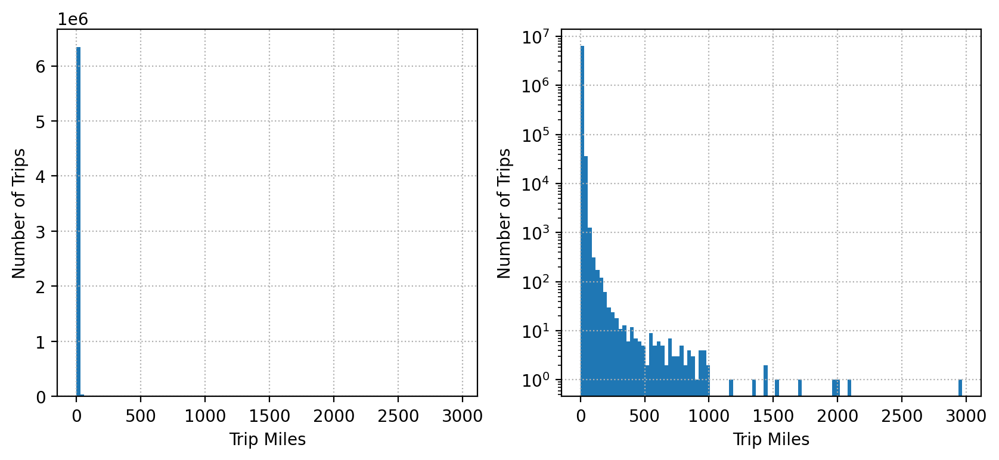

In [98]:
# Q: What is the distribution of trip miles?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Trip Miles']).hist(ax=ax1, bins=100, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Trip Miles')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Trip Miles']).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Trip Miles')
ax2.set_ylabel('Number of Trips')

plt.show()

In [99]:
# Q: What is the range of trip miles?
df['Trip Miles'].min(), df['Trip Miles'].max(), df['Trip Miles'].max() * 1.609344 # In km

(0.0, 2967.54, 4775.7926937600005)

In [100]:
# Q: How many 0 trip miles?
df['Trip Miles'].value_counts().sort_index()

Trip Miles
0.00       794965
0.01        12989
0.02         9231
0.03         6851
0.04         5409
            ...  
1708.96         1
1985.20         1
2001.53         1
2087.55         1
2967.54         1
Name: count, Length: 7105, dtype: int64

In [101]:
# Q: What fraction of 0 trip seconds when 0 trip miles?
(df['Trip Seconds'][df['Trip Miles'] == 0] == 0).mean()

0.18659941003691988

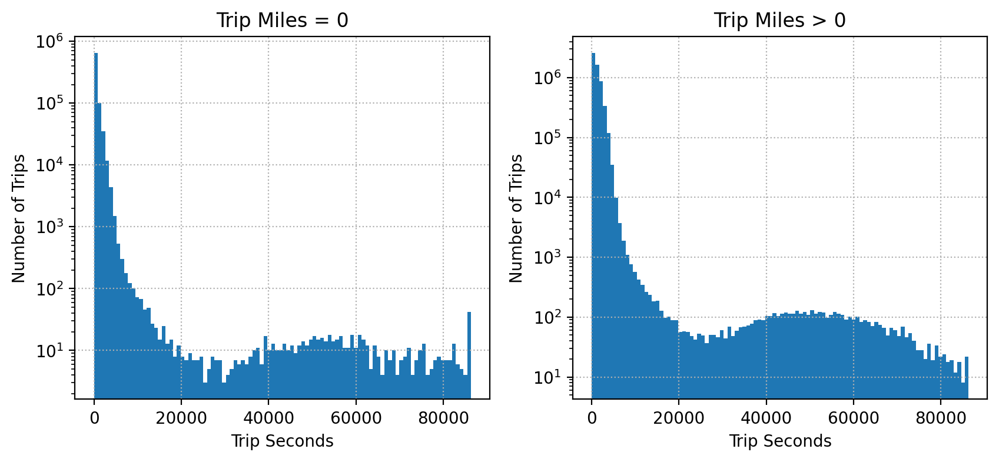

In [102]:
# Q: What is the distribution of trip seconds when 0 trip miles?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Trip Seconds'][df['Trip Miles'] == 0]).hist(ax=ax1, bins=100, grid=False)
ax1.set_yscale('log')
ax1.grid(linestyle=':')
ax1.set_xlabel('Trip Seconds')
ax1.set_ylabel('Number of Trips')
ax1.set_title('Trip Miles = 0')

ax2 = plt.subplot(1, 2, 2)
(df['Trip Seconds'][df['Trip Miles'] > 0]).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Trip Seconds')
ax2.set_ylabel('Number of Trips')
ax2.set_title('Trip Miles > 0')

plt.show()

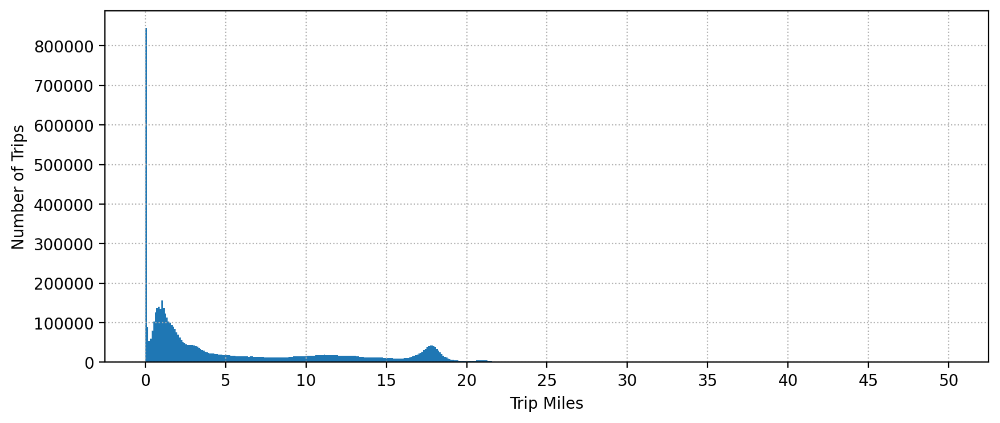

In [103]:
# Q: What is the distribution of trip miles < 50 miles?
ax = (df['Trip Miles'][df['Trip Miles'] < 50]).hist(figsize=(10, 4), bins=500, grid=False)
ax.set_xticks(np.arange(0, 50 + 0.1, 5))
ax.grid(linestyle=':')
ax.set_xlabel('Trip Miles')
ax.set_ylabel('Number of Trips');

In [104]:
# Q: Anything special about rows with longest trip miles?
df.nlargest(10, 'Trip Miles')

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
4043670,d2ef078e993f6ffa30c83ff1b44be36a236cb8e1,f20c9c5845dab1e51799b959d378c102763d4b31d738da...,2022-08-28 03:00:00,2022-08-28 03:15:00,1025.0,2967.54,NaN,NaN,NaN,8.0,...,32.48,Cash,Flash Cab,NaN,NaN,NaN,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),900.0
140624,c2c943d04e5c9cab7da366f61e366f0a363395f2,8ef1056519939d511d24008e394f83e925d2539d668a00...,2022-01-15 18:30:00,2022-01-15 18:30:00,2.0,2087.55,NaN,NaN,8.0,8.0,...,11.67,Mobile,Flash Cab,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),0.0
4275763,d65869e036de250f188dab6eb5ad2633a98bcef7,9b073503fc82b659145a716c7080758226d4dc63158673...,2022-09-10 09:00:00,2022-09-10 09:00:00,486.0,2001.53,NaN,NaN,28.0,28.0,...,8.75,Cash,Blue Ribbon Taxi Association,41.874005,-87.663518,POINT (-87.6635175498 41.874005383),41.874005,-87.663518,POINT (-87.6635175498 41.874005383),0.0
3834321,63679d8944f674faba7f453ffc02ac4557d82cc6,c8c3f1713dadc77d30d959755c933092b402d0c3cef08e...,2022-08-17 13:00:00,2022-08-22 15:15:00,NaN,1985.20,NaN,NaN,NaN,NaN,...,5359.75,Cash,Medallion Leasin,NaN,NaN,NaN,NaN,NaN,NaN,440100.0
3834250,231c39254b2dade1be1545e16d181ef1739cee1f,c8c3f1713dadc77d30d959755c933092b402d0c3cef08e...,2022-08-17 13:00:00,2022-08-19 12:00:00,NaN,1708.96,NaN,NaN,NaN,NaN,...,4036.50,Cash,Medallion Leasin,NaN,NaN,NaN,NaN,NaN,NaN,169200.0
5655507,dd9651fbd8161c0f288d4fd5f66786e4e1868d4e,84957c8960b674346784746bbc1d48cafff4976b162323...,2022-11-17 23:45:00,2022-11-17 23:45:00,2.0,1513.46,NaN,NaN,8.0,8.0,...,13.67,Mobile,Flash Cab,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),0.0
6016505,eb6706718607e1f3470242ea5056f2e66c49fdab,edd72a023f2bffadbf0081c4bb036a7137fec79c3e9ce4...,2022-12-08 21:15:00,2022-12-08 21:30:00,643.0,1449.68,NaN,NaN,3.0,1.0,...,14.06,Mobile,Flash Cab,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),42.009623,-87.670167,POINT (-87.6701668569 42.0096228806),900.0
1370121,90e96b6cbcdb64f045112934516973cf7a71e47f,1cbeb81c014454ffb50758bd2968302bb9a443b3df9889...,2022-04-11 13:30:00,2022-04-11 13:30:00,60.0,1442.80,1.703121e+10,1.703121e+10,21.0,21.0,...,23.25,Cash,Top Cab Affiliation,41.942873,-87.701330,POINT (-87.701330291 41.9428725376),41.942873,-87.701330,POINT (-87.701330291 41.9428725376),0.0
1370415,eb0435c4aba344d8b7f75c04ebbd25cc0a522d49,1cbeb81c014454ffb50758bd2968302bb9a443b3df9889...,2022-04-11 13:45:00,2022-04-11 13:45:00,240.0,1358.70,NaN,NaN,21.0,21.0,...,69.50,Cash,Top Cab Affiliation,41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),0.0
3058128,2c5f7352c66bf70c32b28eca93b4250204d8b625,d032016cdde07ebbac8ab34b98a534aed192e1c86d610f...,2022-07-07 22:15:00,2022-07-09 14:45:00,NaN,1164.64,NaN,NaN,2.0,2.0,...,3009.25,Cash,Medallion Leasin,42.001571,-87.695013,POINT (-87.6950125892 42.001571027),42.001571,-87.695013,POINT (-87.6950125892 42.001571027),145800.0


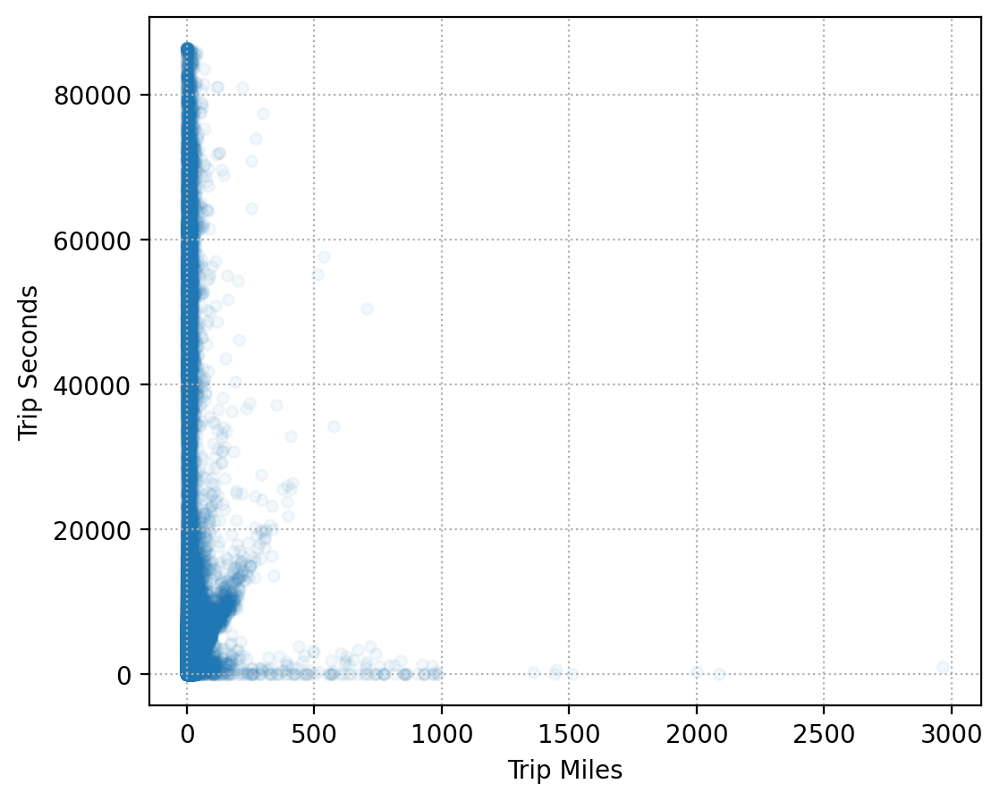

In [105]:
ax = df.plot.scatter(x='Trip Miles', y='Trip Seconds', alpha=0.05, figsize=(6, 5))
ax.grid(linestyle=':')

In [106]:
# Q: Do all trip miles have at most 2 deicmal places?
def num_decimal(x):
    try:
        return len(str(x).split('.')[1])
    except IndexError:
        return 0

df['Trip Miles'].map(lambda x: num_decimal(x) <= 2).all() # See .apply()

True

In [107]:
is_dirty = (df['Trip Seconds'].isna() |
            ((df['Trip Seconds'] - df['trip_time']).abs() > 15 * 60) |
            df['Trip Miles'].isna())

is_dirty.sum()

1269

In [108]:
df = df[~is_dirty]

In [109]:
# Q: Are pickup centroid missing simultaneously?
df[df.columns[df.columns.str.startswith('Pickup Centroid')]].apply(pd.isna).value_counts()

Pickup Centroid Latitude  Pickup Centroid Longitude  Pickup Centroid Location
False                     False                      False                       5869581
True                      True                       True                         510888
Name: count, dtype: int64

In [110]:
# Q: Does at least one of pickup census tract or community area exist when pickup centroid exists?
(df
 [['Pickup Census Tract', 'Pickup Community Area']]
 [df['Pickup Centroid Location'].notna()]
 .notna()
 .any(axis=1)
 .all())
# http://dev.cityofchicago.org/open%20data/data%20portal/2019/04/12/tnp-taxi-privacy.html

True

In [111]:
# Q: Are dropoff centroid missing simultaneously?
df[df.columns[df.columns.str.startswith('Dropoff Centroid')]].apply(pd.isna).value_counts().reset_index()

,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,count
0,False,False,False,5783345
1,True,True,True,597124


In [112]:
# Q: Does at least one of dropoff census tract or community area exist when dropoff centroid exists?
(df
 [['Dropoff Census Tract', 'Dropoff Community Area']]
 [df['Dropoff Centroid  Location'].notna()]
 .notna()
 .any(axis=1)
 .all())

True

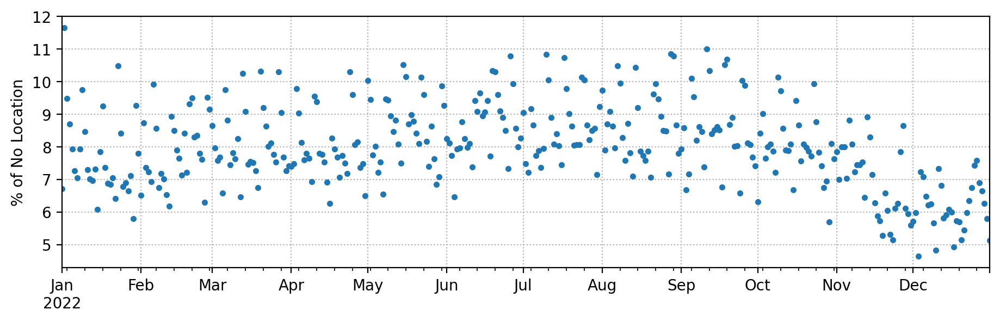

In [113]:
# Q: Is pickup dropoff location missing randomly over date?
ax = (df
      .assign(no_location=df['Pickup Centroid Location'].isna() | df['Pickup Centroid Location'].isna())
      .groupby(df['Trip Start Timestamp'].dt.date) # https://pandas.pydata.org/docs/user_guide/groupby.html
      ['no_location']
      .mean()
      .mul(100)
      .reindex(index=pd.date_range('2022-01-01', '2022-12-31'), fill_value=0)
      .plot(figsize=(11, 3), marker='.', linestyle='', ylabel='% of No Location'))
ax.grid(linestyle=':')

In [114]:
is_dirty = (df['Pickup Centroid Location'].isna() |
            df['Dropoff Centroid  Location'].isna())

is_dirty.sum()

879965

In [115]:
df = df[~is_dirty]

In [116]:
# Q: Do pickup dropoff centroid location have same format?
(df['Pickup Centroid Location'].str.startswith('POINT (').all(),
 df['Pickup Centroid Location'].str.endswith(')').all(),
 df['Dropoff Centroid  Location'].str.startswith('POINT (').all(),
 df['Dropoff Centroid  Location'].str.endswith(')').all())
# https://pandas.pydata.org/docs/user_guide/text.html

(True, True, True, True)

In [117]:
# Q: Is pickup centroid location consistent with its longitude and latitude?
pickup_coord = (df
                ['Pickup Centroid Location']
                .str[7:-1]
                .str.split(expand=True)
                .rename(columns={0: 'pickup_longitude', 1: 'pickup_latitude'})
                .map(float))

np.abs(df[['Pickup Centroid Longitude', 'Pickup Centroid Latitude']].to_numpy() - pickup_coord.to_numpy()).max()

5.000089231543825e-10

In [118]:
# Q: Is dropoff centroid location consistent with its longitude and latitude?
dropoff_coord = (df
                 ['Dropoff Centroid  Location']
                 .str[7:-1]
                 .str.split(expand=True)
                 .rename(columns={0: 'dropoff_longitude', 1: 'dropoff_latitude'})
                 .map(float))

np.abs(df[['Dropoff Centroid Longitude', 'Dropoff Centroid Latitude']].to_numpy() - dropoff_coord.to_numpy()).max()

5.000089231543825e-10

In [119]:
# Q: What is the range of longitude and latitude?
df[['Pickup Centroid Longitude',
    'Dropoff Centroid Longitude',
    'Pickup Centroid Latitude',
    'Dropoff Centroid Latitude']].describe(percentiles=[0.5]).round(2)

,Pickup Centroid Longitude,Dropoff Centroid Longitude,Pickup Centroid Latitude,Dropoff Centroid Latitude
count,5500504.00,5500504.00,5500504.00,5500504.00
mean,-87.68,-87.66,41.90,41.89
std,0.10,0.07,0.06,0.06
min,-87.91,-87.91,41.65,41.66
50%,-87.63,-87.63,41.89,41.89
max,-87.53,-87.53,42.02,42.02


In [120]:
df.count()

Trip ID                       5500504
Taxi ID                       5500504
Trip Start Timestamp          5500504
Trip End Timestamp            5500504
Trip Seconds                  5500504
Trip Miles                    5500504
Pickup Census Tract           2519314
Dropoff Census Tract          2519314
Pickup Community Area         5498273
Dropoff Community Area        5470693
Fare                          5497895
Tips                          5497895
Tolls                         5497895
Extras                        5497895
Trip Total                    5497895
Payment Type                  5500504
Company                       5500504
Pickup Centroid Latitude      5500504
Pickup Centroid Longitude     5500504
Pickup Centroid Location      5500504
Dropoff Centroid Latitude     5500504
Dropoff Centroid Longitude    5500504
Dropoff Centroid  Location    5500504
trip_time                     5500504
dtype: int64

In [121]:
# Q: Are fare, tips, tolls, extras, and trip total missing simultaneously?
fare_cols = ['Fare', 'Tips', 'Tolls', 'Extras', 'Trip Total']
df[fare_cols].apply(pd.isna).value_counts()

Fare   Tips   Tolls  Extras  Trip Total
False  False  False  False   False         5497895
True   True   True   True    True             2609
Name: count, dtype: int64

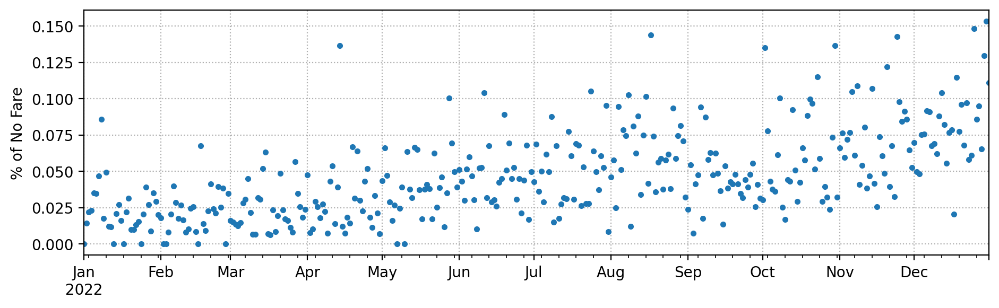

In [122]:
# Q: Is fare etc missing randomly over date?
ax = (df
      .assign(no_fare=df['Fare'].isna())
      .groupby(df['Trip Start Timestamp'].dt.date)
      ['no_fare']
      .mean()
      .mul(100)
      .reindex(index=pd.date_range('2022-01-01', '2022-12-31'), fill_value=0)
      .plot(figsize=(11, 3), marker='.', linestyle='', ylabel='% of No Fare'))
ax.grid(linestyle=':')

In [123]:
# Q: Is fare etc missing randomly per company?
idx = df['Fare'].isna()
pd.concat([(df['Company'][idx].value_counts() / idx.sum()).rename('No Fare %'),
           (df['Company'].value_counts() / df['Company'].count()).rename('Company Share %')],
          join='inner', axis=1).round(4) * 100

,No Fare %,Company Share %
Company,,
Taxicab Insurance Agency Llc,31.39,4.52
City Service,18.90,9.34
Flash Cab,15.64,21.96
Star North Taxi Management Llc,15.37,2.35
Sun Taxi,12.11,10.89
Globe Taxi,1.72,3.77
Chicago Independents,1.69,4.96
5 Star Taxi,1.03,2.33
Blue Ribbon Taxi Association,0.69,2.53


In [124]:
# Q: Is fare etc missing randomly per payment type?
idx = df['Fare'].isna()
pd.concat([(df['Payment Type'][idx].value_counts() / idx.sum()).rename('No Fare %'),
           (df['Payment Type'].value_counts() / df['Payment Type'].count()).rename('Payment Type %')],
          join='inner', axis=1).round(4) * 100

,No Fare %,Payment Type %
Payment Type,,
Cash,97.93,32.11
Credit Card,1.92,36.56
Mobile,0.11,16.07
Prcard,0.04,9.89


In [125]:
# Q: What is the range of fare etc?
df[fare_cols].describe().round(2)

,Fare,Tips,Tolls,Extras,Trip Total
count,5497895.00,5497895.00,5497895.00,5497895.00,5497895.00
mean,19.65,2.44,0.02,1.28,23.54
std,44.99,3.61,8.00,21.82,52.63
min,0.00,0.00,0.00,0.00,0.00
25%,7.50,0.00,0.00,0.00,9.50
50%,12.21,0.07,0.00,0.00,14.82
75%,30.00,3.18,0.00,1.00,31.50
max,9900.26,321.08,6666.66,8888.88,9900.26


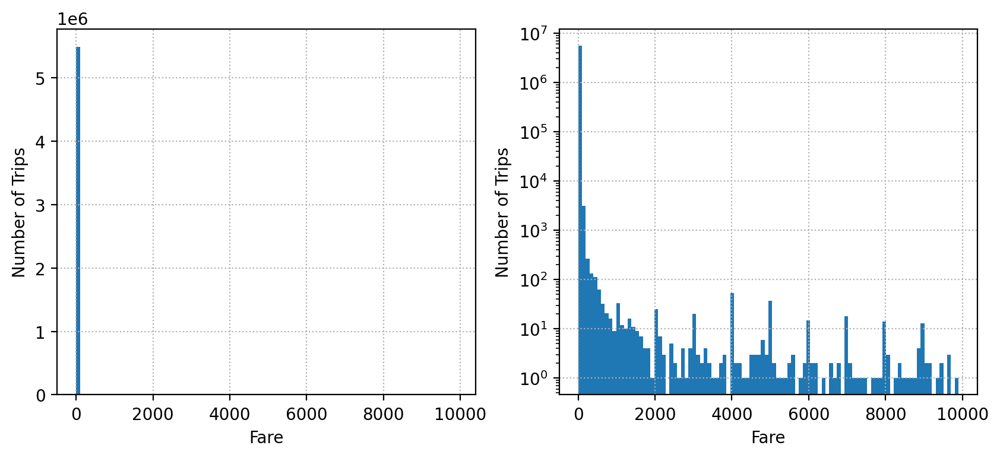

In [126]:
# Q: What is the distribution of fare?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Fare']).hist(ax=ax1, bins=100, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Fare')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Fare']).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Fare')
ax2.set_ylabel('Number of Trips')

plt.show()

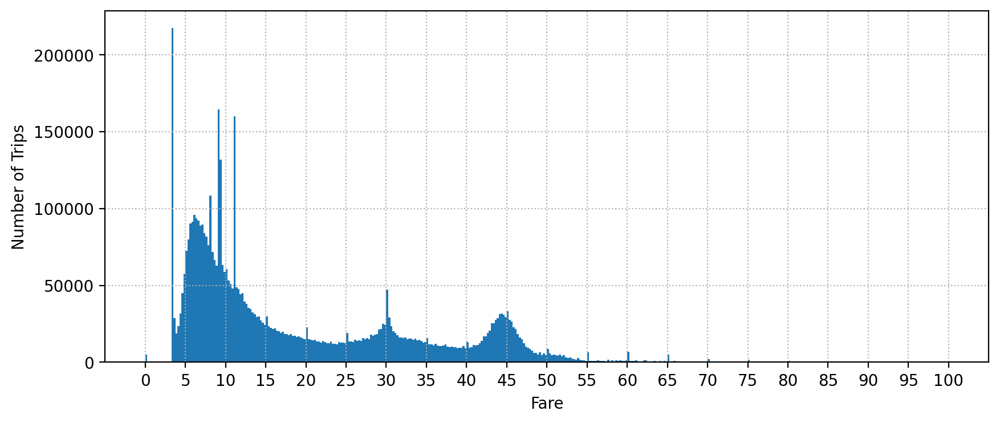

In [127]:
# Q: What is the distribution of fare <= $100?
ax = (df['Fare'][df['Fare'] <= 100]).hist(figsize=(10, 4), bins=400, grid=False)
ax.set_xticks(np.arange(0, 100 + 0.1, 5))
ax.grid(linestyle=':')
ax.set_xlabel('Fare')
ax.set_ylabel('Number of Trips');

In [128]:
# Q: What fare represents the spikes above?
df['Fare'].value_counts().head(10) # $3.25 is base fare https://yellowcabchicago.com/rates/

Fare
3.25     217486
9.00     155942
11.00    146498
8.00     105407
6.00      95859
6.25      93624
6.50      92010
5.75      91274
5.50      90163
7.00      89440
Name: count, dtype: int64

In [129]:
# Q: What fare represents the spike around $30?
df['Fare'][df['Fare'].between(20, 40)].value_counts().head(5)

Fare
30.00    46804
30.25    28716
29.50    24360
29.75    23784
30.50    22923
Name: count, dtype: int64

In [130]:
# Q: How many $0 fare?
df['Fare'].value_counts().sort_index()

Fare
0.00       4036
0.01        779
0.02         41
0.03         17
0.04         24
           ... 
9500.55       1
9628.63       1
9700.25       1
9700.31       1
9900.26       1
Name: count, Length: 7237, dtype: int64

In [131]:
# Q: Anything special about rows with $0 fare?
zone_cols = ['Pickup Census Tract', 'Dropoff Census Tract', 'Pickup Community Area', 'Dropoff Community Area']
df[df['Fare'] == 0].sample(10).drop(labels=zone_cols, axis='columns')

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Fare,Tips,Tolls,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
2121438,c88dd928aa4bc9acf39f4c194f95b76aed894e04,2d3cbab27df38cfd4fa3321ffca7824030be39c277585f...,2022-05-21 22:30:00,2022-05-21 22:30:00,60.0,0.00,0.0,0.0,0.0,3.0,3.0,Cash,"Taxicab Insurance Agency, LLC",41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),0.0
2919216,9985938b79332cf21e2adee4998533aae4b00ba4,d1d88b89ceb6d753007b6e795e3c24f4bea905a51e9d47...,2022-06-29 16:00:00,2022-06-29 16:00:00,2.0,0.00,0.0,0.0,0.0,0.0,0.0,Cash,Flash Cab,41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),0.0
3933079,37d6be299885c9b75b95bd58b69881292e50c966,7451df09e230673241da1f39213f5f18725f1d02631bae...,2022-08-22 13:15:00,2022-08-22 13:15:00,60.0,0.00,0.0,0.0,0.0,0.0,0.0,Cash,"Taxicab Insurance Agency, LLC",41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),0.0
1493233,9db81f231e99ba9d088669c0754257f9bfcbac8c,fc8be1ea1e079a3aa4af2ffe9f1c120c15770e0ae7b632...,2022-04-18 20:45:00,2022-04-18 21:00:00,1021.0,3.35,0.0,0.0,0.0,0.0,0.0,Cash,Chicago Independents,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.900070,-87.720918,POINT (-87.7209182385 41.9000696026),900.0
3336265,46c2662fd2bc4969a0e068f095d452b5d99991a0,2519839bf9f934467cc32afcc9c18454ba976c46b3934f...,2022-07-22 08:15:00,2022-07-22 08:15:00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,Cash,Taxi Affiliation Services,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),0.0
1140740,d42526dc16812f867a5fcb5d76bafab8c24ba89b,bf0b987f41a8c368a072da293f9fb1aecc8a39763ab6a4...,2022-03-29 11:45:00,2022-03-29 11:45:00,1.0,0.00,0.0,0.0,0.0,0.0,0.0,Cash,Flash Cab,41.833518,-87.681356,POINT (-87.6813558293 41.8335178865),41.833518,-87.681356,POINT (-87.6813558293 41.8335178865),0.0
1419950,71a3b76b92b477e07ea9846d8673e00eb838d55a,d6fd39863cdce99011c7282605bedf70d9d059ecf0da5e...,2022-04-14 13:00:00,2022-04-14 13:15:00,634.0,1.33,0.0,0.0,0.0,0.0,0.0,Cash,Chicago Independents,41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),41.870607,-87.622173,POINT (-87.6221729369 41.8706073724),900.0
5812086,fbc1bf5bb1f1fb164ada50177670142fa0262f6a,e93472aad9e00c0a523e1a861ae897303548d713ba63d3...,2022-11-28 14:15:00,2022-11-28 14:15:00,1.0,0.00,0.0,0.0,0.0,0.0,0.0,Cash,5 Star Taxi,41.979855,-87.694096,POINT (-87.6940960217 41.9798553089),41.979855,-87.694096,POINT (-87.6940960217 41.9798553089),0.0
1127380,b5cd7a08331071666f855bb1d601f4818b121dbf,b00c5a92a2d7cd526d9ca9a5b63b98eb3111a00db69c57...,2022-03-28 15:15:00,2022-03-28 15:30:00,654.0,3.71,0.0,0.0,0.0,0.0,0.0,Cash,City Service,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),900.0
5893719,48e0e8112bc2cd03c52dffbdd17d93de7ba759b9,f9dfe19ff656e73355417487428709a9849e91accd2b24...,2022-12-02 08:30:00,2022-12-02 08:30:00,3.0,0.00,0.0,0.0,0.0,0.0,0.0,Cash,Flash Cab,41.892042,-87.631864,POINT (-87.6318639497 41.8920421365),41.892042,-87.631864,POINT (-87.6318639497 41.8920421365),0.0


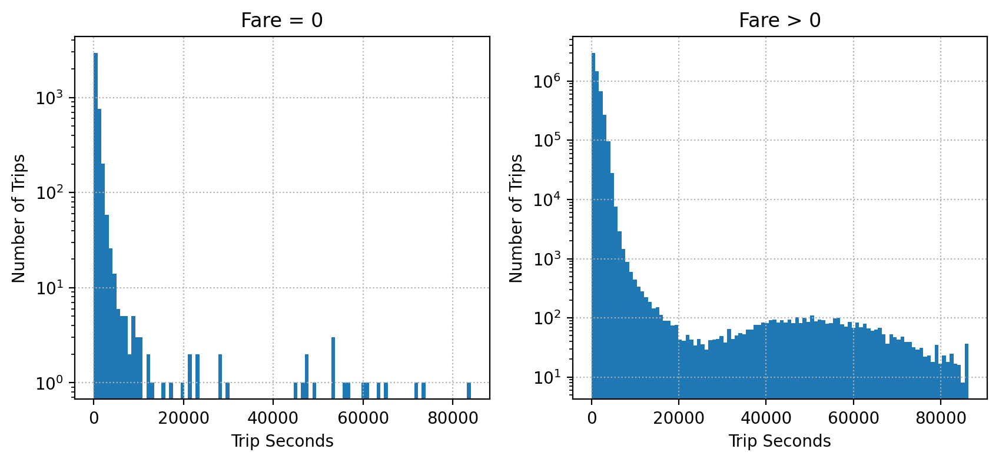

In [132]:
# Q: What is the distribution of trip seconds when $0 fare?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Trip Seconds'][df['Fare'] == 0]).hist(ax=ax1, bins=100, grid=False)
ax1.set_yscale('log')
ax1.grid(linestyle=':')
ax1.set_xlabel('Trip Seconds')
ax1.set_ylabel('Number of Trips')
ax1.set_title('Fare = 0')

ax2 = plt.subplot(1, 2, 2)
(df['Trip Seconds'][df['Fare'] > 0]).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Trip Seconds')
ax2.set_ylabel('Number of Trips')
ax2.set_title('Fare > 0')

plt.show()

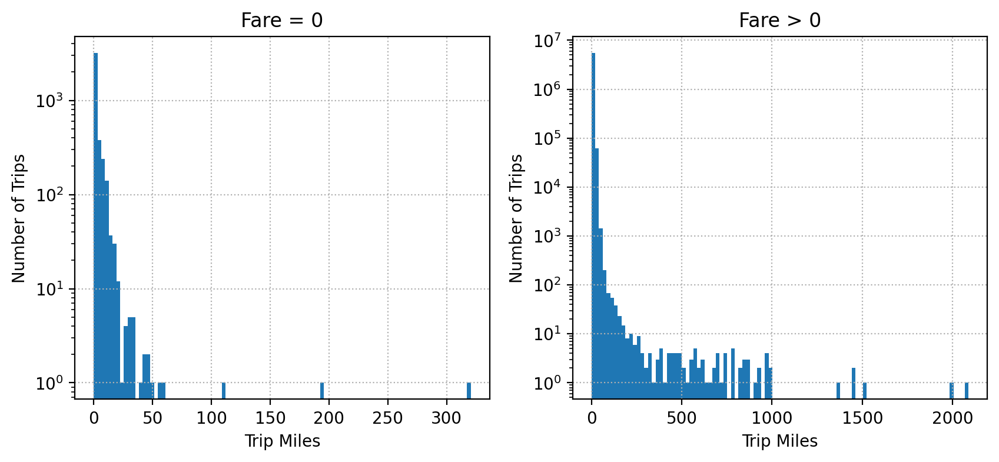

In [133]:
# Q: What is the distribution of trip miles when $0 fare?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Trip Miles'][df['Fare'] == 0]).hist(ax=ax1, bins=100, grid=False)
ax1.set_yscale('log')
ax1.grid(linestyle=':')
ax1.set_xlabel('Trip Miles')
ax1.set_ylabel('Number of Trips')
ax1.set_title('Fare = 0')

ax2 = plt.subplot(1, 2, 2)
(df['Trip Miles'][df['Fare'] > 0]).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Trip Miles')
ax2.set_ylabel('Number of Trips')
ax2.set_title('Fare > 0')

plt.show()

In [134]:
# Q: Anything special about rows with high fare?
df.nlargest(10, 'Fare').drop(labels=zone_cols, axis='columns')

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Fare,Tips,Tolls,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
1723949,08cf2feae3ba3d3df719693fa46e383ff039ff2b,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-05-01 18:30:00,2022-05-01 18:45:00,980.0,0.0,9900.26,0.0,0.0,0.00,9900.26,Cash,Metro Jet Taxi A.,41.901207,-87.676356,POINT (-87.6763559892 41.9012069941),41.985015,-87.804532,POINT (-87.8045320063 41.9850151008),900.0
1236235,2e6b53b34c3efb60b7f4a0ebe04ccac5955bf1f3,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-04-03 20:45:00,2022-04-03 21:30:00,2543.0,0.0,9700.31,0.0,0.0,0.00,9700.31,Cash,Metro Jet Taxi A.,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.763247,-87.616134,POINT (-87.6161341112 41.7632467988),2700.0
659041,3fc1bf2572dcf440b9a536b44be4ee5f26a83cab,12bfcfb8715a63cacb9a4bc127f622071bab27b36a8488...,2022-02-28 00:15:00,2022-02-28 00:15:00,843.0,0.0,9700.25,0.0,0.0,0.04,9700.29,Cash,Chicago Taxicab,41.792592,-87.769615,POINT (-87.7696154528 41.7925923603),41.874005,-87.663518,POINT (-87.6635175498 41.874005383),0.0
6038279,1957668e5af6e4ea46b82e22b4e7f28b1c7a85cd,279e6ef4129260b19e953938f5ca14fba369cbd6db1f06...,2022-12-09 20:30:00,2022-12-09 20:45:00,660.0,3.7,9628.63,0.0,0.0,1.00,9629.63,Cash,Taxi Affiliation Services,41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),900.0
2434952,c7136ac7320e201720df408fe4a8ba5803dc0258,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-06-06 15:30:00,2022-06-06 17:00:00,5210.0,0.1,9500.55,0.0,0.0,0.05,9500.60,Cash,Metro Jet Taxi A.,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),5400.0
2290500,ceed52473fa0b58821afc2dd5a6ffd3af05ab6e5,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-05-30 22:00:00,2022-05-30 22:00:00,708.0,0.0,9500.24,0.0,0.0,0.04,9500.28,Cash,Metro Jet Taxi A.,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),0.0
2370102,427ef5ffa380bc9f210553f2584b5af321597bb5,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-06-03 17:00:00,2022-06-03 17:30:00,1953.0,0.0,9400.27,0.0,0.0,0.04,9400.31,Cash,Metro Jet Taxi A.,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.983636,-87.723583,POINT (-87.7235831853 41.9836363072),1800.0
2896434,953114fc15bc120df929573780d4bbc7bb33b829,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-06-28 14:30:00,2022-06-28 14:45:00,1579.0,0.0,9200.25,0.0,0.0,0.04,9200.29,Cash,Metro Jet Taxi A.,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),900.0
1186208,33f4981aacb2302d71c634fdec48583454323ff8,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-03-31 18:15:00,2022-03-31 19:00:00,2986.0,43.7,9111.10,0.0,0.0,31.00,9142.10,Cash,Metro Jet Taxi A.,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),41.867902,-87.642959,POINT (-87.6429586652 41.8679024175),2700.0
2781903,6529d483ad7f1e9f63f6b2a86e1f7f096afdc476,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-06-22 20:00:00,2022-06-22 20:15:00,940.0,0.0,9100.24,0.0,0.0,0.00,9100.24,Cash,Metro Jet Taxi A.,41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),41.953582,-87.723452,POINT (-87.7234523905 41.9535821253),900.0


In [135]:
# Q: Which company has fare > $500?
idx = df['Fare'] > 500
pd.concat([(df['Company'][idx].value_counts() / idx.sum()).rename('> $500 Fare Share %'),
           (df['Company'].value_counts() / df['Company'].count()).rename('Market Share %')],
          join='inner', axis=1).round(4) * 100

,> $500 Fare Share %,Market Share %
Company,,
Metro Jet Taxi A.,76.42,0.09
Taxi Affiliation Services,6.22,21.94
Chicago Taxicab,5.30,0.29
"Taxicab Insurance Agency, LLC",4.20,4.00
Medallion Leasin,1.46,4.10
Flash Cab,1.10,21.96
Chicago Independents,0.91,4.96
Sun Taxi,0.91,10.89
Blue Ribbon Taxi Association,0.73,2.53


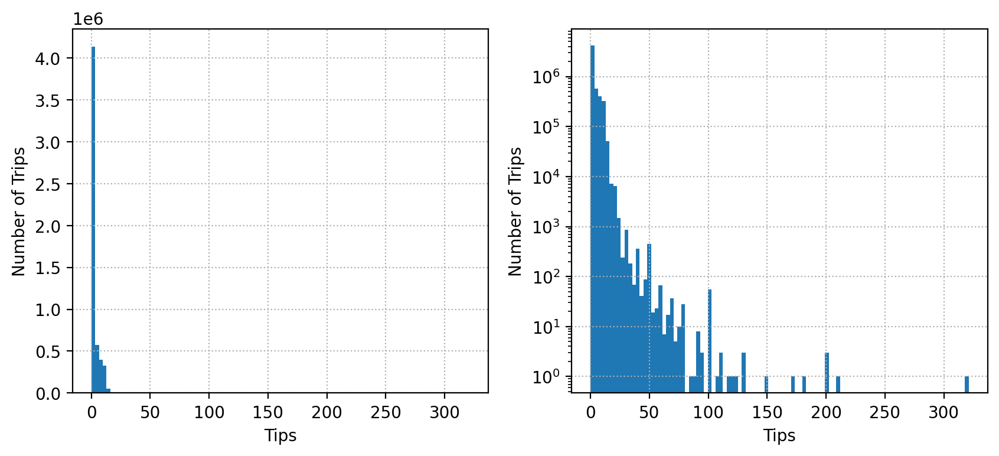

In [136]:
# Q: What is the distribution of tips?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Tips']).hist(ax=ax1, bins=100, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Tips')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Tips']).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Tips')
ax2.set_ylabel('Number of Trips')

plt.show()

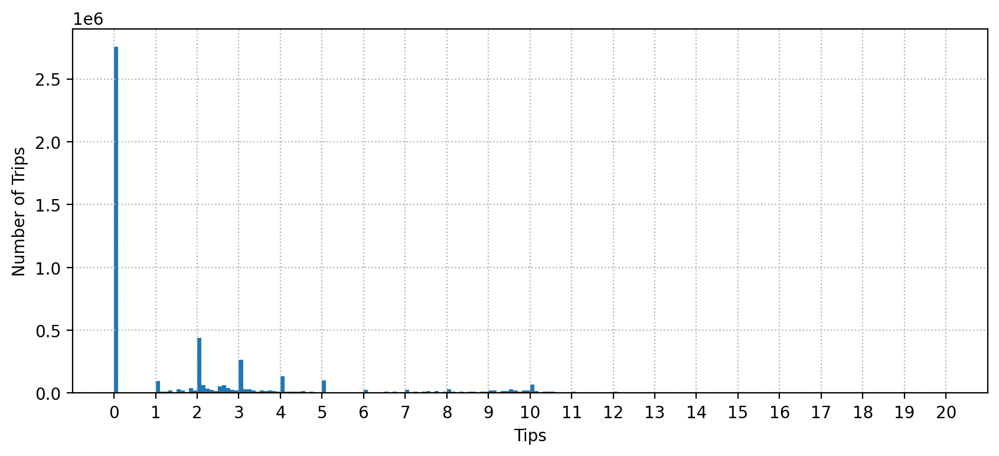

In [137]:
# Q: What is the distribution of tip <= $20?
ax = (df['Tips'][df['Tips'] <= 20]).hist(figsize=(10, 4), bins=200, grid=False)
ax.set_xticks(np.arange(0, 20 + 0.1, 1))
ax.grid(linestyle=':')
ax.set_xlabel('Tips')
ax.set_ylabel('Number of Trips');

In [138]:
# Q: What fare represents the spikes above?
df['Tips'].value_counts().head(20)

Tips
0.00     2744775
2.00      374802
3.00      245338
4.00      117323
5.00       90978
1.00       76531
10.00      48768
2.07       39639
2.16       34783
8.00       21555
6.00       19087
1.84       17736
2.58       17545
7.00       16297
1.50       15085
2.67       15040
2.63       14450
2.50       14114
1.55       11368
2.06       11109
Name: count, dtype: int64

In [139]:
# Q: Anything special about rows with large tips?
df.nlargest(10, 'Tips').drop(labels=zone_cols, axis='columns')

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Fare,Tips,Tolls,Extras,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time
565648,05ef990e1f362a4fce493c73a44a8a5fc7f1200e,0fd63dbf2686f6fba4a3fcb77e2c5715bddb2a197493e1...,2022-02-21 21:30:00,2022-02-21 22:00:00,1682.0,0.0,2140.05,321.08,0.0,0.0,2461.63,Mobile,Metro Jet Taxi A.,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),1800.0
4118825,58834bfc3c2a3873ea77518ffdadb74d689b93c8,31261f6e7fc645eff98c7964c7ea71a0ea7e387a6bd7f8...,2022-09-01 13:45:00,2022-09-01 15:00:00,4560.0,3.0,31.25,210.00,0.0,0.5,241.75,Credit Card,Taxi Affiliation Services,41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),4500.0
3504628,193d98a6830a09615dcbb1aac2de772d0fbafaea,d5606e39aadb36a16739062a2d6fe7f388118af055199e...,2022-07-30 20:00:00,2022-07-30 20:30:00,1980.0,15.5,39.50,200.80,0.0,0.0,240.30,Credit Card,Taxi Affiliation Services,41.892508,-87.626215,POINT (-87.6262149064 41.8925077809),41.982775,-87.877305,POINT (-87.8773053996 41.9827750091),1800.0
3116381,39dc7c1f08ae70cdbd7e848f5d87c0cefe53a4f2,252ada1a45e512d3d038a61eb1832c0eec8e3c8dce5833...,2022-07-11 12:30:00,2022-07-11 12:30:00,120.0,0.2,4.00,200.00,0.0,0.0,204.00,Credit Card,Taxi Affiliation Services,41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),0.0
4613752,0c421067b2b00873ea3400d606a625204d4d0eb4,31261f6e7fc645eff98c7964c7ea71a0ea7e387a6bd7f8...,2022-09-26 12:00:00,2022-09-26 14:00:00,7080.0,19.5,68.75,200.00,0.0,11.0,279.75,Credit Card,Taxi Affiliation Services,41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),41.938666,-87.711211,POINT (-87.7112105933 41.9386661962),7200.0
4191290,dbb3db9ae8a879e40730402d799452bb72fe9804,1aa27355c709dc0cba3790a2549861c6b7864165ccf020...,2022-09-05 23:15:00,2022-09-05 23:30:00,1320.0,16.3,40.25,180.00,0.0,4.0,224.25,Credit Card,Taxi Affiliation Services,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.901207,-87.676356,POINT (-87.6763559892 41.9012069941),900.0
570602,b3ad6ac92401d176d957784fd72e8d2a83e28ef8,68e19b1900a5a4e8193b45649935a261ceb26c8e01d1dc...,2022-02-22 11:00:00,2022-02-22 13:45:00,9780.0,5.3,214.50,173.00,0.0,12.0,399.50,Credit Card,Taxi Affiliation Services,41.859350,-87.617358,POINT (-87.6173580061 41.859349715),41.859350,-87.617358,POINT (-87.6173580061 41.859349715),9900.0
5541637,a29abc7b3eeacac5b38d59ee1ef8b7340eac18ca,df78a9555ae5e9041d230bb2f8e1ed8386a1a2a6e52baa...,2022-11-12 10:15:00,2022-11-12 11:00:00,2220.0,1.7,12.25,150.00,0.0,0.0,162.25,Credit Card,Top Cab Affiliation,41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),41.877406,-87.621972,POINT (-87.6219716519 41.8774061234),2700.0
3930777,135e349f7eca746ba26cc035a35ebb88de790893,df78a9555ae5e9041d230bb2f8e1ed8386a1a2a6e52baa...,2022-08-22 11:15:00,2022-08-22 13:00:00,6000.0,6.1,32.75,130.00,0.0,0.0,162.75,Credit Card,Top Cab Affiliation,41.884987,-87.620993,POINT (-87.6209929134 41.8849871918),41.877406,-87.621972,POINT (-87.6219716519 41.8774061234),6300.0
5755633,d4ea245ce698694af3556f43ab701eee2e497baa,df78a9555ae5e9041d230bb2f8e1ed8386a1a2a6e52baa...,2022-11-25 09:15:00,2022-11-25 11:00:00,6360.0,1.2,27.00,130.00,0.0,0.0,157.00,Credit Card,Top Cab Affiliation,41.878866,-87.625192,POINT (-87.6251921424 41.8788655841),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),6300.0


In [140]:
# Q: Which company has tips > $100?
idx = df['Tips'] > 100
pd.concat([(df['Company'][idx].value_counts() / idx.sum()).rename('> $100 Tips %'),
           (df['Company'].value_counts() / df['Company'].count()).rename('Market Share %')], join='inner', axis=1).round(3) * 100

,> $100 Tips %,Market Share %
Company,,
Taxi Affiliation Services,52.6,21.9
Top Cab Affiliation,26.3,1.4
Metro Jet Taxi A.,5.3,0.1
Globe Taxi,5.3,3.8
Blue Ribbon Taxi Association,5.3,2.5
5 Star Taxi,5.3,2.3


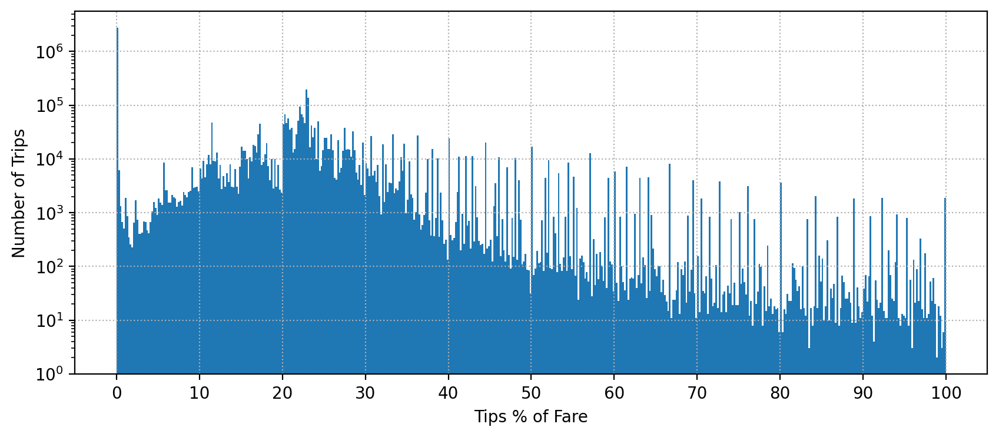

In [141]:
# Q: What is the distribution of tips % of fare?
idx = df['Fare'] >= df['Tips']
ax = (df['Tips'][idx] / df['Fare'][idx] * 100).hist(figsize=(10, 4), bins=500, grid=False)
ax.grid(linestyle=':')
ax.set_xticks(np.arange(0, 100 + 0.1, 10))
ax.set_yscale('log')
ax.set_xlabel('Tips % of Fare')
ax.set_ylabel('Number of Trips');

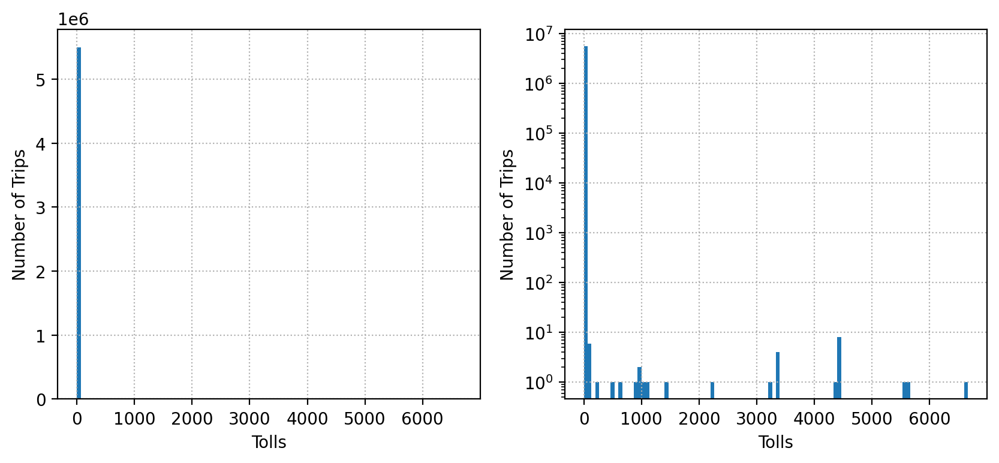

In [142]:
# Q: What is the distribution of tolls?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Tolls']).hist(ax=ax1, bins=100, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Tolls')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Tolls']).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Tolls')
ax2.set_ylabel('Number of Trips')

plt.show()

In [143]:
df['Tolls'].value_counts().head(20)

Tolls
0.00     5494485
1.00        1257
4.00         473
2.00         267
5.00         248
1.50         242
0.01         217
3.00          88
4.50          61
6.00          52
7.00          49
1.90          39
9.00          26
3.60          25
10.00         24
5.50          18
2.50          16
11.00         14
50.00         12
8.00          11
Name: count, dtype: int64

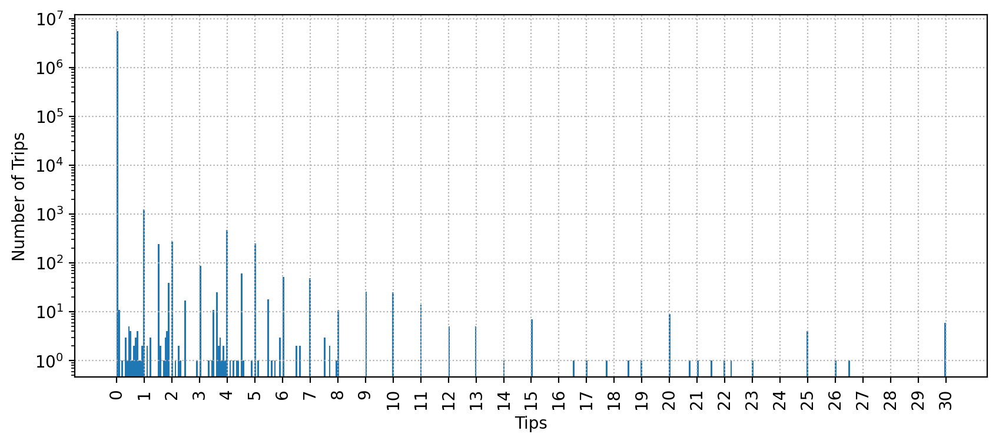

In [144]:
# Q: What is the distribution of tolls <= $30?
ax = (df['Tolls'][df['Tolls'] <= 30]).hist(figsize=(10, 4), bins=500, grid=False)
ax.set_xticks(np.arange(0, 30 + 0.1, 1))
ax.tick_params(axis='x', rotation=90)
ax.set_yscale('log')
ax.grid(linestyle=':')
ax.set_xlabel('Tips')
ax.set_ylabel('Number of Trips');

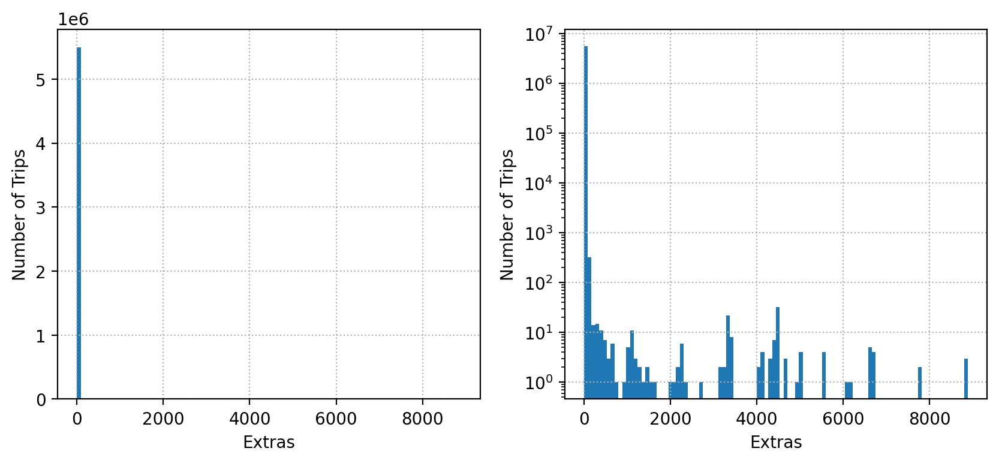

In [145]:
# Q: What is the distribution of extra?
plt.figure(figsize=(10, 4))

ax1 = plt.subplot(1, 2, 1)
(df['Extras']).hist(ax=ax1, bins=100, grid=False)
ax1.grid(linestyle=':')
ax1.set_xlabel('Extras')
ax1.set_ylabel('Number of Trips')

ax2 = plt.subplot(1, 2, 2)
(df['Extras']).hist(ax=ax2, bins=100, grid=False)
ax2.set_yscale('log')
ax2.grid(linestyle=':')
ax2.set_xlabel('Extras')
ax2.set_ylabel('Number of Trips')

plt.show()

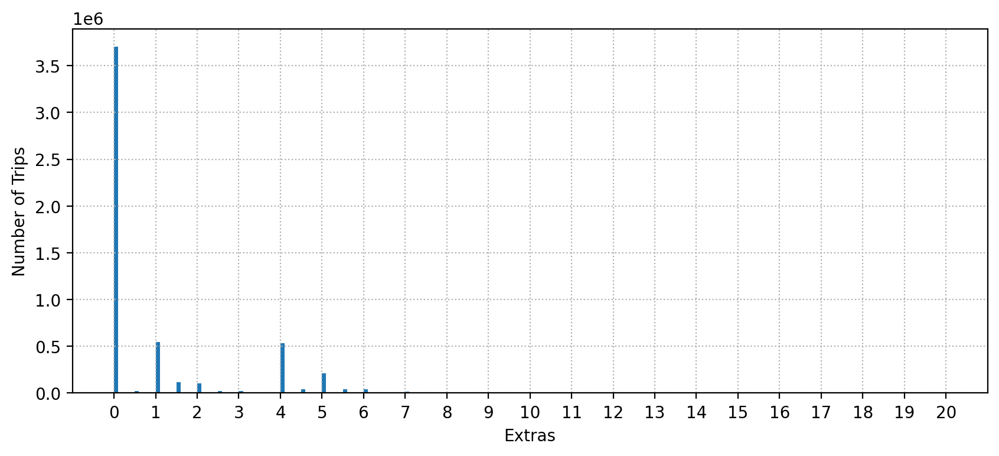

In [146]:
# Q: What is the distribution of extras <= $20?
ax = (df['Extras'][df['Extras'] <= 20]).hist(figsize=(10, 4), bins=200, grid=False)
ax.set_xticks(np.arange(0, 20 + 0.1, 1))
ax.grid(linestyle=':')
ax.set_xlabel('Extras')
ax.set_ylabel('Number of Trips');

In [147]:
# Q: What extras represent the spikes above?
df['Extras'].value_counts().head(20)
# $1 = first aditional passenger  $4 = airport departure  https://yellowcabchicago.com/rates/

Extras
0.0     3704131
1.0      543528
4.0      533022
5.0      208405
1.5      116903
2.0      101463
4.5       41398
6.0       38224
5.5       37658
0.5       23477
3.0       22771
2.5       22384
7.0       16564
6.5        9560
8.0        9037
3.5        8119
10.0       6286
7.5        4649
9.0        3795
8.5        3056
Name: count, dtype: int64

In [148]:
# Q: What are the most popular pickup locations for $4 fare?
df2 = (df
       [['Pickup Centroid Longitude', 'Pickup Centroid Latitude']]
       [df['Extras'] == 4]
       .value_counts()
       .map(np.log10)
       .rename('Log10(Number of Trips)')
       .reset_index())

df2.head(10)

,Pickup Centroid Longitude,Pickup Centroid Latitude,Log10(Number of Trips)
0,-87.903040,41.979071,5.370450
1,-87.913625,41.980264,5.267904
2,-87.769615,41.792592,4.614855
3,-87.750934,41.785999,4.607015
4,-87.620993,41.884987,3.628900
5,-87.633308,41.899602,3.515211
6,-87.632746,41.880994,3.396896
7,-87.626215,41.892508,3.359456
8,-87.625192,41.878866,3.262214
9,-87.618868,41.890922,3.250176


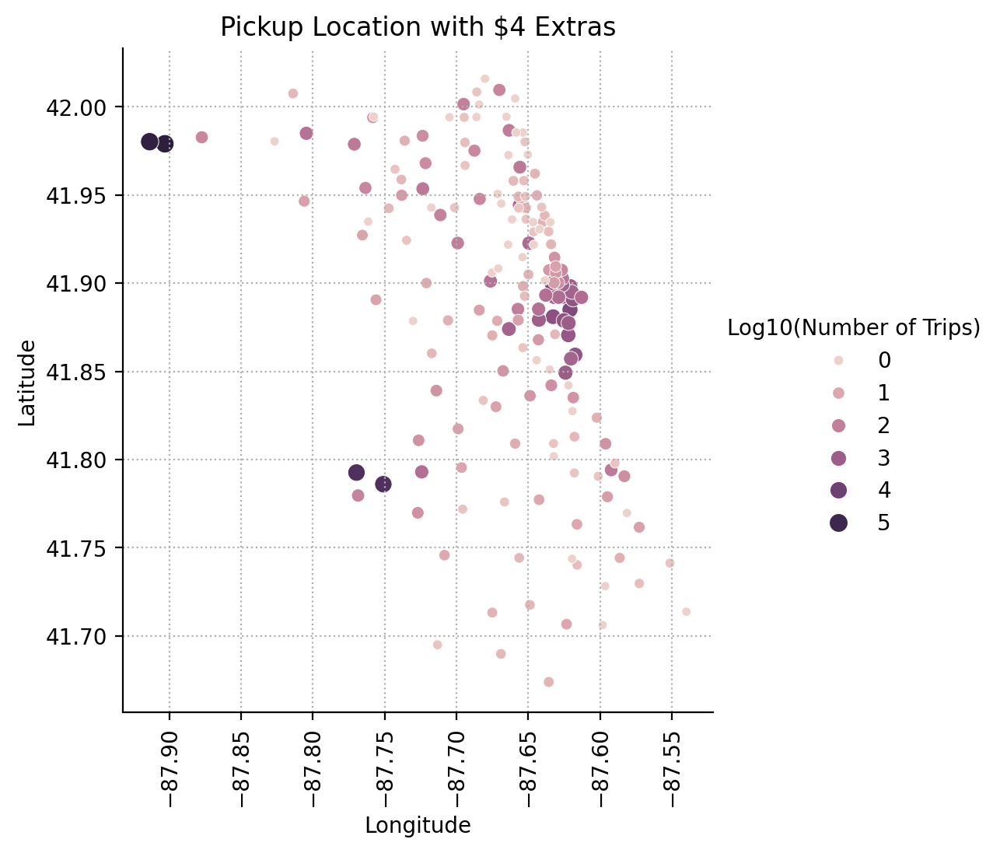

In [149]:
g = sns.relplot(data=df2,
                kind='scatter',
                x='Pickup Centroid Longitude',
                y='Pickup Centroid Latitude',
                hue='Log10(Number of Trips)',
                size='Log10(Number of Trips)')
g.ax.grid(linestyle=':')
g.tick_params(axis='x', rotation=90)
g.ax.set_xlabel('Longitude')
g.ax.set_ylabel('Latitude')
g.ax.set_title('Pickup Location with $4 Extras');

In [150]:
# Q: Do fare etc always sum up to trip total?
(df['Fare'] + df['Tips'] + df['Tolls'] + df['Extras'] == df['Trip Total']).value_counts()

True     4023931
False    1476573
Name: count, dtype: int64

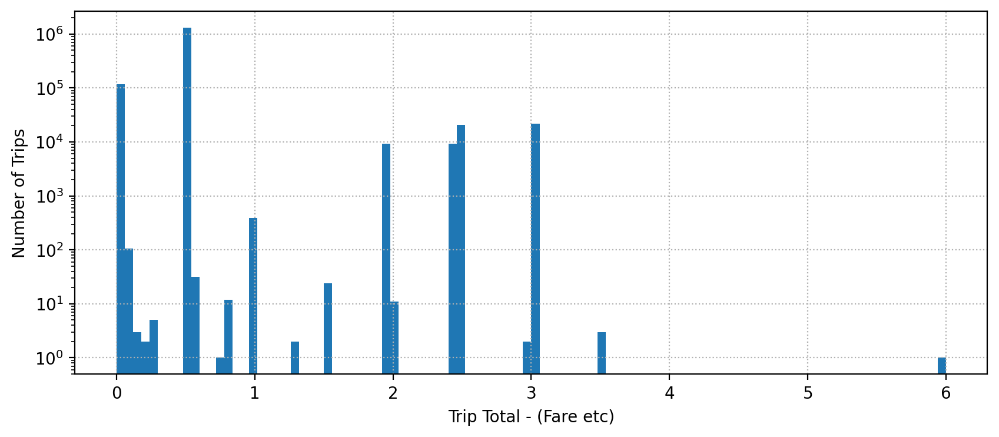

In [151]:
# Q: What is the distribution of discrepancy in trip total?
df['total_diff'] = df['Trip Total'] - (df['Fare'] + df['Tips'] + df['Tolls'] + df['Extras'])

ax = (df['total_diff'][df['total_diff'] != 0]).hist(figsize=(10, 4), bins=100, grid=False)
ax.set_yscale('log')
ax.grid(linestyle=':')
ax.set_xlabel('Trip Total - (Fare etc)')
ax.set_ylabel('Number of Trips');

In [152]:
# Q: Any missing company?
df['Company'].isna().any()

False

In [153]:
# Q: Any typo in company?
df['Company'].value_counts().sort_index()

Company
24 Seven Taxi                             51002
2733 - 74600 Benny Jona                    1050
312 Medallion Management Corp              7526
3556 - 36214 RC Andrews Cab                1944
3620 - 52292 David K. Cab Corp.              77
4053 - 40193 Adwar H. Nikola                621
5 Star Taxi                              128419
5062 - 34841 Sam Mestas                    1059
6574 - Babylon Express Inc.                1341
Blue Ribbon Taxi Association             139164
Blue Ribbon Taxi Association Inc.         32760
Chicago Carriage Cab Corp                     9
Chicago Independents                     272742
Chicago Taxicab                           16101
Choice Taxi Association                  107347
City Service                             513616
Flash Cab                               1207847
Globe Taxi                               207372
KOAM Taxi Association                      5506
Koam Taxi Association                     11962
Leonard Cab Co                  

In [154]:
df['Company'] = df['Company'].replace({'Blue Ribbon Taxi Association Inc.': 'Blue Ribbon Taxi Association',
                                       'KOAM Taxi Association': 'Koam Taxi Association',
                                       'Taxicab Insurance Agency, LLC': 'Taxicab Insurance Agency Llc',
                                       'Top Cab': 'Top Cab Affiliation'})

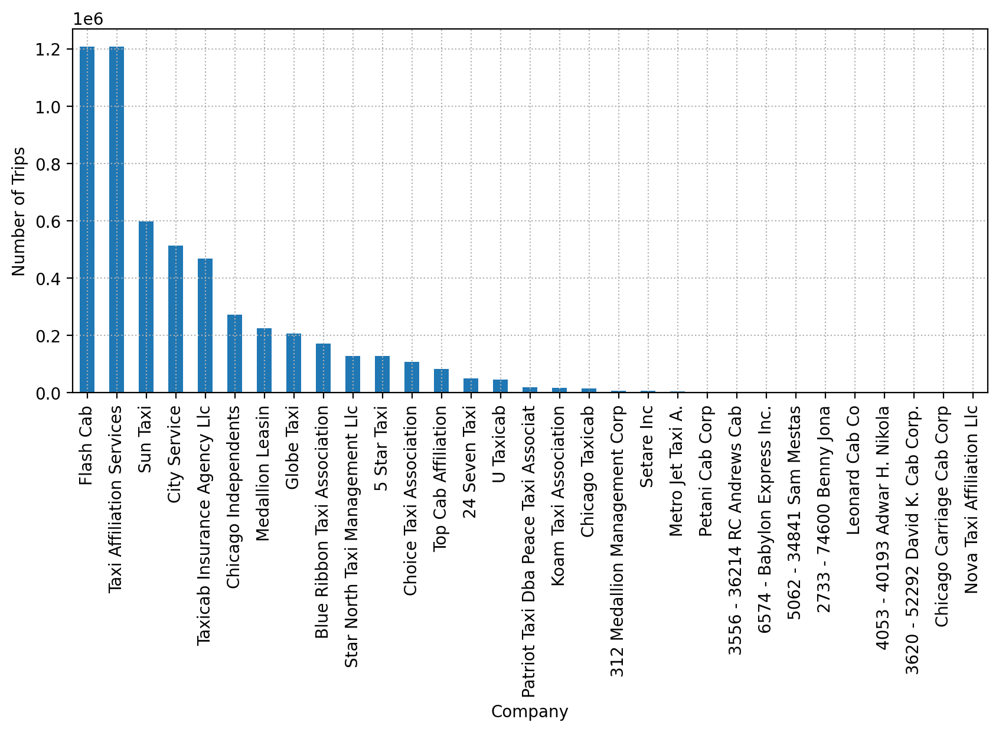

In [155]:
# Q: What is the distribution of company?
ax = df['Company'].value_counts().plot.bar(figsize=(10, 4), ylabel='Number of Trips')
ax.grid(linestyle=':')

In [156]:
# Q: Any missing payment type?
df['Payment Type'].isna().any()

False

In [157]:
# Q: What is the distribution of payment type?
df['Payment Type'].value_counts()

Payment Type
Credit Card    2011049
Cash           1766334
Mobile          884102
Prcard          544180
Unknown         290871
Dispute           2125
No Charge         1842
Prepaid              1
Name: count, dtype: int64

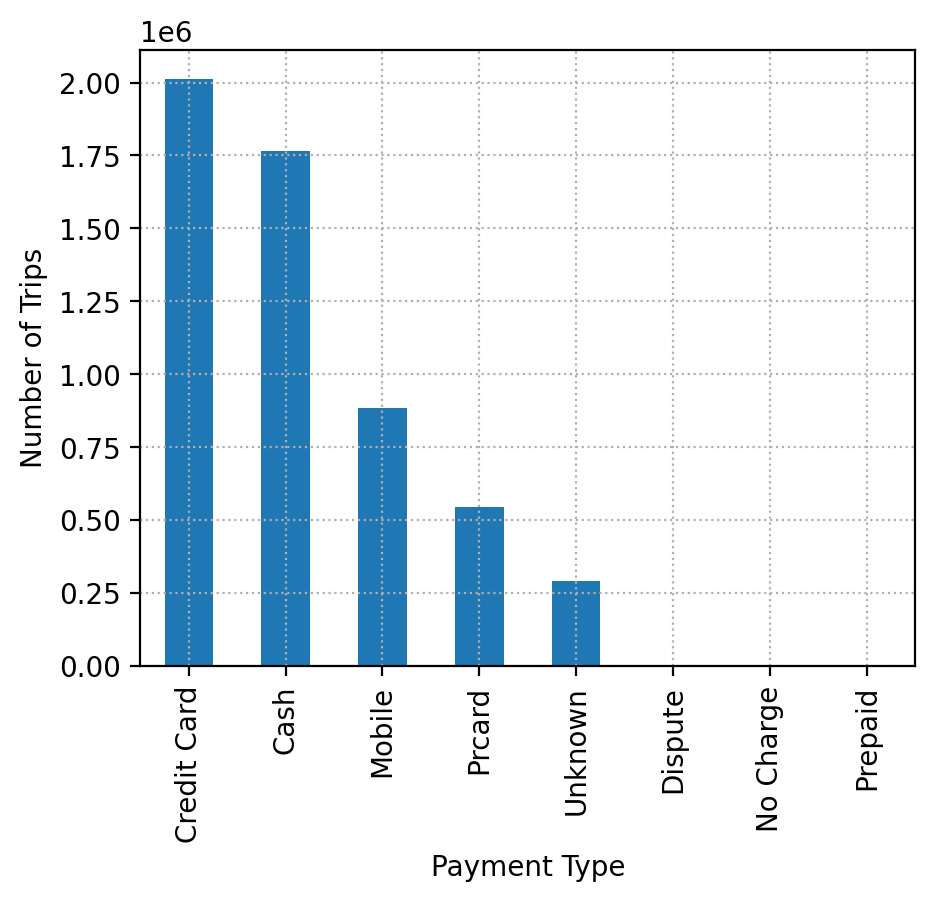

In [158]:
ax = df['Payment Type'].value_counts().plot.bar(figsize=(5, 4), ylabel='Number of Trips')
ax.grid(linestyle=':')

In [159]:
# Q: No charge means $0 trip total?
df[df['Payment Type'] == 'No Charge'].drop(labels=zone_cols, axis='columns')

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Fare,Tips,Tolls,Extras,...,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,trip_time,total_diff
250,78dd0a2b1b2491110ab96822f0b9e0865019d586,342474dd3a24c9d5b7dbc2514032a01ecb396624638be5...,2022-01-01 00:30:00,2022-01-01 00:45:00,1140.0,2.6,12.25,0.0,0.0,0.0,...,No Charge,Taxi Affiliation Services,41.880994,-87.632746,POINT (-87.6327464887 41.8809944707),41.892508,-87.626215,POINT (-87.6262149064 41.8925077809),900.0,0.0
1252,35bfc8b80e75f681c7493c723e28942c8dda6d87,2af66bee3f8116940cafc155173f0c158c5dd50a6efbda...,2022-01-01 02:15:00,2022-01-01 02:30:00,720.0,2.7,10.00,0.0,0.0,1.0,...,No Charge,Taxicab Insurance Agency Llc,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.901207,-87.676356,POINT (-87.6763559892 41.9012069941),900.0,0.0
1565,4304c4ed1ac76292a72f411960fe8bc0c5ca0b63,2af66bee3f8116940cafc155173f0c158c5dd50a6efbda...,2022-01-01 02:45:00,2022-01-01 03:45:00,3540.0,10.3,34.75,0.0,0.0,2.0,...,No Charge,Taxicab Insurance Agency Llc,41.899602,-87.633308,POINT (-87.6333080367 41.899602111),41.874005,-87.663518,POINT (-87.6635175498 41.874005383),3600.0,0.0
22453,8fa942d1d630920a0742a58632da808430841167,7abf21809bb043cd98a7da5af365dd60088d19d08076f0...,2022-01-03 13:45:00,2022-01-03 13:45:00,0.0,0.0,3.25,0.0,0.0,0.0,...,No Charge,Taxicab Insurance Agency Llc,41.794090,-87.592311,POINT (-87.592310855 41.794090253),41.794090,-87.592311,POINT (-87.592310855 41.794090253),0.0,0.0
32435,6cdee011bf134b0df4524c269d3286f3ea2a385a,4b2d5e8743e0e17dd683ef83f701a7c54ab50ffa532484...,2022-01-04 12:45:00,2022-01-04 13:15:00,1620.0,20.1,49.50,0.0,0.0,5.0,...,No Charge,Taxicab Insurance Agency Llc,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),41.859350,-87.617358,POINT (-87.6173580061 41.859349715),1800.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6378434,18ca06931e22b06b44c91f05eb3b58d3a9ddb9ca,634bc0295489ab0b50cebcc10d6d3e0b8ed7dc079e9473...,2022-12-31 20:30:00,2022-12-31 21:00:00,1680.0,15.0,39.00,0.0,0.0,4.0,...,No Charge,Choice Taxi Association,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.944227,-87.655998,POINT (-87.6559981815 41.9442266014),1800.0,0.0
6381417,eebb30ceddbd0a80f1b75a0068b8a80b8a35e9bd,634bc0295489ab0b50cebcc10d6d3e0b8ed7dc079e9473...,2022-12-31 22:45:00,2022-12-31 23:15:00,1320.0,32.3,41.25,0.0,0.0,5.0,...,No Charge,Choice Taxi Association,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),1800.0,0.0
6381468,4bed8a280d3efbdefafebb86a7ae9c86737f9607,634bc0295489ab0b50cebcc10d6d3e0b8ed7dc079e9473...,2022-12-31 22:45:00,2022-12-31 23:15:00,1320.0,32.3,41.25,0.0,0.0,5.0,...,No Charge,Choice Taxi Association,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.899602,-87.633308,POINT (-87.6333080367 41.899602111),1800.0,0.0
6381692,fe5ca27ebc75fceed18fcf771ce405b76af6aea4,257aa707087ab0b5072e2bdccb42a50f3314fed83d2907...,2022-12-31 23:00:00,2022-12-31 23:30:00,1680.0,12.8,33.50,0.0,0.0,10.0,...,No Charge,Top Cab Affiliation,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.975171,-87.687516,POINT (-87.6875155152 41.9751709433),1800.0,0.0


In [160]:
# Q: What is the joint distribution / contingency table of company vs payment type?
df2 = (df
       .value_counts(['Company', 'Payment Type'])
       .unstack()
       .fillna(0)
       .astype(int))
df2['Total'] = df2.sum(axis=1)

df2.sort_values('Total', ascending=False)

Payment Type,Cash,Credit Card,Dispute,Mobile,No Charge,Prcard,Prepaid,Unknown,Total
Company,,,,,,,,,
Flash Cab,376299,243853,0,205886,0,381808,1,0,1207847
Taxi Affiliation Services,449879,495102,2,0,69,0,0,262003,1207055
Sun Taxi,174890,232433,0,167335,0,24323,0,0,598981
City Service,132837,189633,0,135520,0,55626,0,0,513616
Taxicab Insurance Agency Llc,157323,226279,780,69911,645,5764,0,7777,468479
Chicago Independents,76106,116639,131,74261,93,4641,0,871,272742
Medallion Leasin,75695,87660,0,50410,0,11916,0,0,225681
Globe Taxi,61830,80600,0,51078,0,13864,0,0,207372
Blue Ribbon Taxi Association,59089,60216,64,34025,3,13668,0,4859,171924


# Step 3: Construct clean data

In [162]:
df = pd.read_csv('chicago_tax_trip_raw.csv',
                 parse_dates=['Trip Start Timestamp', 'Trip End Timestamp'],
                 date_format='%m/%d/%Y %I:%M:%S %p')

df.shape

(6382425, 23)

In [163]:
is_dirty = (df['Taxi ID'].isna() |
            df['Trip End Timestamp'].isna() |
            (df['Trip Start Timestamp'] > df['Trip End Timestamp']) |
            df['Trip Seconds'].isna() |
            ~df['Trip Seconds'].between(1, 2 * 3600) |
            ((df['Trip Seconds'] -
              (df['Trip End Timestamp'] - df['Trip Start Timestamp']).dt.total_seconds()).abs() > 15 * 60) |
            df['Trip Miles'].isna() |
            ~df['Trip Miles'].between(0.01, 100) |
            df['Pickup Centroid Location'].isna() |
            df['Dropoff Centroid  Location'].isna() |
            df['Fare'].isna() |
            ~df['Fare'].between(3.25, 200) |
            ~df['Tips'].between(0, 50) |
            ~df['Tolls'].between(0, 20) |
            ~df['Extras'].between(0, 20) |
            df['Payment Type'].isin({'Dispute', 'No Charge'}))
df = df[~is_dirty].reset_index(drop=True)

is_dirty.sum(), is_dirty.mean()

(1613416, 0.25279043623701025)

In [164]:
import itertools

for col in ['Trip ID', 'Taxi ID']:
    n = df[col].nunique()
    for k in itertools.count(1): # Find shortest ID prefix without loss of information
        if len(set(df[col].str[:k])) == n:
            break
    df[col] = df[col].str[:k] # Truncate unnecessary ID suffix

df['Trip Seconds'] = df['Trip Seconds'].astype(np.int64)

df.replace({'Company': {'Blue Ribbon Taxi Association Inc.': 'Blue Ribbon Taxi Association',
                        'KOAM Taxi Association': 'Koam Taxi Association',
                        'Taxicab Insurance Agency, LLC': 'Taxicab Insurance Agency Llc',
                        'Top Cab': 'Top Cab Affiliation'}}, inplace=True)

df.loc[df['Payment Type'].isin({'Mobile', 'Prcard', 'Prepaid', 'Unknown'}), 'Payment Type'] = 'Other'

In [165]:
import re

df.rename(columns=lambda col: re.sub(r'\s+', '_', col).lower(), inplace=True)
df.rename(columns={'trip_start_timestamp': 'trip_start_time',
                   'trip_end_timestamp': 'trip_end_time',
                   'pickup_centroid_latitude': 'pickup_latitude',
                   'pickup_centroid_longitude': 'pickup_longitude',
                   'dropoff_centroid_latitude': 'dropoff_latitude',
                   'dropoff_centroid_longitude': 'dropoff_longitude'}, inplace=True)

In [166]:
df = df[['trip_id',
         'taxi_id',
         'trip_start_time',
         'trip_end_time',
         'trip_seconds',
         'trip_miles',
         'pickup_longitude',
         'pickup_latitude',
         'dropoff_longitude',
         'dropoff_latitude',
         'fare',
         'tips',
         'tolls',
         'extras',
         'trip_total',
         'payment_type', 
         'company']]

In [167]:
df.shape

(4769009, 17)

In [168]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4769009 entries, 0 to 4769008
Data columns (total 17 columns):
 #   Column             Dtype         
---  ------             -----         
 0   trip_id            object        
 1   taxi_id            object        
 2   trip_start_time    datetime64[ns]
 3   trip_end_time      datetime64[ns]
 4   trip_seconds       int64         
 5   trip_miles         float64       
 6   pickup_longitude   float64       
 7   pickup_latitude    float64       
 8   dropoff_longitude  float64       
 9   dropoff_latitude   float64       
 10  fare               float64       
 11  tips               float64       
 12  tolls              float64       
 13  extras             float64       
 14  trip_total         float64       
 15  payment_type       object        
 16  company            object        
dtypes: datetime64[ns](2), float64(10), int64(1), object(4)
memory usage: 618.5+ MB


In [169]:
df

,trip_id,taxi_id,trip_start_time,trip_end_time,trip_seconds,trip_miles,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare,tips,tolls,extras,trip_total,payment_type,company
0,54d812a0b88,f98ae5,2022-01-01 00:00:00,2022-01-01 00:00:00,536,4.83,-87.663518,41.874005,-87.699155,41.922761,14.75,0.00,0.0,0.0,14.75,Cash,Globe Taxi
1,7125b9e03a0,8eca35,2022-01-01 00:00:00,2022-01-01 00:15:00,897,2.07,-87.633308,41.899602,-87.625192,41.878866,9.75,0.00,0.0,1.5,11.25,Cash,Sun Taxi
2,f1a650ee419,e2d841,2022-01-01 00:00:00,2022-01-01 00:30:00,2200,2.48,-87.633308,41.899602,-87.625192,41.878866,9.36,2.14,0.0,0.0,11.50,Other,Chicago Independents
3,0f0c856e620,b21050,2022-01-01 00:00:00,2022-01-01 00:00:00,33,0.17,-87.655879,41.965812,-87.655879,41.965812,63.27,0.00,0.0,0.0,63.27,Cash,Flash Cab
4,10de74ba327,86b07d,2022-01-01 00:00:00,2022-01-01 00:00:00,710,3.12,-87.649489,41.922686,-87.655879,41.965812,11.00,0.00,0.0,0.0,11.00,Cash,Sun Taxi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4769004,e32619aecac,ca30b4,2022-12-31 23:45:00,2023-01-01 00:45:00,3865,18.24,-87.723452,41.953582,-87.723452,41.953582,51.75,0.00,0.0,0.0,51.75,Cash,Sun Taxi
4769005,f12c74c35ec,ce8e55,2022-12-31 23:45:00,2023-01-01 00:15:00,974,1.69,-87.621972,41.877406,-87.631864,41.892042,9.50,0.00,0.0,1.5,11.00,Cash,Blue Ribbon Taxi Association
4769006,f5ba11ba1d2,0cbf5c,2022-12-31 23:45:00,2022-12-31 23:45:00,539,1.85,-87.625192,41.878866,-87.663518,41.874005,11.48,0.00,0.0,0.0,11.48,Other,Globe Taxi
4769007,f88a3f1bc24,96c3fa,2022-12-31 23:45:00,2023-01-01 00:00:00,449,1.66,-87.633308,41.899602,-87.663518,41.874005,7.75,0.00,0.0,4.0,11.75,Cash,Flash Cab


In [170]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
trip_start_time,4769009,2022-07-14 19:51:01.072185856,2022-01-01 00:00:00,2022-04-26 13:00:00,2022-07-16 18:15:00,2022-10-06 17:45:00,2022-12-31 23:45:00,NaN
trip_end_time,4769009,2022-07-14 20:10:18.777611264,2022-01-01 00:00:00,2022-04-26 13:15:00,2022-07-16 18:45:00,2022-10-06 18:30:00,2023-01-01 01:00:00,NaN
trip_seconds,4769009.0,1157.400575,1.0,490.0,869.0,1586.0,7200.0,905.302276
trip_miles,4769009.0,6.119744,0.01,1.2,2.9,10.6,100.0,6.368166
pickup_longitude,4769009.0,-87.681438,-87.913625,-87.663518,-87.633308,-87.625192,-87.531386,0.099956
pickup_latitude,4769009.0,41.897522,41.651922,41.878866,41.892508,41.944227,42.021224,0.058997
dropoff_longitude,4769009.0,-87.660883,-87.913625,-87.663518,-87.633308,-87.625192,-87.531386,0.071601
dropoff_latitude,4769009.0,41.89355,41.660136,41.878866,41.892508,41.922686,42.021224,0.056694
fare,4769009.0,20.158788,3.25,8.0,13.25,30.75,200.0,14.949645
tips,4769009.0,2.517834,0.0,0.0,1.0,3.4,50.0,3.587773


In [171]:
df.describe(include=object).T

,count,unique,top,freq
trip_id,4769009,4769009,54d812a0b88,1
taxi_id,4769009,2798,8da9e1,8238
payment_type,4769009,3,Credit Card,1830361
company,4769009,30,Flash Cab,1004699


In [173]:
#df.to_csv('chicago_taxi_trip.csv.zip', index=False) # 150 MB  777 MB without zip

In [175]:
#%time pd.read_csv('chicago_taxi_trip.csv.zip', parse_dates=['trip_start_time', 'trip_end_time']).equals(df)

# Step 4: Define business problem

#### Business Problem

> The Chicago Department of Transportation is interested in traffic patterns.  In particular, they want to understand how Chicago taxi trip duration is related to other factors of the trip.

#### Task

> Build a linear regression model using historical Chicago taxi trip data from year 2022 with `trip_seconds` as the response variable and other useful information as explanatory variables.

#### Some Considerations

- **Easy or difficulty task?**
    - Intuitively, `trip_miles` or `fare` are likely the most predictive / useful explanatory variable with a strong linear relationship.
    - Does the linear regression model predicts more accurately for some part of the data?
- **Overfitting**
    - If `trip_id` is used as an explanatory variable, then it would surely exhaust the number of degrees of freedom of the model and yield 0 residual error i.e. overfit.
- **Feature engineering**
    - Perform some feature engineering e.g. additional explanatory variables (such as month of year, day of week, hour of day, specific special dates) derived from `trip_start_time`, categorical variables for selected pick-up or drop-off locations, `tips` percentage, indicator variable for presence of `tolls`.
    - Perform variable transformation on some quantitative variables might strengthen the linear relationship (from non-linear).
- **[Multicollinearity](https://en.wikipedia.org/wiki/Multicollinearity)**
    - Some explanatory variables might be highly correlated  e.g. `trip_miles`, `fare` (and etc summation), `trip_total`, distance derived from pick-up vs drop-off locations, or even `payment_type`.  This can affect the explainability of the model.
- **Others**
    - Is (popular) `taxi_id` useful or not?  Any anomaly or interesting behavior for specific taxi cab?
    - Any negative predicted `trip_seconds` value?

# Step 5: Do feature engineering

In [179]:
%time df = pd.read_csv('chicago_taxi_trip.csv.zip', parse_dates=['trip_start_time', 'trip_end_time'])

CPU times: user 2.01 s, sys: 355 ms, total: 2.37 s
Wall time: 3.49 s


In [181]:
df.shape

(458796, 17)

In [183]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 458796 entries, 0 to 458795
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   trip_id            458796 non-null  object        
 1   taxi_id            458796 non-null  object        
 2   trip_start_time    458796 non-null  datetime64[ns]
 3   trip_end_time      458796 non-null  datetime64[ns]
 4   trip_seconds       458796 non-null  int64         
 5   trip_miles         458796 non-null  float64       
 6   pickup_longitude   458796 non-null  float64       
 7   pickup_latitude    458796 non-null  float64       
 8   dropoff_longitude  458796 non-null  float64       
 9   dropoff_latitude   458796 non-null  float64       
 10  fare               458796 non-null  float64       
 11  tips               458796 non-null  float64       
 12  tolls              458796 non-null  float64       
 13  extras             458796 non-null  float64 

In [185]:
df.head(2)

,trip_id,taxi_id,trip_start_time,trip_end_time,trip_seconds,trip_miles,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare,tips,tolls,extras,trip_total,payment_type,company
0,54d812a0b88,f98ae5,2022-01-01,2022-01-01 00:00:00,536,4.83,-87.663518,41.874005,-87.699155,41.922761,14.75,0.0,0.0,0.0,14.75,Cash,Globe Taxi
1,7125b9e03a0,8eca35,2022-01-01,2022-01-01 00:15:00,897,2.07,-87.633308,41.899602,-87.625192,41.878866,9.75,0.0,0.0,1.5,11.25,Cash,Sun Taxi


In [187]:
df.tail(2)

,trip_id,taxi_id,trip_start_time,trip_end_time,trip_seconds,trip_miles,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare,tips,tolls,extras,trip_total,payment_type,company
458794,e234467b4ef,6f3c8b,2022-02-25 18:30:00,2022-02-25 18:30:00,518,2.32,-87.620993,41.884987,-87.617358,41.859350,9.25,2.0,0.0,1.5,13.25,Credit Card,Chicago Independents
458795,dd049dc44f0,8c6ee2,2022-02-25 18:30:00,2022-02-25 18:45:00,583,1.77,-87.631717,41.914616,-87.620763,41.898332,9.11,2.1,0.0,0.0,11.21,Other,24 Seven Taxi


## Step 2b: Subsample the data

In [190]:
df = df.sample(n=100000, random_state=0).sort_index()
#mention random state to make the data reproducible
#The sample should be representative of the entire population
#Can use stratified sampling to make sure categorical variables are accurately represented.

In [192]:
df.shape

(100000, 17)

In [194]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 29 to 458791
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   trip_id            100000 non-null  object        
 1   taxi_id            100000 non-null  object        
 2   trip_start_time    100000 non-null  datetime64[ns]
 3   trip_end_time      100000 non-null  datetime64[ns]
 4   trip_seconds       100000 non-null  int64         
 5   trip_miles         100000 non-null  float64       
 6   pickup_longitude   100000 non-null  float64       
 7   pickup_latitude    100000 non-null  float64       
 8   dropoff_longitude  100000 non-null  float64       
 9   dropoff_latitude   100000 non-null  float64       
 10  fare               100000 non-null  float64       
 11  tips               100000 non-null  float64       
 12  tolls              100000 non-null  float64       
 13  extras             100000 non-null  float64     

## Step 2c: Do feature engineering

In [197]:
df['month'] = df['trip_start_time'].dt.month
df['day_of_week'] = df['trip_start_time'].dt.dayofweek
df['hour'] = df['trip_start_time'].dt.hour

bounding_box = {'Downtown': (-87.651393, -87.596007, 41.866745, 41.905919),
                'Midway': (-87.769615 - 1e-6, -87.750934 + 1e-6, 41.785999 - 1e-6, 41.792592 + 1e-6),
                'O\'Hare': (-87.913625 - 1e-6, -87.903040 + 1e-6, 41.979071 - 1e-6, 41.980264 + 1e-6)}
for prefix in ['pickup', 'dropoff']:
    df[f'{prefix}_area'] = pd.Series(data='Other', index=df.index)
    for area, box in bounding_box.items():
        df.loc[df[f'{prefix}_longitude'].between(*box[:2]) & df[f'{prefix}_latitude'].between(*box[2:]), f'{prefix}_area'] = area

df['tips_percent'] = (df['tips'] / df['fare']).round(3)

## Step 2d: Write the data to CSV file

In [204]:
df = df[['trip_id',
         'taxi_id',
         'month',
         'day_of_week',
         'hour',
         'pickup_area',
         'dropoff_area',
         'trip_miles',
         'trip_seconds',
         'fare',
         'tips',
         'tips_percent',
         'tolls',
         'extras',
         'trip_total',
         'payment_type', 
         'company']]

In [206]:
df.head()

,trip_id,taxi_id,month,day_of_week,hour,pickup_area,dropoff_area,trip_miles,trip_seconds,fare,tips,tips_percent,tolls,extras,trip_total,payment_type,company
29,4c2d92f9efe,935022,1,5,0,Downtown,Downtown,0.50,180,4.50,0.0,0.000,0.0,0.0,4.50,Cash,Taxicab Insurance Agency Llc
36,69c28c69e71,4d93eb,1,5,0,Downtown,Downtown,1.37,1476,12.25,5.0,0.408,0.0,1.0,18.75,Credit Card,Flash Cab
37,7e157327f4d,94392e,1,5,0,Downtown,Downtown,0.67,427,6.00,0.0,0.000,0.0,0.0,6.00,Cash,Medallion Leasin
44,c2a39bf1cca,137d4f,1,5,0,Other,Downtown,7.16,2956,30.75,0.0,0.000,0.0,0.0,30.75,Other,Flash Cab
47,dd69bd523a3,e29752,1,5,0,Other,Downtown,2.93,731,10.50,0.0,0.000,0.0,1.0,11.50,Cash,Flash Cab


In [208]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
month,100000.0,1.507410,0.499948,1.00,1.00,2.00,2.0000,2.00
day_of_week,100000.0,2.833000,1.896303,0.00,1.00,3.00,4.0000,6.00
hour,100000.0,13.685950,5.194250,0.00,10.00,14.00,18.0000,23.00
trip_miles,100000.0,5.490473,5.748742,0.01,1.08,2.70,9.4725,84.26
trip_seconds,100000.0,1025.229330,766.818848,1.00,452.00,817.00,1440.0000,7197.00
fare,100000.0,18.724177,13.547593,3.25,7.75,13.23,29.2500,174.50
tips,100000.0,1.727775,3.067457,0.00,0.00,0.00,2.1800,50.00
tips_percent,100000.0,0.106252,0.179379,0.00,0.00,0.00,0.2220,8.75
tolls,100000.0,0.000409,0.024919,0.00,0.00,0.00,0.0000,4.00
extras,100000.0,0.747076,1.628864,0.00,0.00,0.00,0.0000,20.00


In [210]:
df.describe(include=object).transpose()

,count,unique,top,freq
trip_id,100000,100000,4c2d92f9efe,1
taxi_id,100000,1813,69b52d,283
pickup_area,100000,4,Other,43421
dropoff_area,100000,4,Other,57065
payment_type,100000,3,Other,38135
company,100000,25,Flash Cab,29761


In [212]:
# df.to_csv('chicago_taxi_trip_sample.csv', index=False) # 10.0 MB

# Step 3: Exploratory data analysis and visualization

In [215]:
# Correlation matrix of numerical variables
numerical_cols = ['trip_seconds', 'trip_miles', 'fare', 'tips', 'tolls', 'extras', 'trip_total', 'tips_percent']
C = df[numerical_cols].corr()

C

,trip_seconds,trip_miles,fare,tips,tolls,extras,trip_total,tips_percent
trip_seconds,1.000000,0.647144,0.794577,0.239864,0.002063,0.318313,0.751151,-0.140014
trip_miles,0.647144,1.000000,0.876609,0.384873,0.006297,0.477609,0.866201,-0.072984
fare,0.794577,0.876609,1.000000,0.390887,0.002922,0.491377,0.972426,-0.107689
tips,0.239864,0.384873,0.390887,1.000000,0.002427,0.520471,0.580931,0.630129
tolls,0.002063,0.006297,0.002922,0.002427,1.000000,0.001243,0.004534,0.006144
extras,0.318313,0.477609,0.491377,0.520471,0.001243,1.000000,0.620510,0.133721
trip_total,0.751151,0.866201,0.972426,0.580931,0.004534,0.620510,1.000000,0.048700
tips_percent,-0.140014,-0.072984,-0.107689,0.630129,0.006144,0.133721,0.048700,1.000000


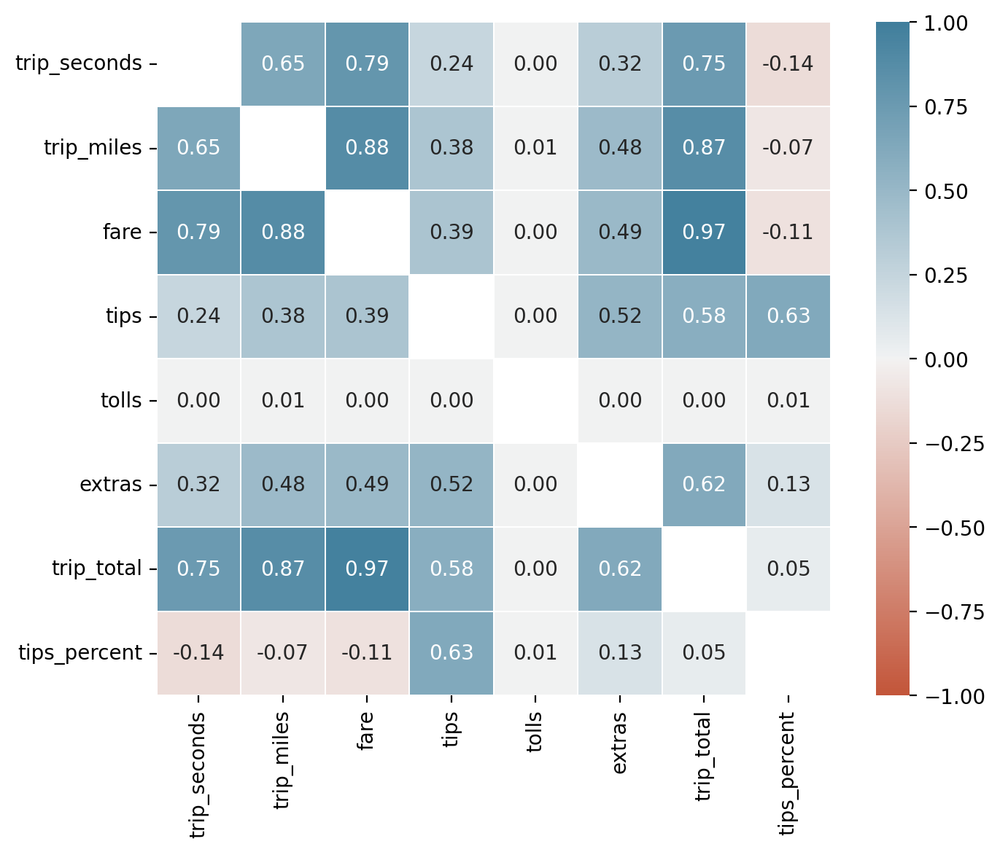

In [219]:
# Visualize correlation matrix as heat map
fig = plt.figure(figsize=(8, 6))
sns.heatmap(C, vmin=-1, vmax=1, cmap=sns.diverging_palette(20, 230, as_cmap=True), annot=True, fmt='.2f',
            linewidths=0.1, square=True, mask=np.identity(len(numerical_cols), dtype=bool), ax=fig.gca());

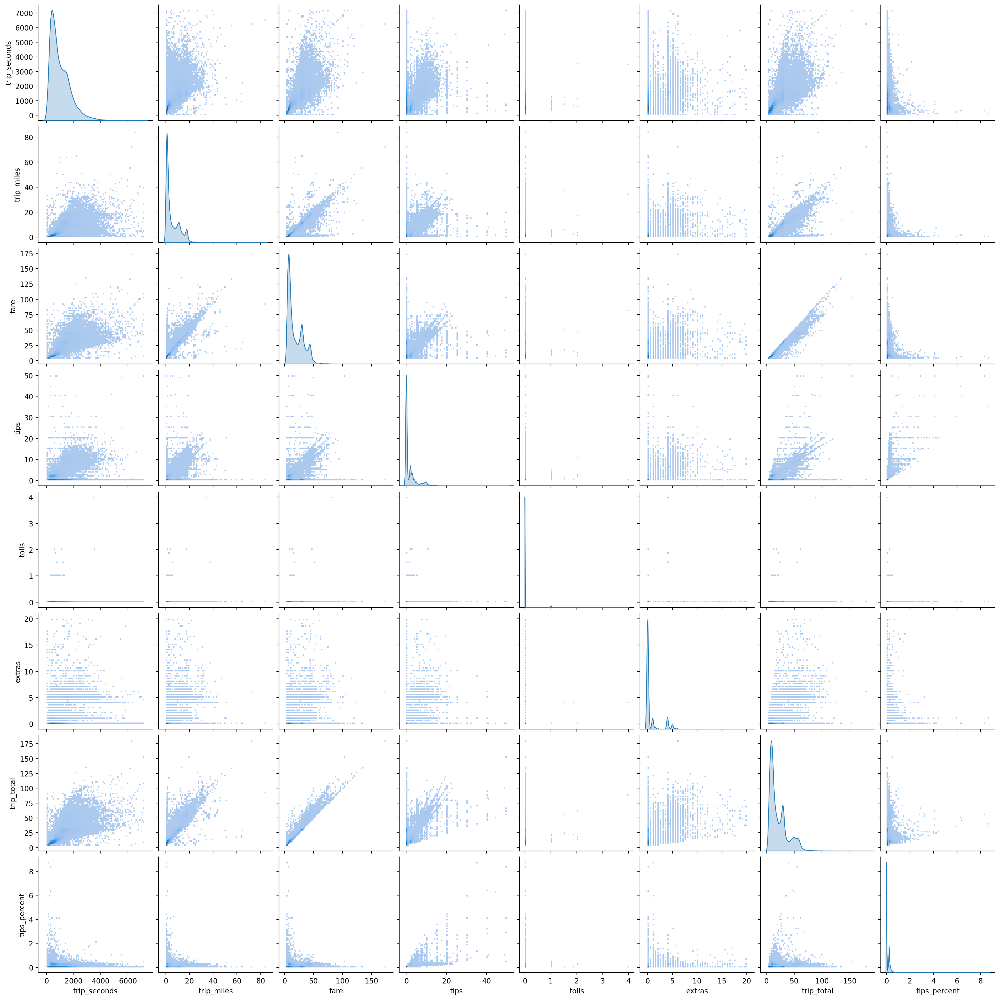

In [221]:
# Pair plot of numerical variables
sns.pairplot(df, vars=numerical_cols, kind='hist', diag_kind='kde', plot_kws={'bins': 80});

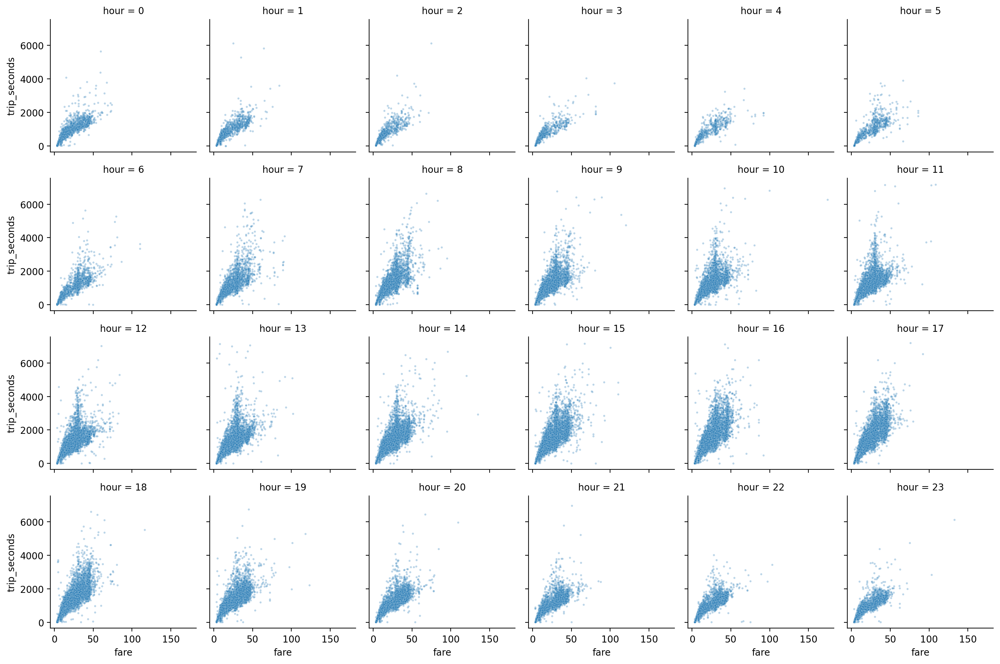

In [222]:
sns.relplot(df, x='fare', y='trip_seconds', col='hour', col_wrap=6, height=2.5, alpha=0.3, s=5);
#Fare vs trip seconds at every hour if we consider hour as a categorical variable. Slicing the data by the col parameter
#Could be possible that a different model fits at some hours of the day, so important to observe

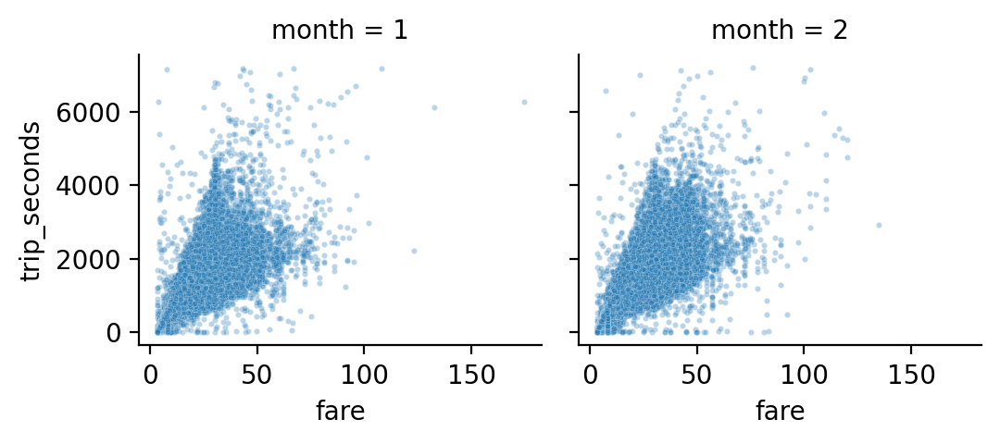

In [223]:
sns.relplot(df, x='fare', y='trip_seconds', col='month', col_wrap=6, height=2.5, alpha=0.3, s=5);

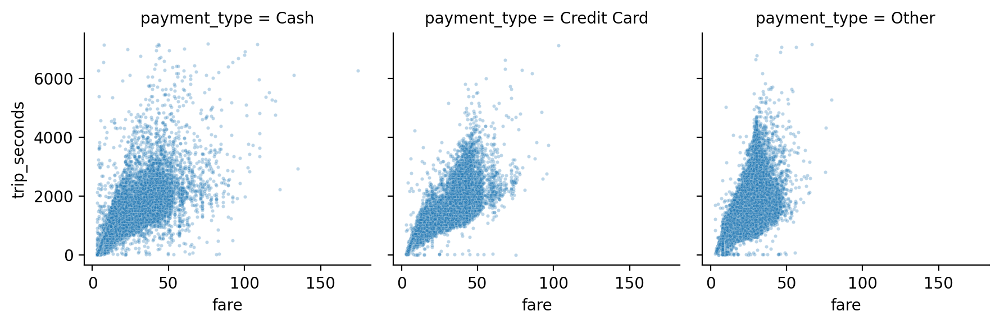

In [224]:
sns.relplot(df, x='fare', y='trip_seconds', col='payment_type', height=3, alpha=0.3, s=5);

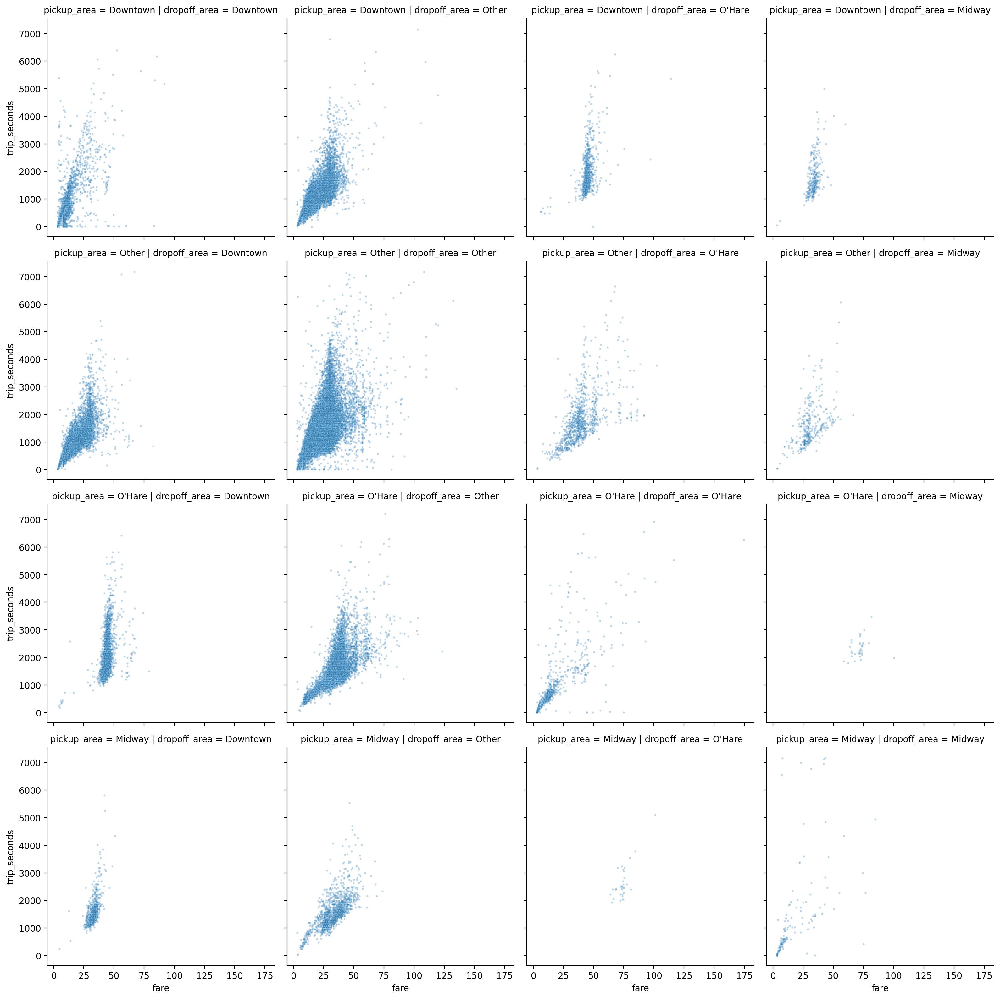

In [225]:
sns.relplot(df, x='fare', y='trip_seconds', row='pickup_area', col='dropoff_area', height=4, alpha=0.3, s=5);

In [227]:
# https://pandas.pydata.org/docs/user_guide/groupby.html
g = df.groupby(['pickup_area', 'dropoff_area'])[['trip_miles', 'trip_seconds', 'fare']]
df2 = pd.concat([g.size().rename('count'), g.mean()], axis=1) # https://pandas.pydata.org/docs/user_guide/advanced.html#advanced-hierarchical
df2['mph'] = df2['trip_miles'] / df2['trip_seconds'] * 3600
df2['$/mile'] = df2['fare'] /  df2['trip_miles']

df2.round(2)

count  trip_miles  trip_seconds   fare    mph  \
pickup_area dropoff_area                                                  
Downtown    Downtown      24963        1.22        450.74   7.26   9.73   
            Midway          324       11.43       1761.10  33.85  23.36   
            O'Hare         1246       16.33       1807.17  44.73  32.52   
            Other         16389        4.60        943.00  16.20  17.55   
Midway      Downtown        846       10.48       1579.83  32.75  23.88   
            Midway          140        4.31       1333.87  17.70  11.64   
            O'Hare           33       25.66       2635.15  74.19  35.05   
            Other          1407       10.70       1559.13  32.75  24.71   
O'Hare      Downtown       4144       15.91       1905.62  43.95  30.05   
            Midway           34       24.90       2339.94  71.60  38.30   
            O'Hare          672        5.98       1059.70  19.56  20.32   
            Other          6381       12.88       1722.70  36.59  26.93   
Other       Downtown       9171        4.60        979.20  16.60  16.90   
            Midway          357        9.46       1575.52  30.71  21.61   
            O'Hare         1005       13.34       1793.95  39.64  26.78   
            Other         32888        5.53       1160.40  19.65  17.16   

                          $/mile  
pickup_area dropoff_area          
Downtown    Downtown        5.96  
            Midway          2.96  
            O'Hare          2.74  
            Other           3.52  
Midway      Downtown        3.13  
            Midway          4.10  
            O'Hare          2.89  
            Other           3.06  
O'Hare      Downtown        2.76  
            Midway          2.88  
            O'Hare          3.27  
            Other           2.84  
Other       Downtown        3.61  
            Midway          3.25  
            O'Hare          2.97  
            Other           3.55

# Step 5a: Simple linear regression
>**Model:** $(\text{trip seconds}) = 152.37 + 49.85\,(\text{fare})$

In [234]:
import statsmodels.formula.api as smf

model = smf.ols(formula='trip_seconds ~ fare', data=df).fit()
print(model.summary()) # https://www.statsmodels.org/stable/example_formulas.html

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                 1.713e+05
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        00:48:55   Log-Likelihood:            -7.5622e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99998   BIC:                         1.512e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    183.1184      2.512     72.907      0.0

In [236]:
model.params # See dir(model)

Intercept    183.118381
fare          44.974524
dtype: float64

In [238]:
model.rsquared, model.mse_resid # See dir(model)

(0.6313524469811482, 216771.0378782816)

In [240]:
# import patsy # https://patsy.readthedocs.io/en/latest/formulas.html#the-formula-language
import statsmodels.api as sm

x = sm.add_constant(df['fare'])
y = df['trip_seconds']
# y, x = patsy.dmatrices('trip_seconds ~ fare', data=df, return_type='dataframe')

print(sm.OLS(y, x).fit().summary()) # https://www.statsmodels.org/stable/regression.html

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                 1.713e+05
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        00:49:58   Log-Likelihood:            -7.5622e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99998   BIC:                         1.512e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        183.1184      2.512     72.907      0.0

In [241]:
import sklearn.linear_model # https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

x = df[['fare']] # (n,1)-shape
y = df['trip_seconds'] # (n,)-shape
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y)

In [242]:
model.intercept_, model.coef_

(183.1183806046123, array([44.97452432]))

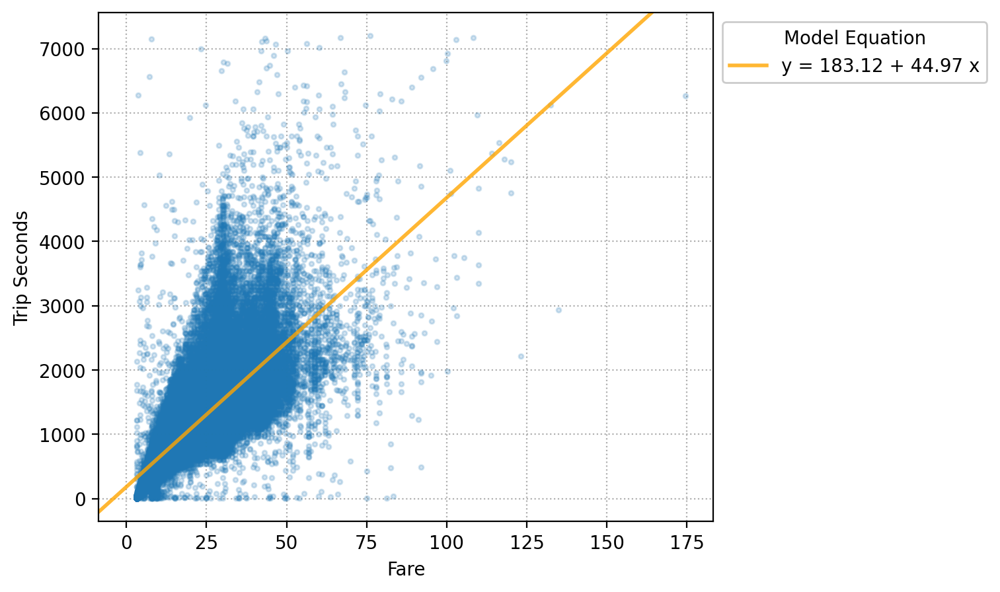

In [243]:
plt.figure(figsize=(6, 5))

plt.plot(df['fare'], df['trip_seconds'], '.', markersize=5, alpha=0.2)
plt.axline((0, model.intercept_), slope=model.coef_[0], linewidth=2, color='orange', alpha=0.8,
           label=f'y = {model.intercept_:.2f} + {model.coef_[0]:.2f} x')
plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Trip Seconds')
plt.legend(framealpha=1, bbox_to_anchor=(1, 1), title='Model Equation')

plt.show()

In [248]:
# Compute mean squared error MSE
import sklearn.metrics

y_pred = model.predict(x) # Fitted / predicted value
mse = np.mean((y - y_pred) ** 2)

(mse, 
 sklearn.metrics.mean_squared_error(y, y_pred)) # https://scikit-learn.org/stable/modules/model_evaluation.html#mean-squared-error

(216766.70245752396, 216766.70245752396)

In [250]:
# Compute root mean squared error RMSE
(np.sqrt(mse),
 sklearn.metrics.root_mean_squared_error(y, y_pred))

(465.5821114019781, 465.5821114019781)

In [252]:
# Compute coefficient of determination R^2
ss_reg = np.sum((y_pred - np.mean(y)) ** 2)
ss_error = np.sum((y - y_pred) ** 2)
ss_total = np.sum((y - np.mean(y)) ** 2) # SST = SSR + SSE

ss_reg, ss_error, ss_total

(37123856350.0227, 21676670245.752396, 58800526595.7751)

In [254]:
(np.corrcoef(y, y_pred)[0,1] ** 2, # Corr(y, y_pred)
 ss_reg / ss_total, # SSR / SST
 1 - ss_error / ss_total, # 1 - SSE / SST
 model.score(x, y),
 sklearn.metrics.r2_score(y, y_pred))

(0.6313524469811486,
 0.6313524469811482,
 0.6313524469811485,
 0.6313524469811485,
 0.6313524469811485)

# Step 5b: Multiple linear regression
>**Model:** $(\text{trip seconds}) = 170.00 + 49.76\,(\text{fare}) - 118.31\,(\text{tips percent})$

In [257]:
print(smf.ols(formula='trip_seconds ~ fare + tips_percent', data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                 8.674e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        00:51:33   Log-Likelihood:            -7.5581e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99997   BIC:                         1.512e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept      214.4259      2.730     78.548   

In [259]:
x = sm.add_constant(df[['fare', 'tips_percent']]) # Design matrix with a column of 1's for the intercept term
y = df['trip_seconds']

x.head(2)

,const,fare,tips_percent
29,1.0,4.50,0.000
36,1.0,12.25,0.408


In [261]:
print(sm.OLS(y, x).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                 8.674e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        00:51:58   Log-Likelihood:            -7.5581e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99997   BIC:                         1.512e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          214.4259      2.730     78.548   

In [263]:
x = df[['fare', 'tips_percent']]
y = df['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y)

model.intercept_, model.coef_, model.score(x, y) # R^2

(214.4258870309401, array([  44.63875543, -235.48374301]), 0.6343517137776842)

# Step 6a: [Multicollinearity](https://en.wikipedia.org/wiki/Multicollinearity) of explanatory variables
>**Model:** $(\text{trip seconds}) = 152.37 + 49.85\,(\text{fare})$

In [268]:
print(smf.ols(formula='trip_seconds ~ fare', data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                 1.713e+05
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        01:02:51   Log-Likelihood:            -7.5622e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99998   BIC:                         1.512e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    183.1184      2.512     72.907      0.0

In [270]:
df2 = df[['trip_seconds', 'fare']].copy()
df2['fare_2'] = df2['fare'] * 2

df2.head(2)

,trip_seconds,fare,fare_2
29,180,4.50,9.0
36,1476,12.25,24.5


In [272]:
np.corrcoef(df2['fare'], df2['fare_2'])[0,1] # Corr(fare, 2 * fare) = 1

1.0

>**Model:** $(\text{trip seconds}) = 152.37 + 
\beta_1\,(\text{fare}) + \beta_2\,(\text{fare} \times2)$

In [275]:
print(smf.ols(formula='trip_seconds ~ fare + fare_2', data=df2).fit().summary()) # Parameter estimation is very sensitive and non-unique

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                 1.713e+05
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        01:04:00   Log-Likelihood:            -7.5622e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99998   BIC:                         1.512e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    183.1184      2.512     72.907      0.0

In [277]:
# Fare and trip miles are highly correlated
np.corrcoef(df['fare'], df['trip_miles'])[0,1]

0.8766086472236502

In [279]:
print(smf.ols(formula='trip_seconds ~ trip_miles', data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.419
Model:                            OLS   Adj. R-squared:                  0.419
Method:                 Least Squares   F-statistic:                 7.206e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        01:04:16   Log-Likelihood:            -7.7899e+05
No. Observations:              100000   AIC:                         1.558e+06
Df Residuals:                   99998   BIC:                         1.558e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    551.2810      2.556    215.650      0.0

In [281]:
print(smf.ols(formula='trip_seconds ~ fare + trip_miles', data=df).fit().summary()) # Poor model explainability

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                 8.962e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        01:04:32   Log-Likelihood:            -7.5477e+05
No. Observations:              100000   AIC:                         1.510e+06
Df Residuals:                   99997   BIC:                         1.510e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    141.1684      2.594     54.430      0.0

# Step 6b: [Variance inflation factor](https://en.wikipedia.org/wiki/Variance_inflation_factor) VIF

In [286]:
numerical_x_cols = list(set(numerical_cols) - {'trip_seconds'}) # Omit y

r2 = {}
for col in numerical_x_cols:
    x = df[numerical_x_cols].drop(col, axis='columns')
    y = df[col]
    model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y)
    r2[col] = model.score(x, y) # R^2

pd.DataFrame.from_dict(r2, orient='index').rename(columns={0: 'r2'}).eval('vif = 1 / (1 - r2)')

,r2,vif
trip_miles,0.775839,4.461086
trip_total,0.999886,8756.080735
tolls,0.017669,1.017986
tips_percent,0.577520,2.366977
extras,0.989424,94.552074
fare,0.999840,6240.326038
tips,0.996992,332.435543


In [288]:
import statsmodels.stats.outliers_influence

df2 = sm.add_constant(df[numerical_x_cols])

vif = {}
for i, col in enumerate(numerical_x_cols, 1):
    vif[col] = statsmodels.stats.outliers_influence.variance_inflation_factor(df2, i)

pd.DataFrame.from_dict(vif, orient='index').rename(columns={0: 'vif'})

,vif
trip_miles,4.461086
trip_total,8756.080735
tolls,1.017986
tips_percent,2.366977
extras,94.552074
fare,6240.326038
tips,332.435543


# Step 7: [Polynomial regression](https://en.wikipedia.org/wiki/Polynomial_regression)
>**Model:** $(\text{trip seconds}) = -4.15 + 67.74\,(\text{fare}) - 0.32\,(\text{fare})^2$

In [291]:
model = smf.ols(formula='trip_seconds ~ fare + I(fare ** 2)', data=df).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.649
Model:                            OLS   Adj. R-squared:                  0.649
Method:                 Least Squares   F-statistic:                 9.255e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:16:59   Log-Likelihood:            -7.5374e+05
No. Observations:              100000   AIC:                         1.507e+06
Df Residuals:                   99997   BIC:                         1.508e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       10.5620      3.441      3.069   

In [293]:
# Create polynomial explanatory variables
import sklearn.preprocessing

def poly(x, p):
    x = np.asarray(x).reshape(-1, 1) # (n,1)-shape
    return sklearn.preprocessing.PolynomialFeatures(degree=p, include_bias=False).fit_transform(x) # (n,p)-shape

poly(np.arange(5), 3)

array([[ 0.,  0.,  0.],
       [ 1.,  1.,  1.],
       [ 2.,  4.,  8.],
       [ 3.,  9., 27.],
       [ 4., 16., 64.]])

In [295]:
x = poly(df['fare'], 2) # (n,2)-shape
y = df['trip_seconds'] # (n,)-shape
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y)

model.intercept_, model.coef_, model.score(x, y) # R^2

(10.562022515049534, array([65.52743929, -0.39743127]), 0.6492411238205156)

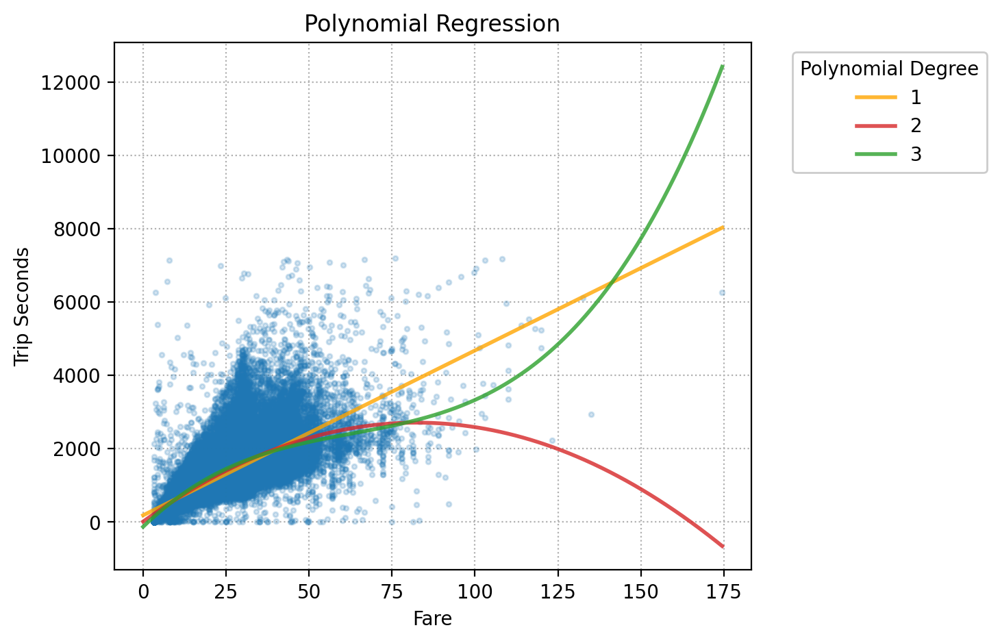

In [297]:
plt.figure(figsize=(6, 5))

plt.plot(df['fare'], df['trip_seconds'], '.', markersize=5, alpha=0.2)

xticks = np.linspace(0, df['fare'].max(), num=1000)
for p, color in zip([1, 2, 3], ['orange', 'C3', 'C2']):
    model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(poly(df['fare'], p), df['trip_seconds'])
    plt.plot(xticks, model.predict(poly(xticks, p)), linewidth=2, color=color, alpha=0.8, label=p)

plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Trip Seconds')
plt.title('Polynomial Regression')
plt.legend(framealpha=1, bbox_to_anchor=(1.05, 1), title='Polynomial Degree')

plt.show()

# Step 8a: Binary / indicator categorical explanatory variable

In [300]:
df['night'] = ~df['hour'].between(7, 20) # Binary indicator variable

In [302]:
# Q: Distribution of "night" variable?
df['night'].value_counts() / df['night'].count()

night
False    0.8378
True     0.1622
Name: count, dtype: float64

In [304]:
print(smf.ols(formula='trip_seconds ~ fare + night', data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                 8.972e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:18:12   Log-Likelihood:            -7.5474e+05
No. Observations:              100000   AIC:                         1.509e+06
Df Residuals:                   99997   BIC:                         1.510e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       211.7979      2.529     83.741

In [306]:
x = sm.add_constant(df[['fare', 'night']].astype(float)) # Convert night from True/False to 1/0 explicitly
y = df['trip_seconds']

print(sm.OLS(y, x).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.642
Model:                            OLS   Adj. R-squared:                  0.642
Method:                 Least Squares   F-statistic:                 8.972e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:18:21   Log-Likelihood:            -7.5474e+05
No. Observations:              100000   AIC:                         1.509e+06
Df Residuals:                   99997   BIC:                         1.510e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        211.7979      2.529     83.741      0.0

In [308]:
x = df[['fare', 'night']]
y = df['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y) # Convert night from True/False to 1/0 implicitly

model.intercept_, model.coef_, model.score(x, y) # R^2

(211.7979034857757, array([  45.31758633, -216.41847483]), 0.642139982594248)

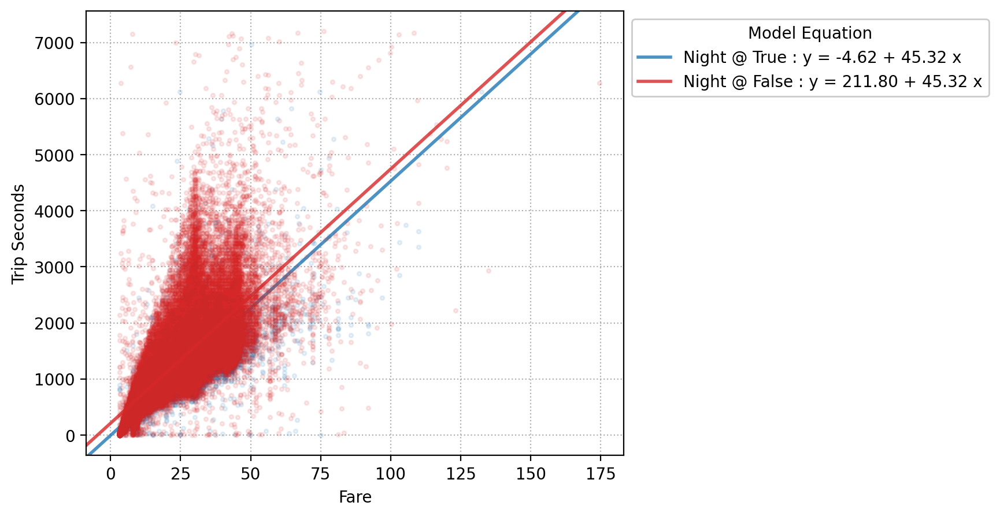

In [310]:
plt.figure(figsize=(6, 5))

is_night = df['night']

b0 = model.intercept_ + model.coef_[1]
b1 = model.coef_[0]
plt.plot(df['fare'][is_night], df['trip_seconds'][is_night], '.', markersize=5, alpha=0.1, color='C0')
plt.axline((0, b0), slope=b1, linewidth=2, color='C0', alpha=0.8, label=f'Night @ True : y = {b0:.2f} + {b1:.2f} x')

b0 = model.intercept_
b1 = model.coef_[0]
plt.plot(df['fare'][~is_night], df['trip_seconds'][~is_night], '.', markersize=5, alpha=0.1, color='C3')
plt.axline((0, b0), slope=b1, linewidth=2, color='C3', alpha=0.8, label=f'Night @ False : y = {b0:.2f} + {b1:.2f} x')

plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Trip Seconds')
plt.legend(framealpha=1, bbox_to_anchor=(1, 1), title='Model Equation')

plt.show()

# Step 8b: One-hot encoding / dummy explanatory variable

In [313]:
hour_type = {'Rush Hour': {7, 8, 9, 15, 16, 17, 18},
             'Night': {0, 1, 2, 3, 4, 5, 6, 21, 22, 23},
             'Other': {10, 11, 12, 13, 14, 19, 20}}
df['hour_type'] = pd.Series(data='', index=df.index)
for type, hours in hour_type.items():
    df.loc[df['hour'].isin(hours), 'hour_type'] = type

df.head(2)

,trip_id,taxi_id,month,day_of_week,hour,pickup_area,dropoff_area,trip_miles,trip_seconds,fare,tips,tips_percent,tolls,extras,trip_total,payment_type,company,night,hour_type
29,4c2d92f9efe,935022,1,5,0,Downtown,Downtown,0.50,180,4.50,0.0,0.000,0.0,0.0,4.50,Cash,Taxicab Insurance Agency Llc,True,Night
36,69c28c69e71,4d93eb,1,5,0,Downtown,Downtown,1.37,1476,12.25,5.0,0.408,0.0,1.0,18.75,Credit Card,Flash Cab,True,Night


In [315]:
# Q: Distribution of "hour_type" variable?
df['hour_type'].value_counts() / df['hour_type'].count()

hour_type
Rush Hour    0.42169
Other        0.41611
Night        0.16220
Name: count, dtype: float64

In [317]:
# Before one-hot encoding
df[['trip_seconds', 'fare', 'hour_type']].head(2)

,trip_seconds,fare,hour_type
29,180,4.50,Night
36,1476,12.25,Night


>**Model:** $(\text{trip seconds}) = b_0 + b_1(\text{fare}) + b_2\times\mathbf{1}_{\{\text{hour type = Night}\}} + b_3\times\mathbf{1}_{\{\text{hour type = Other}\}} + b_4\times\mathbf{1}_{\{\text{hour type = Rush Hour}\}}$

In [320]:
# After one-hot encoding
pd.get_dummies(df[['trip_seconds', 'fare', 'hour_type']], columns=['hour_type']).head(2)

,trip_seconds,fare,hour_type_Night,hour_type_Other,hour_type_Rush Hour
29,180,4.50,True,False,False
36,1476,12.25,True,False,False


>**Model:** $(\text{trip seconds}) = -132.38 + 50.40(\text{fare}) + 260.27\times\mathbf{1}_{\{\text{hour type = Other}\}} + 403.08\times\mathbf{1}_{\{\text{hour type = Rush Hour}\}}$

In [325]:
# Method 1: Omit one level of the one-hot encoding
print(smf.ols(formula='trip_seconds ~ fare + hour_type', data=df).fit().summary()) # Drop first level implicitly

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.646
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                 6.078e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:26:15   Log-Likelihood:            -7.5422e+05
No. Observations:              100000   AIC:                         1.508e+06
Df Residuals:                   99996   BIC:                         1.508e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -7

In [327]:
df2 = pd.get_dummies(df[['trip_seconds', 'fare', 'hour_type']], columns=['hour_type'], drop_first=True) # Drop first level

x = df2[['fare', 'hour_type_Other', 'hour_type_Rush Hour']]
y = df2['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y) # Has intercept

model.intercept_, model.coef_, model.score(x, y) # R^2

(-7.142951788329356,
 array([ 45.44052213, 165.38468346, 267.29987975]),
 0.6458349068674061)

>**Model:** $(\text{trip seconds}) = 0 + 50.40 (\text{fare}) - 132.38 \times\mathbf{1}_{\{\text{hour type = Night}\}} + 127.89 \times\mathbf{1}_{\{\text{hour type = Other}\}} + 270.70 \times\mathbf{1}_{\{\text{hour type = Rush Hour}\}}$

In [332]:
# Method 2: Keep all levels of the one-hot encoding but omit the intercept term
print(smf.ols(formula='trip_seconds ~ 0 + fare + hour_type', data=df).fit().summary())
# https://stat.ethz.ch/R-manual/R-devel/library/stats/html/formula.html

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.646
Model:                            OLS   Adj. R-squared:                  0.646
Method:                 Least Squares   F-statistic:                 6.078e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:27:26   Log-Likelihood:            -7.5422e+05
No. Observations:              100000   AIC:                         1.508e+06
Df Residuals:                   99996   BIC:                         1.508e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
hour_type[Night]        -7.1430 

In [334]:
df2 = pd.get_dummies(df[['trip_seconds', 'fare', 'hour_type']], columns=['hour_type']) # Don't drop any level

x = df2[['fare', 'hour_type_Night', 'hour_type_Other', 'hour_type_Rush Hour']]
y = df2['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=False).fit(x, y) # No intercept

model.intercept_, model.coef_, model.score(x, y) # R^2

(0.0,
 array([ 45.44052213,  -7.14295179, 158.24173167, 260.15692796]),
 0.6458349068674061)

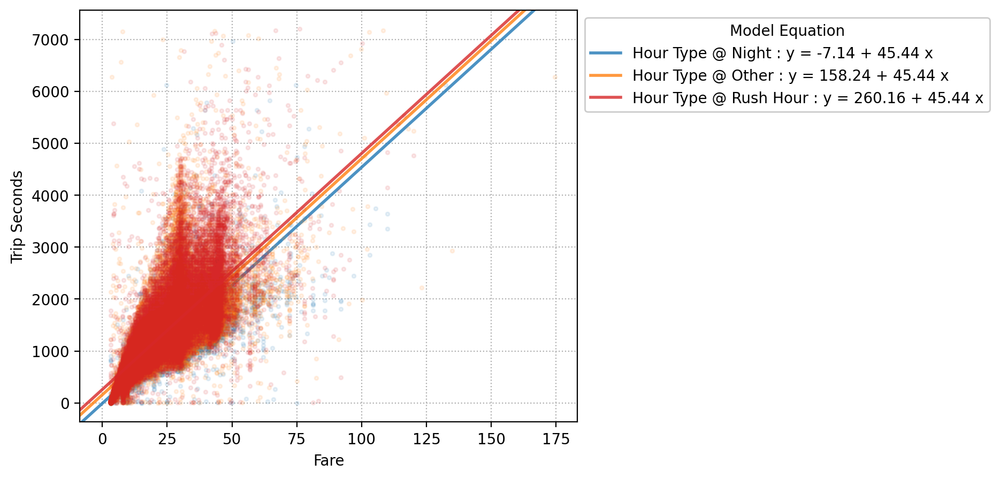

In [336]:
plt.figure(figsize=(6, 5))

for i, (type, color) in enumerate(zip(['Night', 'Other', 'Rush Hour'], ['C0', 'C1', 'C3']), 1):
    is_type = df['hour_type'] == type
    b0 = model.coef_[i]
    b1 = model.coef_[0]
    plt.plot(df['fare'][is_type], df['trip_seconds'][is_type], '.', markersize=5, alpha=0.1, color=color)
    plt.axline((0, b0), slope=b1, linewidth=2, color=color, alpha=0.8, label=f'Hour Type @ {type} : y = {b0:.2f} + {b1:.2f} x')

plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Trip Seconds')
plt.legend(framealpha=1, bbox_to_anchor=(1, 1), title='Model Equation')

plt.show()

# Step 8c: Interaction term
>**Model:**$$\begin{align}(\text{trip seconds}) &=128.67 + 53.91(\text{fare}) + 119.65 \times\mathbf{1}_{\{\text{night}\}} - 20.95 (\text{fare})\mathbf{1}_{\{\text{night}\}}\\
&= (128.67 + 119.65 \times\mathbf{1}_{\{\text{night}\}}) + (53.91 - 20.95 \times\mathbf{1}_{\{\text{night}\}})(\text{fare})\end{align}$$

In [339]:
print(smf.ols(formula='trip_seconds ~ fare + night + fare:night', data=df).fit().summary()) # Same as 'trip_seconds ~ fare * night'

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.650
Model:                            OLS   Adj. R-squared:                  0.650
Method:                 Least Squares   F-statistic:                 6.183e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:32:45   Log-Likelihood:            -7.5366e+05
No. Observations:              100000   AIC:                         1.507e+06
Df Residuals:                   99996   BIC:                         1.507e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            170.2725      2

In [341]:
x = df[['fare', 'night']].copy()
x['fare:night'] = x['fare'] * x['night'] # Interaction term

y = df['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y) # Convert night from True/False to 1/0 implicitly

model.intercept_, model.coef_, model.score(x, y) # R^2

(170.2724550553976,
 array([ 47.57723926,  47.19168352, -13.08361975]),
 0.6497483327070879)

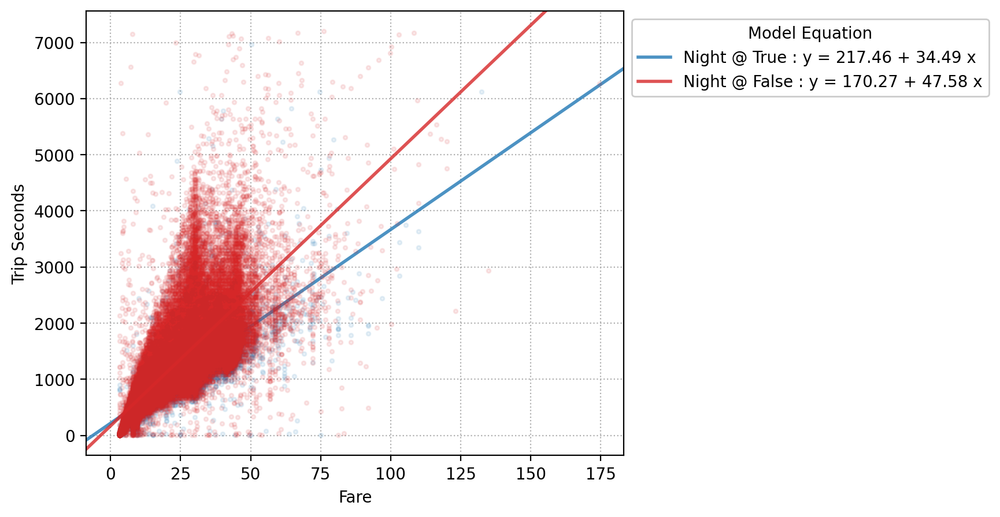

In [343]:
plt.figure(figsize=(6, 5))

is_night = df['night']

b0 = model.intercept_ + model.coef_[1]
b1 = model.coef_[0] + model.coef_[2]
plt.plot(df['fare'][is_night], df['trip_seconds'][is_night], '.', markersize=5, alpha=0.1, color='C0')
plt.axline((0, b0), slope=b1, linewidth=2, color='C0', alpha=0.8,
           label=f'Night @ True : y = {b0:.2f} + {b1:.2f} x')

b0 = model.intercept_
b1 = model.coef_[0]
plt.plot(df['fare'][~is_night], df['trip_seconds'][~is_night], '.', markersize=5, alpha=0.1, color='C3')
plt.axline((0, b0), slope=b1, linewidth=2, color='C3', alpha=0.8, label=f'Night @ False : y = {b0:.2f} + {b1:.2f} x')

plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Trip Seconds')
plt.legend(framealpha=1, bbox_to_anchor=(1, 1), title='Model Equation')

plt.show()

>**Model:** $$\begin{align}(\text{trip seconds}) =&\; 248.33 + 32.97 (\text{fare}) - 81.86 \times \mathbf{1}_{\{\text{hour type = Other}\}} - 162.76 \times\mathbf{1}_{\{\text{hour type = Rush Hour}\}}\\ &+ 15.52 (\text{fare})\mathbf{1}_{\{\text{hour type = Other}\}} + 27.00 (\text{fare})\mathbf{1}_{\{\text{hour type = Rush Hour}\}}\\ = &\;(248.33 - 81.86 \times \mathbf{1}_{\{\text{hour type = Other}\}} - 162.76 \times\mathbf{1}_{\{\text{hour type = Rush Hour}\}} )\\  &+  (32.97 + 15.52\times \mathbf{1}_{\{\text{hour type = Other}\}} + 27.00 \times \mathbf{1}_{\{\text{hour type = Rush Hour}\}}) (\text{fare})\end{align}$$

In [346]:
# Method 1: Omit one level of the one-hot encoding
print(smf.ols(formula='trip_seconds ~ fare + hour_type + fare:hour_type', data=df).fit().summary()) # Same as 'trip_seconds ~ fare * hour_type'

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.660
Model:                            OLS   Adj. R-squared:                  0.660
Method:                 Least Squares   F-statistic:                 3.887e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:39:16   Log-Likelihood:            -7.5214e+05
No. Observations:              100000   AIC:                         1.504e+06
Df Residuals:                   99994   BIC:                         1.504e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

In [348]:
df2 = pd.get_dummies(df[['trip_seconds', 'fare', 'hour_type']], columns=['hour_type'], drop_first=True)
for col in ['hour_type_Other', 'hour_type_Rush Hour']:
    df2[f'fare:{col}'] = df2['fare'] * df2[col]

x = df2[['fare', 'hour_type_Other', 'hour_type_Rush Hour', 'fare:hour_type_Other', 'fare:hour_type_Rush Hour']]
y = df2['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=True).fit(x, y)

model.intercept_, model.coef_, model.score(x, y) # R^2

(217.4641385712971,
 array([ 34.4936195 ,  -7.51793092, -90.09862348,   8.21225165,
         18.38466074]),
 0.6602653552057608)

>**Model:** $$\begin{align}(\text{trip seconds}) =&\; 248.33 \times \mathbf{1}_{\{\text{hour type = Night}\}} + 166.46 \times \mathbf{1}_{\{\text{hour type = Other}\}} + 85.57 \times \mathbf{1}_{\{\text{hour type = Rush Hour}\}} \\ &+ 32.96 (\text{fare})\mathbf{1}_{\{\text{hour type = Night}\}} + 48.49 (\text{fare})\mathbf{1}_{\{\text{hour type = Other}\}} + 59.97 (\text{fare})\mathbf{1}_{\{\text{hour type = Rush Hour}\}}\\ =&\; (248.33 + 32.96(\text{fare}))\times \mathbf{1}_{\{\text{hour type = Night}\}} \\ &+(166.46 + 48.49(\text{fare}))\times \mathbf{1}_{\{\text{hour type = Other}\}}\\ &+(85.57 + 59.97(\text{fare}))\times \mathbf{1}_{\{\text{hour type = Rush HOur}\}}\end{align}$$

In [351]:
# Method 2: Keep all levels of the one-hot encoding but omit the intercept and fare terms
print(smf.ols(formula='trip_seconds ~ 0 + hour_type + fare:hour_type', data=df).fit().summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.660
Model:                            OLS   Adj. R-squared:                  0.660
Method:                 Least Squares   F-statistic:                 3.887e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        10:40:02   Log-Likelihood:            -7.5214e+05
No. Observations:              100000   AIC:                         1.504e+06
Df Residuals:                   99994   BIC:                         1.504e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
hour_type[Night]      

In [353]:
df2 = pd.get_dummies(df[['trip_seconds', 'fare', 'hour_type']], columns=['hour_type'])
for col in ['hour_type_Night', 'hour_type_Other', 'hour_type_Rush Hour']:
    df2[f'fare:{col}'] = df2['fare'] * df2[col]

x = df2[['hour_type_Night', 'hour_type_Other', 'hour_type_Rush Hour',
         'fare:hour_type_Night', 'fare:hour_type_Other', 'fare:hour_type_Rush Hour']]
y = df2['trip_seconds']
model = sklearn.linear_model.LinearRegression(fit_intercept=False).fit(x, y)

model.intercept_, model.coef_, model.score(x, y) # R^2

(0.0,
 array([217.46413857, 209.94620766, 127.36551509,  34.4936195 ,
         42.70587116,  52.87828025]),
 0.6602653552057608)

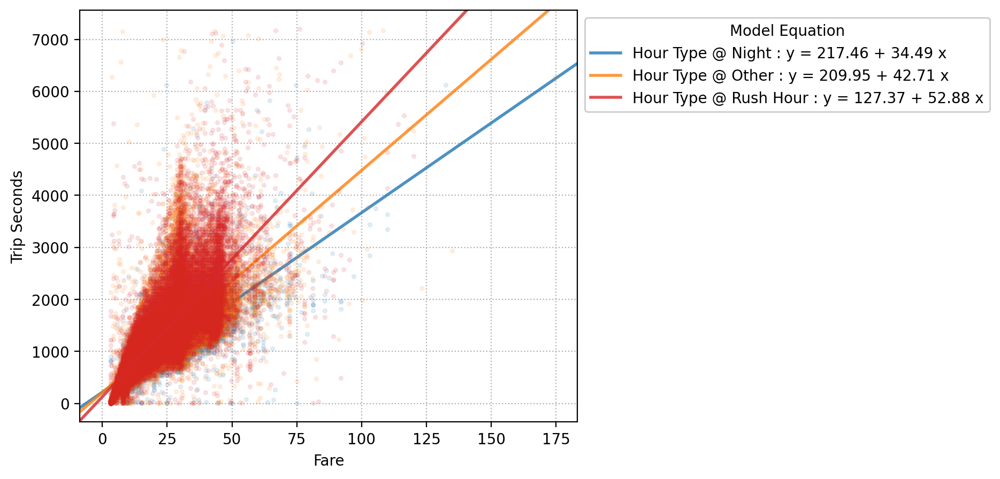

In [355]:
plt.figure(figsize=(6, 5))

for i, (type, color) in enumerate(zip(['Night', 'Other', 'Rush Hour'], ['C0', 'C1', 'C3'])):
    is_type = df['hour_type'] == type
    b0 = model.coef_[i]
    b1 = model.coef_[3 + i]
    plt.plot(df['fare'][is_type], df['trip_seconds'][is_type], '.', markersize=5, alpha=0.1, color=color)
    plt.axline((0, b0), slope=b1, linewidth=2, color=color, alpha=0.8, label=f'Hour Type @ {type} : y = {b0:.2f} + {b1:.2f} x')

plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Trip Seconds')
plt.legend(framealpha=1, bbox_to_anchor=(1, 1), title='Model Equation')

plt.show()

# Step 9: Model selection with F-test

In [358]:
large_model = smf.ols(formula='trip_seconds ~ fare + extras', data=df).fit()
small_model = smf.ols(formula='trip_seconds ~ fare', data=df).fit()

print(large_model.summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.638
Method:                 Least Squares   F-statistic:                 8.820e+04
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        11:15:36   Log-Likelihood:            -7.5528e+05
No. Observations:              100000   AIC:                         1.511e+06
Df Residuals:                   99997   BIC:                         1.511e+06
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    167.0427      2.515     66.406      0.0

In [360]:
# Method 1: Use anova_lm()
import statsmodels.stats.api as sms

print(sms.anova_lm(small_model, large_model))

   df_resid           ssr  df_diff       ss_diff            F  Pr(>F)
0   99998.0  2.167667e+10      0.0           NaN          NaN     NaN
1   99997.0  2.127344e+10      1.0  4.032316e+08  1895.412798     0.0


In [362]:
# Method 2: Use compare_f_test()
large_model.compare_f_test(small_model) # F-statistic, p-value, p_large - p_small

(1895.412797871847, 0.0, 1.0)

In [364]:
# Method 3: Use f_test()
large_model.f_test('extras = 0')
# https://www.statsmodels.org/devel/generated/statsmodels.regression.linear_model.OLSResults.f_test.html

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=1895.412797871737, p=0.0, df_denom=1e+05, df_num=1>

In [366]:
# Do sequential F-tests
m1 = smf.ols(formula='trip_seconds ~ fare', data=df).fit()
m2 = smf.ols(formula='trip_seconds ~ fare + hour', data=df).fit()
m3 = smf.ols(formula='trip_seconds ~ fare + hour + fare:hour', data=df).fit()
m4 = smf.ols(formula='trip_seconds ~ fare + hour + fare:hour + tips_percent', data=df).fit()
m5 = smf.ols(formula='trip_seconds ~ fare + hour + fare:hour + tips_percent + tolls', data=df).fit()

In [368]:
(m2.compare_f_test(m1),
 m3.compare_f_test(m2),
 m4.compare_f_test(m3),
 m5.compare_f_test(m4))

((329.0266458840255, 2.054872631669999e-73, 1.0),
 (120.39894945175584, 5.367609510480757e-28, 1.0),
 (882.761028225213, 3.8237319804344943e-193, 1.0),
 (0.0001447975771518528, 0.9903991619287177, 1.0))

In [370]:
sms.anova_lm(m5)

,df,sum_sq,mean_sq,F,PR(>F)
fare,1.0,3.712386e+10,3.712386e+10,173540.497647,0.000000e+00
hour,1.0,7.109025e+07,7.109025e+07,332.320998,3.959528e-74
fare:hour,1.0,2.598265e+07,2.598265e+07,121.459408,3.147110e-28
tips_percent,1.0,1.888387e+08,1.888387e+08,882.752201,3.840590e-193
tolls,1.0,3.097516e+01,3.097516e+01,0.000145,9.903992e-01
Residual,99994.0,2.139076e+10,2.139204e+05,NaN,NaN


In [372]:
# Do F-test to combine categorical levels via multiple constraints
df['hour'] = df['hour'].astype(str)
model = smf.ols(formula='trip_seconds ~ fare + hour', data=df).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.651
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     7762.
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        11:21:51   Log-Likelihood:            -7.5352e+05
No. Observations:              100000   AIC:                         1.507e+06
Df Residuals:                   99975   BIC:                         1.507e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -7.6777     10.788     -0.712      0.4

In [374]:
model.f_test('(hour[T.4] = hour[T.5]), (hour[T.16] = hour[T.17])')

<class 'statsmodels.stats.contrast.ContrastResults'>
<F test: F=2.6333418588321744, p=0.07184297107389404, df_denom=1e+05, df_num=2>

# Step 10: Model diagnostic for heteroscedasticity
>**Model:** $(\text{trip seconds}) = 152.37 + 49.85\,(\text{fare})$

In [377]:
m1 = smf.ols(formula='trip_seconds ~ fare', data=df).fit()

print(m1.summary())

                            OLS Regression Results                            
Dep. Variable:           trip_seconds   R-squared:                       0.631
Model:                            OLS   Adj. R-squared:                  0.631
Method:                 Least Squares   F-statistic:                 1.713e+05
Date:                Fri, 27 Dec 2024   Prob (F-statistic):               0.00
Time:                        11:22:36   Log-Likelihood:            -7.5622e+05
No. Observations:              100000   AIC:                         1.512e+06
Df Residuals:                   99998   BIC:                         1.512e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    183.1184      2.512     72.907      0.0

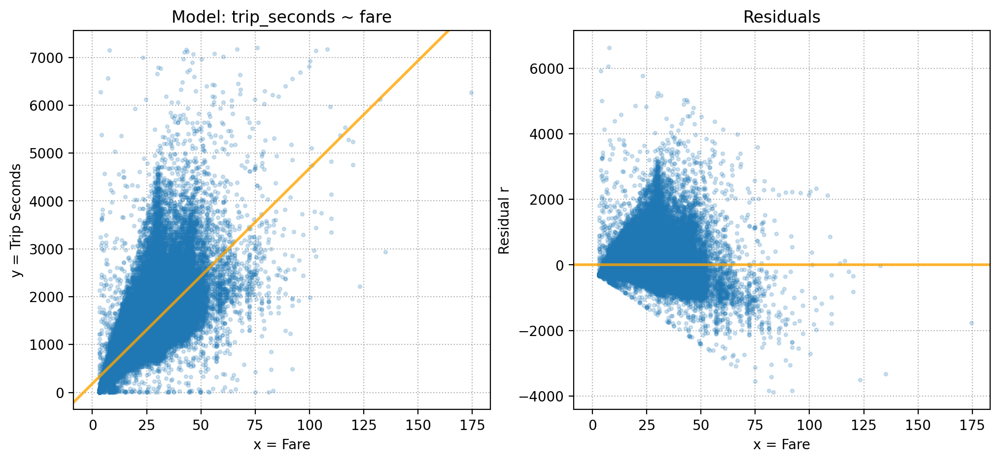

In [379]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(df['fare'], df['trip_seconds'], '.', markersize=5, alpha=0.2)
plt.axline((0, m1.params.iat[0]), slope=m1.params.iat[1], linewidth=2, color='orange', alpha=0.8)
plt.grid(linestyle=':')
plt.xlabel('x = Fare')
plt.ylabel('y = Trip Seconds')
plt.title('Model: trip_seconds ~ fare')

plt.subplot(1, 2, 2)
plt.plot(df['fare'], m1.resid, '.', markersize=5, alpha=0.2)
plt.axline((0, 0), slope=0, linewidth=2, color='orange', alpha=0.8)
plt.grid(linestyle=':')
plt.xlabel('x = Fare')
plt.ylabel('Residual r')
plt.title('Residuals')
plt.show()

m2 = smf.ols(formula='np.log(trip_seconds) ~ np.log(fare)', data=df).fit()

print(m2.summary())

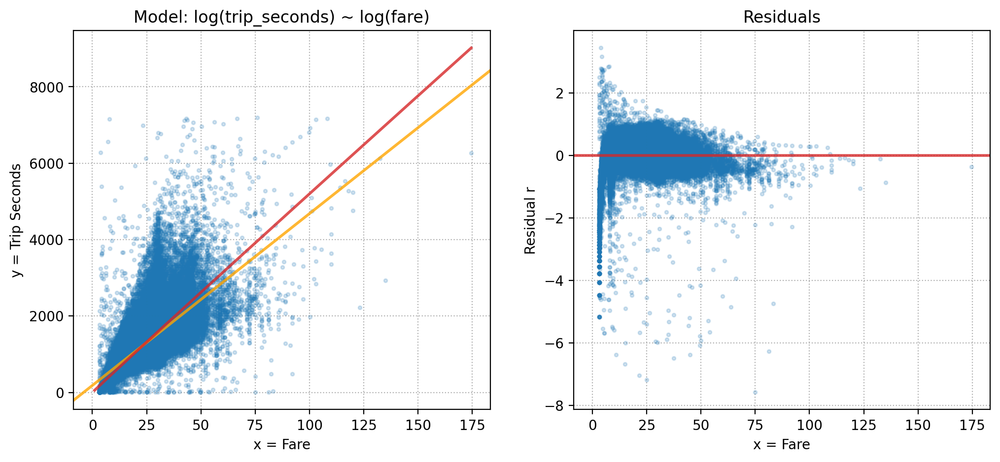

In [385]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(df['fare'], df['trip_seconds'], '.', markersize=5, alpha=0.2)
plt.axline((0, m1.params.iat[0]), slope=m1.params.iat[1], linewidth=2, color='orange', alpha=0.8)
plt.grid(linestyle=':')
plt.xlabel('x = Fare')
plt.ylabel('y = Trip Seconds')
plt.title('Model: log(trip_seconds) ~ log(fare)')

xticks = np.linspace(1, df['fare'].max(), num=1000)
plt.plot(xticks, np.exp(m2.params.iat[0] + m2.params.iat[1] * np.log(xticks)), linewidth=2, color='C3', alpha=0.8)

plt.subplot(1, 2, 2)
plt.plot(df['fare'], m2.resid, '.', markersize=5, alpha=0.2)
plt.axline((0, 0), slope=0, linewidth=2, color='C3', alpha=0.8)
plt.grid(linestyle=':')
plt.xlabel('x = Fare')
plt.ylabel('Residual r')
plt.title('Residuals')
plt.show()

# Step 9: Define business problem for Logistic Regression

#### Business Problem

> A rideshare company would like to enter the Chicago market with an attractive tipping strategy. To this end, they want to understand how Chicago taxi trip's tips is related to other factors of the trip.

#### Task

> Build a logistic regression model using historical Chicago taxi trip data from year 2022 with tipping of $5+ as the response variable and other useful information as explanatory variables.

#### Some Considerations

- **Easy or difficulty task?**
    - Intuitively, the amount of `tips` might be positively correlated with `fare` or `trip_total`.
- **Actionable**
    - From the rideshare company's perspective, neither `payment_type` nor `company` would be actionable even if they were useful explanatory variables. 

# Step 10: Exploratory data analysis and visualization for Categorical Variables

In [405]:
df = pd.read_csv('chicago_taxi_trip_sample.csv')

In [407]:
df['tips_5'] = df['tips'] >= 5

In [409]:
df['early_morning'] = df['hour'].isin({4, 5, 6})

df['airport'] = df['pickup_area'].isin({'Midway', 'O\'Hare'}) | df['dropoff_area'].isin({'Midway', 'O\'Hare'})

df['trip_minutes'] = df['trip_seconds'] / 60
df['speed'] = df['trip_miles'] / df['trip_minutes'] * 60 # Miles per hour

In [411]:
# Q: Any imbalance in class labels?
(df['tips_5']
 .value_counts()
 .to_frame()
 .assign(percent=lambda x: x['count'] / x['count'].sum() * 100))

,count,percent
tips_5,,
False,81061,81.061
True,18939,18.939


In [413]:
# Q: What is the distribution of early morning hours?
(df['early_morning']
 .value_counts()
 .to_frame()
 .assign(percent=lambda x: x['count'] / x['count'].sum() * 100))

,count,percent
early_morning,,
False,96770,96.77
True,3230,3.23


In [415]:
# Q: What is the distribution of airport trips?
(df['airport']
 .value_counts()
 .to_frame()
 .assign(percent=lambda x: x['count'] / x['count'].sum() * 100))

,count,percent
airport,,
False,76046,76.046
True,23954,23.954


In [417]:
# Q: Any outlier in speed?
df['speed'].min(), df['speed'].max(), (df['speed'] > 60).sum()

(0.013201320132013201, 65916.0, 236)

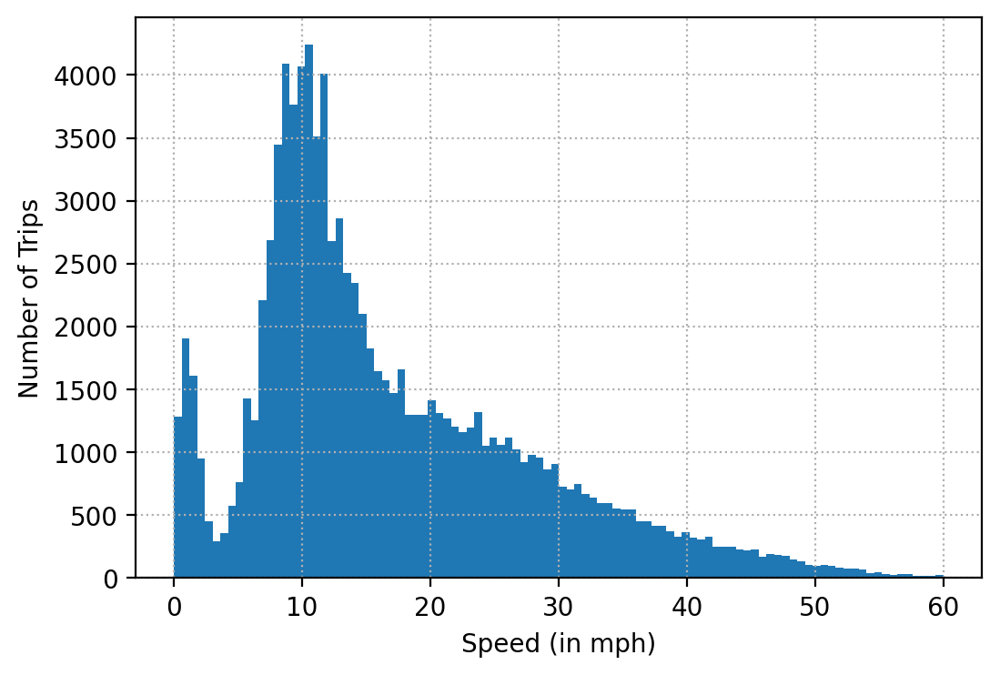

In [419]:
# Q: What is the distribution of speed?
ax = (df['speed'][df['speed'] <= 60]).hist(figsize=(6, 4), bins=100, grid=False)
ax.grid(linestyle=':')
ax.set_xlabel('Speed (in mph)')
ax.set_ylabel('Number of Trips');

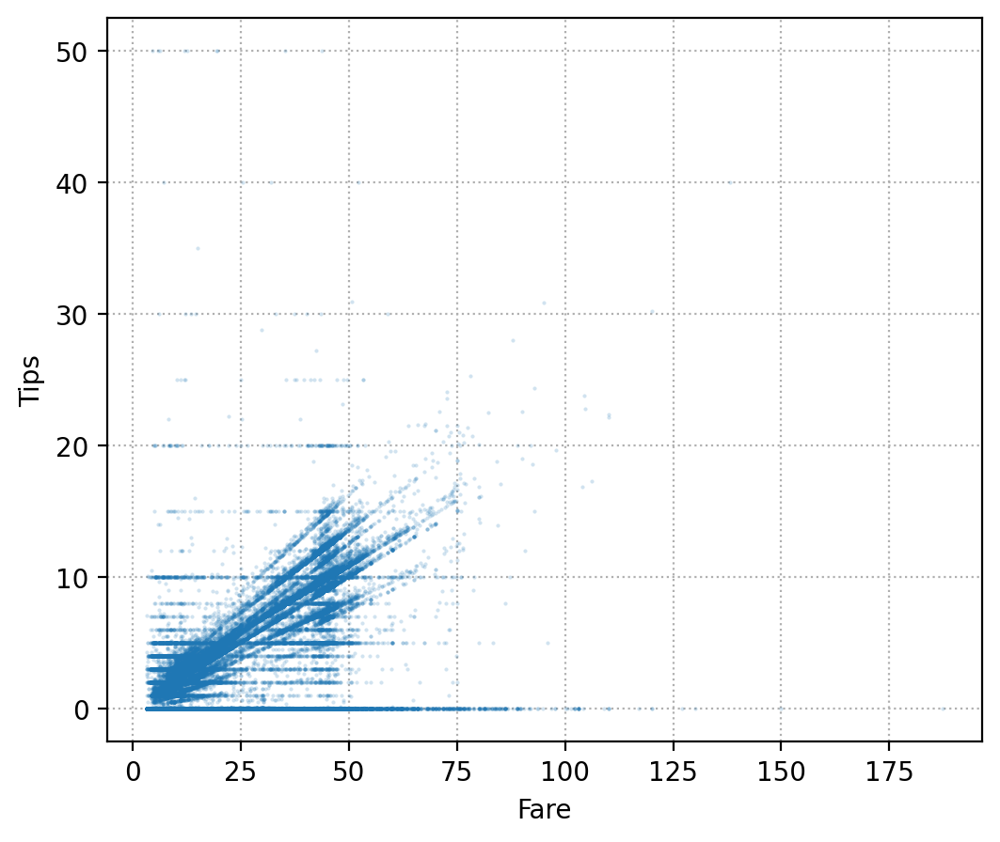

In [421]:
# Q: What is the relationship between fare vs tips?
plt.figure(figsize=(6, 5))
plt.plot(df['fare'], df['tips'], '.', markersize=1, alpha=0.2)
plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Tips')
plt.show()

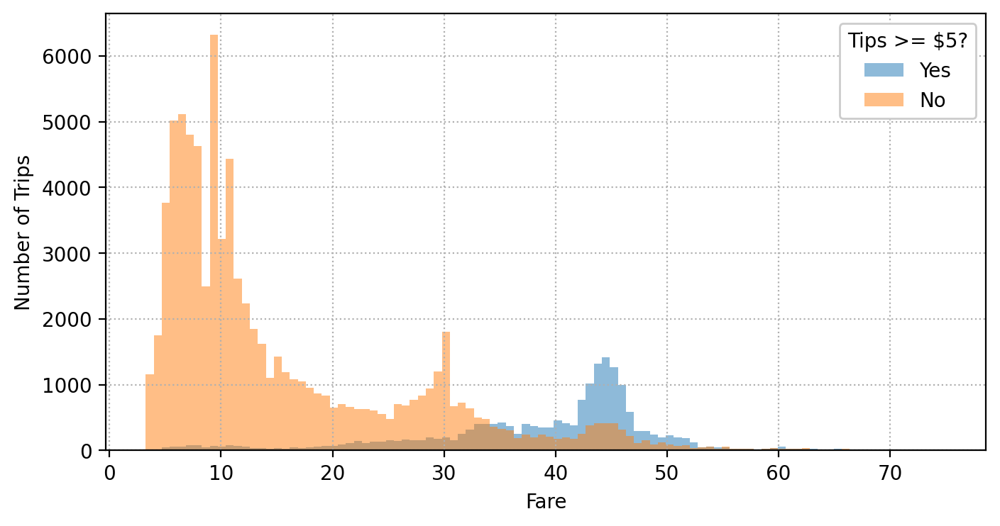

In [423]:
# Q: What is the distribution of fare per class label?
plt.figure(figsize=(8, 4))
x = 'fare'
plt.hist(df[x][(df[x] <= 75) & df['tips_5']], bins=100, alpha=0.5, label='Yes')
plt.hist(df[x][(df[x] <= 75) & ~df['tips_5']], bins=100, alpha=0.5, label='No')
plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Number of Trips')
plt.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
plt.show()

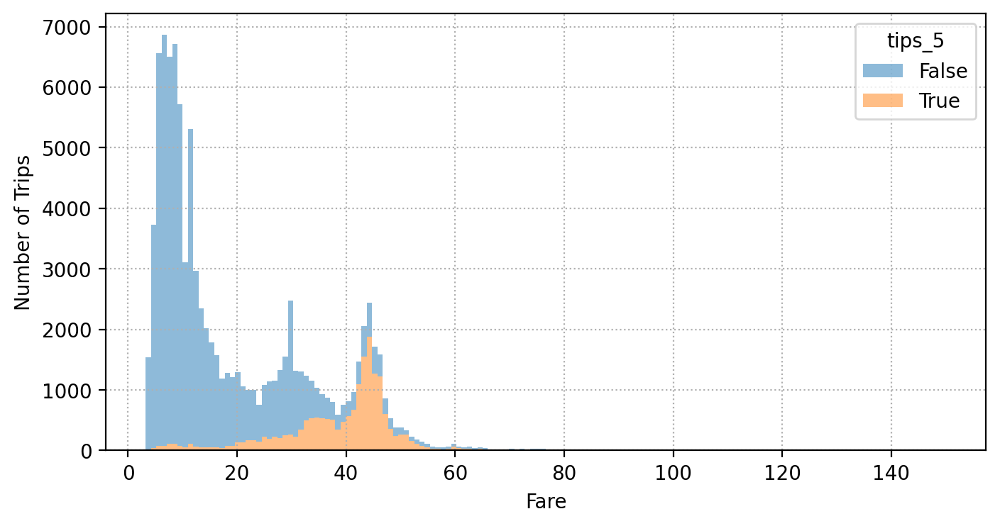

In [449]:
# Q: What is the distribution of fare per class label?
plt.figure(figsize=(8, 4))
sns.histplot(x='fare',data=df[(df[x] <= 75)], hue = 'tips_5', multiple='stack', edgecolor=None, alpha = 0.5)
plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Number of Trips')
#plt.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
plt.show()

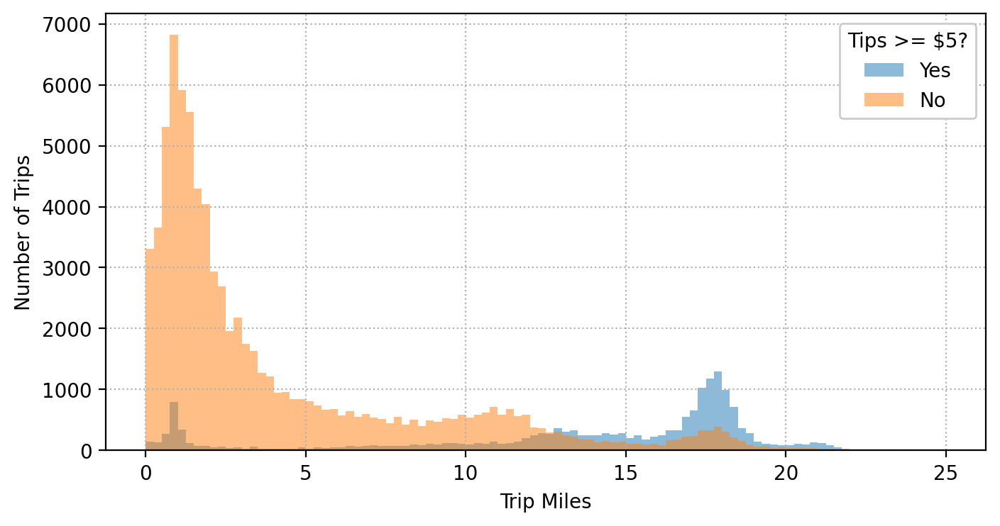

In [425]:
# Q: What is the distribution of trip miles per class label?
plt.figure(figsize=(8, 4))
x = 'trip_miles'
plt.hist(df[x][(df[x] <= 25) & df['tips_5']], bins=100, alpha=0.5, label='Yes')
plt.hist(df[x][(df[x] <= 25) & ~df['tips_5']], bins=100, alpha=0.5, label='No')
plt.grid(linestyle=':')
plt.xlabel('Trip Miles')
plt.ylabel('Number of Trips')
plt.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
plt.show()

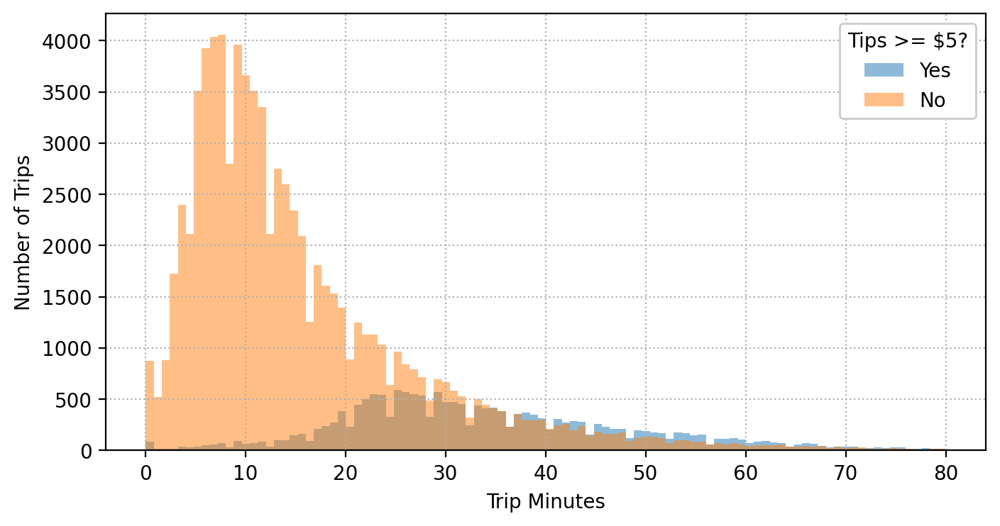

In [427]:
# Q: What is the distribution of trip minutes per class label?
plt.figure(figsize=(8, 4))
x = 'trip_minutes'
plt.hist(df[x][(df[x] <= 80) & df['tips_5']], bins=100, alpha=0.5, label='Yes')
plt.hist(df[x][(df[x] <= 80) & ~df['tips_5']], bins=100, alpha=0.5, label='No')
plt.grid(linestyle=':')
plt.xlabel('Trip Minutes')
plt.ylabel('Number of Trips')
plt.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
plt.show()

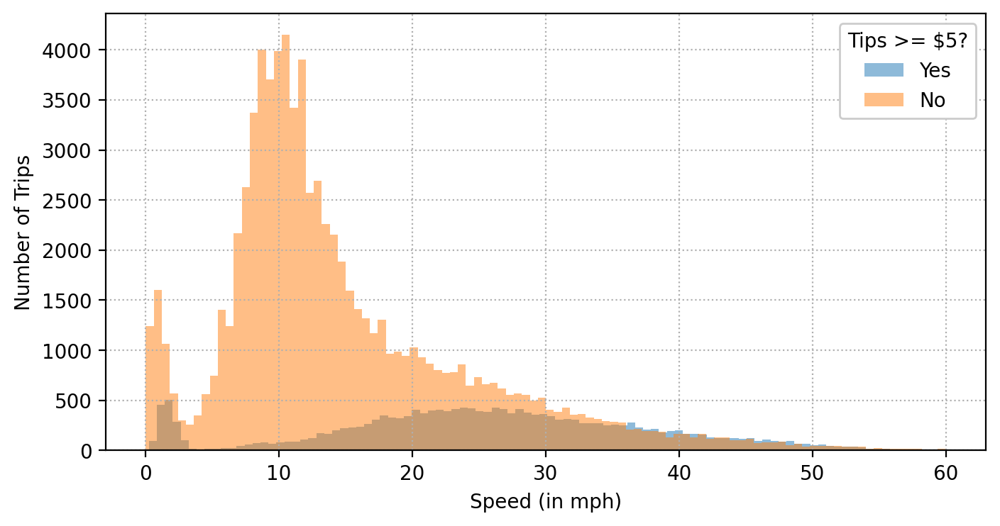

In [451]:
# Q: What is the distribution of speed per class label?
plt.figure(figsize=(8, 4))
x = 'speed'
plt.hist(df[x][(df[x] <= 60) & df['tips_5']], bins=100, alpha=0.5, label='Yes')
plt.hist(df[x][(df[x] <= 60) & ~df['tips_5']], bins=100, alpha=0.5, label='No')
plt.grid(linestyle=':')
plt.xlabel('Speed (in mph)')
plt.ylabel('Number of Trips')
plt.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
plt.show()

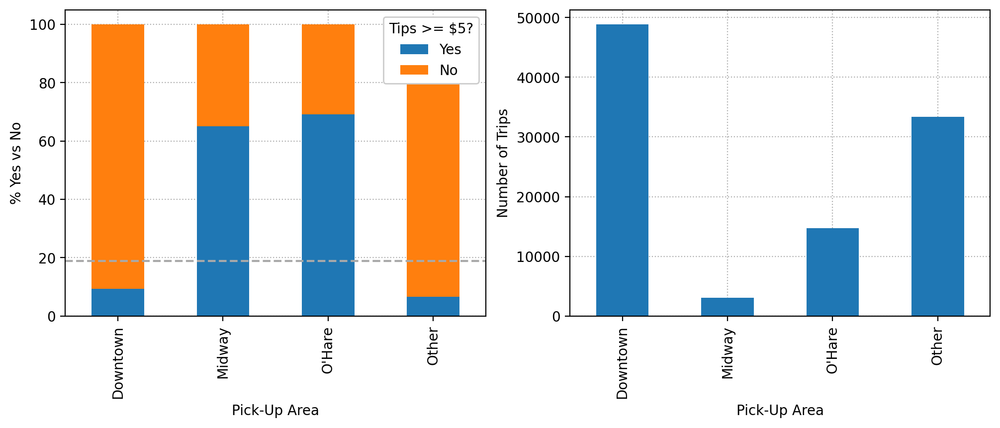

In [453]:
# Q: What is the distribution of class label per pick-up area?
plt.figure(figsize=(12, 4))

x = 'pickup_area'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Pick-Up Area')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Pick-Up Area')
ax2.set_ylabel('Number of Trips')

plt.show()

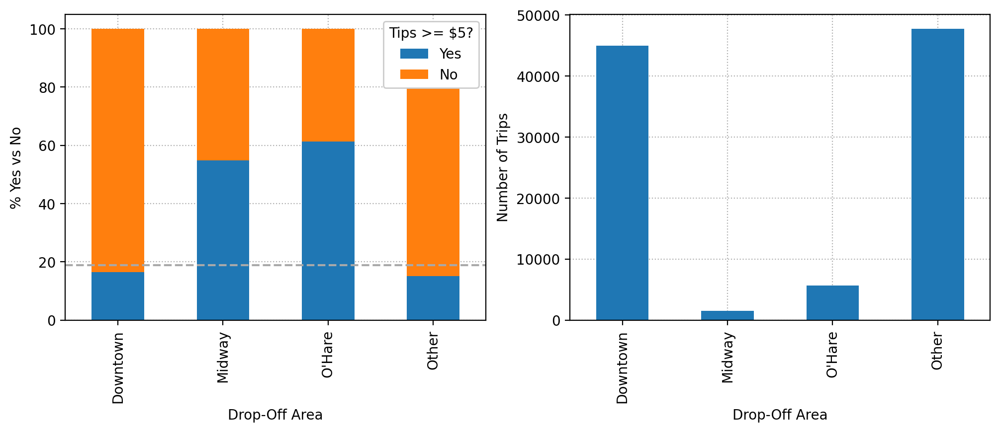

In [455]:
# Q: What is the distribution of class label per drop-off area?
plt.figure(figsize=(12, 4))

x = 'dropoff_area'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Drop-Off Area')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Drop-Off Area')
ax2.set_ylabel('Number of Trips')

plt.show()

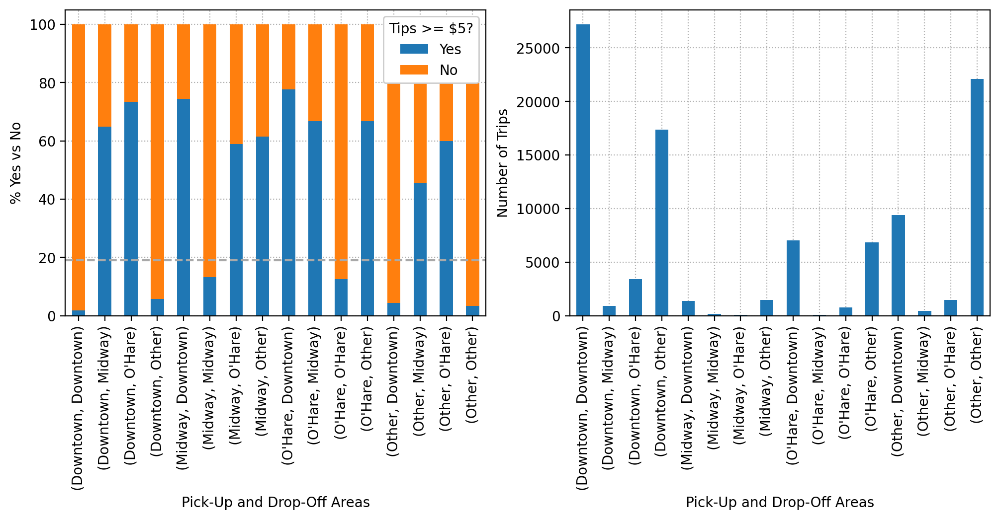

In [457]:
# Q: What is the distribution of class label per pick-up and drop-off areas?
plt.figure(figsize=(12, 4))

x = ['pickup_area', 'dropoff_area']
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Pick-Up and Drop-Off Areas')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Pick-Up and Drop-Off Areas')
ax2.set_ylabel('Number of Trips')

plt.show()

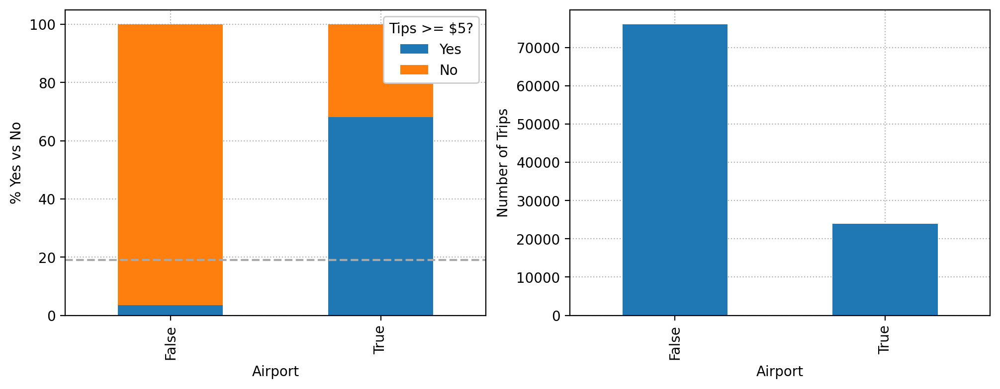

In [459]:
# Q: What is the distribution of class label per airport trip or not?
plt.figure(figsize=(12, 4))

x = 'airport'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Airport')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Airport')
ax2.set_ylabel('Number of Trips')

plt.show()

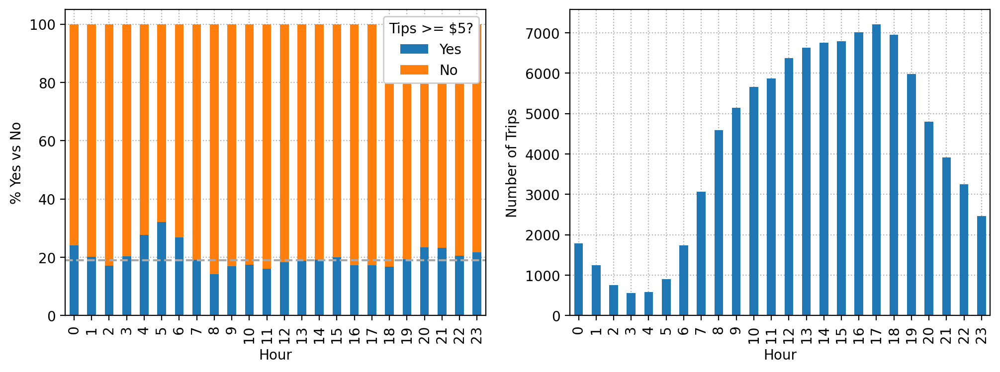

In [461]:
# Q: What is the distribution of class label per hour?
plt.figure(figsize=(12, 4))

x = 'hour'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Hour')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Hour')
ax2.set_ylabel('Number of Trips')

plt.show()

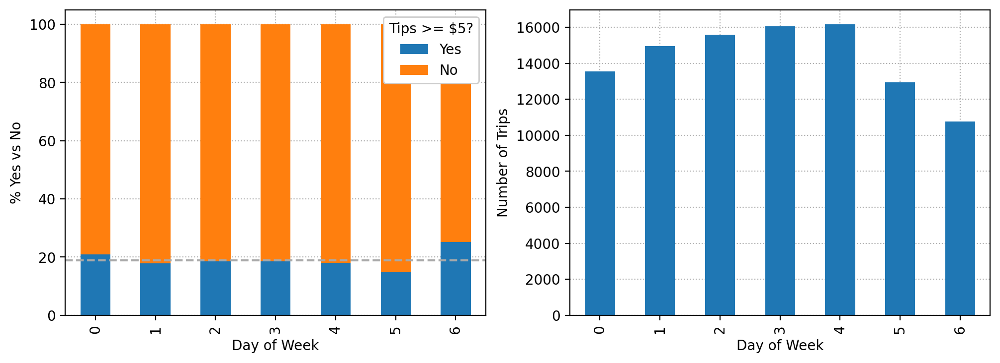

In [463]:
# Q: What is the distribution of class label per day of week?
plt.figure(figsize=(12, 4))

x = 'day_of_week'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Day of Week')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Day of Week')
ax2.set_ylabel('Number of Trips')

plt.show()

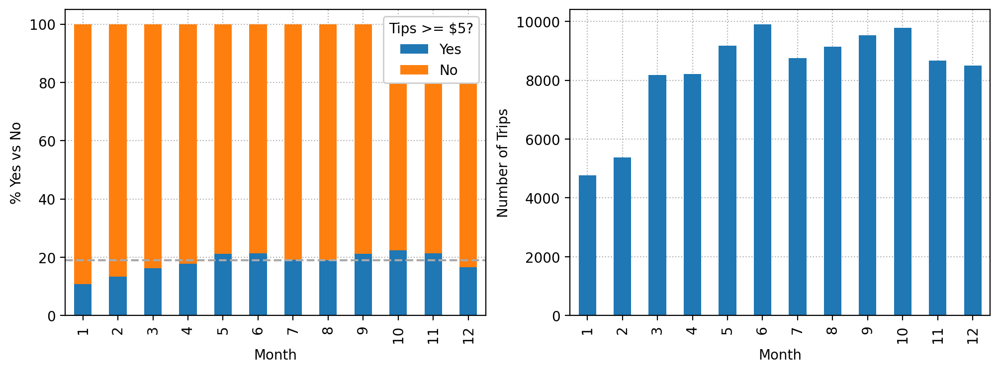

In [465]:
# Q: What is the distribution of class label per month?
plt.figure(figsize=(12, 4))

x = 'month'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Month')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Month')
ax2.set_ylabel('Number of Trips')

plt.show()

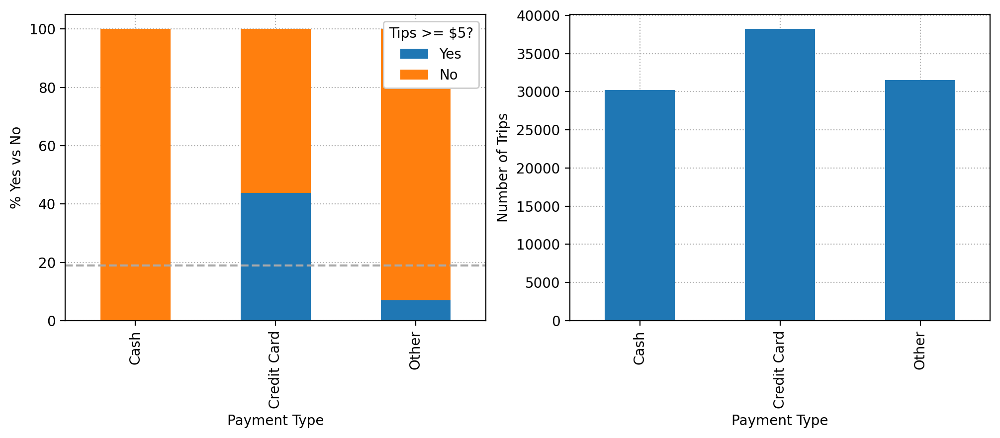

In [467]:
# Q: What is the distribution of class label per payment type?
plt.figure(figsize=(12, 4))

x = 'payment_type'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Payment Type')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Payment Type')
ax2.set_ylabel('Number of Trips')

plt.show()

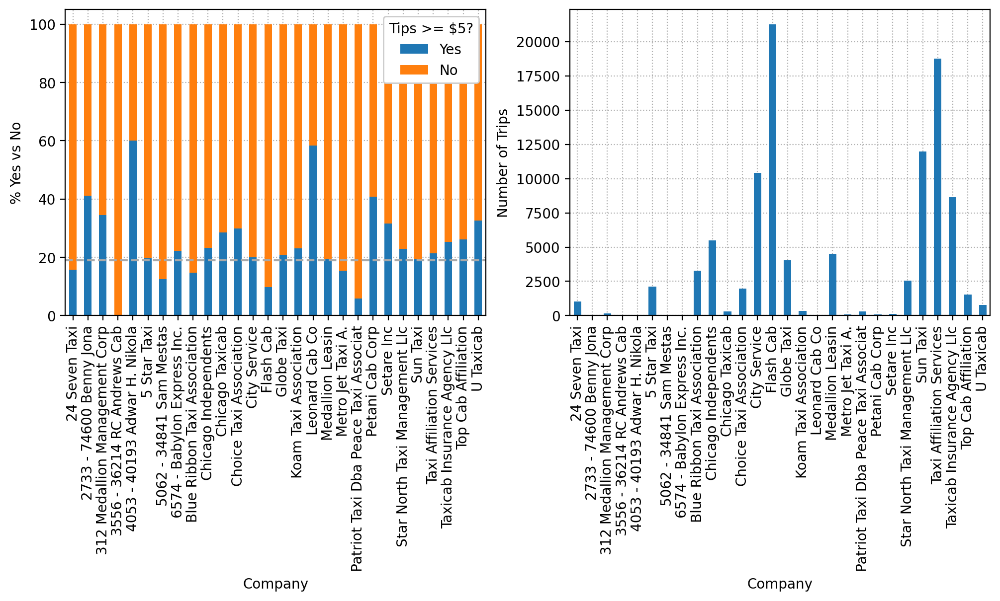

In [469]:
# Q: What is the distribution of class label per taxi company?
plt.figure(figsize=(12, 4))

x = 'company'
ax1 = plt.subplot(1, 2, 1)
df2 = (df
       .groupby(x)
       .agg({'tips_5': 'mean'})
       .rename(columns={'tips_5': 'Yes'}))
df2['No'] = 1 - df2['Yes']
ax1 = (df2 * 100).plot(kind='bar', stacked=True, ax=ax1)
ax1.axhline(df['tips_5'].mean() * 100, linestyle='--', color='darkgray', zorder=1.5)
ax1.grid(linestyle=':')
ax1.set_axisbelow(True)
ax1.legend(loc='upper right', framealpha=1, title='Tips >= $5?')
ax1.set_xlabel('Company')
ax1.set_ylabel('% Yes vs No')

ax2 = plt.subplot(1, 2, 2)
df.value_counts(x).sort_index().plot(kind='bar', ax=ax2)
ax2.grid(linestyle=':')
ax2.set_axisbelow(True)
ax2.set_xlabel('Company')
ax2.set_ylabel('Number of Trips')

plt.show()

**Conclusion on Explanatory Variables**
- Useful: `fare` (or `trip_miles`) > `airport` > `early_morning` > `day_of_week` for Sunday
- Useless: `trip_minutes`, `speed`, `payment_type`, `company`

# Step 5a: Logistic regression via statsmodels
>**Model:** $\text{logit}(\text{tips \$5}) = -4.78 + 0.12\,(\text{fare})$

In [477]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# https://pandas.pydata.org/docs/user_guide/categorical.html
df['tips_5'] = pd.Categorical(df['tips_5'], categories=[True, False]) # 1st category is "success"

# https://www.statsmodels.org/stable/glm.html
model = smf.glm(formula='tips_5 ~ fare', family=sm.families.Binomial(), data=df).fit()

print(model.summary())

                         Generalized Linear Model Regression Results                         
Dep. Variable:     ['tips_5[True]', 'tips_5[False]']   No. Observations:               100000
Model:                                           GLM   Df Residuals:                    99998
Model Family:                               Binomial   Df Model:                            1
Link Function:                                 Logit   Scale:                          1.0000
Method:                                         IRLS   Log-Likelihood:                -29681.
Date:                               Fri, 27 Dec 2024   Deviance:                       59362.
Time:                                       15:31:44   Pearson chi2:                 8.84e+07
No. Iterations:                                    7   Pseudo R-squ. (CS):             0.3141
Covariance Type:                           nonrobust                                         
                 coef    std err          z      P>|z|      

In [487]:
model.nobs # Number of observed data points    See dir(model)

100000

In [489]:
model.family # Binomial family

In [491]:
model.family.link # Logit link function is default

In [493]:
model.params # Beta's

Intercept   -4.776004
fare         0.123143
dtype: float64

In [495]:
model.fit_history['iteration'] # Fisher scoring number of iteration

7

In [497]:
model.converged # Fisher scoring converged or not?

True

In [499]:
model.fittedvalues # Fitted probability p_i

0        0.014027
1        0.023447
2        0.025998
3        0.087550
4        0.018423
           ...   
99995    0.045131
99996    0.045131
99997    0.013608
99998    0.045131
99999    0.329097
Length: 100000, dtype: float64

In [501]:
model.predict() # Also model.predict(which='mean')

array([0.01402701, 0.02344704, 0.02599831, ..., 0.01360754, 0.04513138,
       0.32909727])

In [503]:
model.predict(which='linear') # Fitted linear predictor i.e. b0 + b1*x1 + ... + b_d*x_d before link function

array([-4.25264443, -3.72928485, -3.6233815 , ..., -4.28343029,
       -3.05199599, -0.71227082])

In [505]:
# Predict for new x
new_x = pd.DataFrame({'fare': [50]})
model.predict(new_x) # Predicted probability p

0    0.799178
dtype: float64

In [507]:
model.predict(new_x, which='linear') #returns linear predictor values, instead of the transformed values or probabilities

0    1.381167
dtype: float64

In [509]:
o = model.get_prediction(new_x)
o.predicted, o.predicted_mean, o.linpred.predicted, o.linpred.predicted_mean

(array([0.79917844]),
 array([0.79917844]),
 array([1.38116749]),
 array([1.38116749]))

In [511]:
# import patsy # https://patsy.readthedocs.io/en/latest/formulas.html#the-formula-language
import statsmodels.api as sm

x = sm.add_constant(df['fare']) # Design matrix with a column of 1's for the intercept term
y = df['tips_5']
# y, x = patsy.dmatrices('tips_5 ~ fare', data=df, return_type='dataframe')

print(sm.GLM(y, x, family=sm.families.Binomial()).fit().summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                 tips_5   No. Observations:               100000
Model:                            GLM   Df Residuals:                    99998
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -29681.
Date:                Fri, 27 Dec 2024   Deviance:                       59362.
Time:                        15:55:23   Pearson chi2:                 8.84e+07
No. Iterations:                     7   Pseudo R-squ. (CS):             0.3141
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.7760      0.029   -166.155      0.0

# Step 5b: Logistic regression via Scikit-Learn
>**Model:** $\text{logit}(\text{tips \$5}) = -4.78 + 0.12\,(\text{fare})$

In [516]:
import sklearn.linear_model # https://scikit-learn.org/1.5/modules/generated/sklearn.linear_model.LogisticRegression.html

x = df[['fare']] # (n,1)-shape
y = df['tips_5'] # (n,)-shape
model = sklearn.linear_model.LogisticRegression(penalty=None).fit(x, y) # Use fit_intercept=True and solver='lbfgs'

In [518]:
model.intercept_, model.coef_ # Beta's

(array([-4.77613926]), array([[0.12314726]]))

In [520]:
model.n_iter_ # Number of iterations for solver

array([14], dtype=int32)

In [522]:
model.predict_proba(x) # 1 - p_i = P(Y_i=0) and p_i = P(Y=1)

array([[0.98597464, 0.01402536],
       [0.97655531, 0.02344469],
       [0.97400421, 0.02599579],
       ...,
       [0.98639407, 0.01360593],
       [0.95487214, 0.04512786],
       [0.67090466, 0.32909534]])

In [524]:
model.predict_log_proba(x) # Just log(1 - p_i) and log(p_i)

array([[-0.01412465, -4.26688804],
       [-0.02372389, -3.7531114 ],
       [-0.02633966, -3.64982053],
       ...,
       [-0.01369934, -4.29724954],
       [-0.04617784, -3.0982554 ],
       [-0.39912824, -1.11140778]])

In [526]:
model.predict(x)[:50] # y_hat = 1 if p_i >= 0.5 i.e. using tau = 0.5 as threhsold

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [528]:
(model.predict_proba(x)[:,1] >= 0.5)[:50] # Verify same as thresholding p_i >= 0.5

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False,  True, False, False, False, False,
        True, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False])

In [530]:
model.score(x, y), np.mean(model.predict(x) == y) # Accuracy

(0.8788, 0.8788)

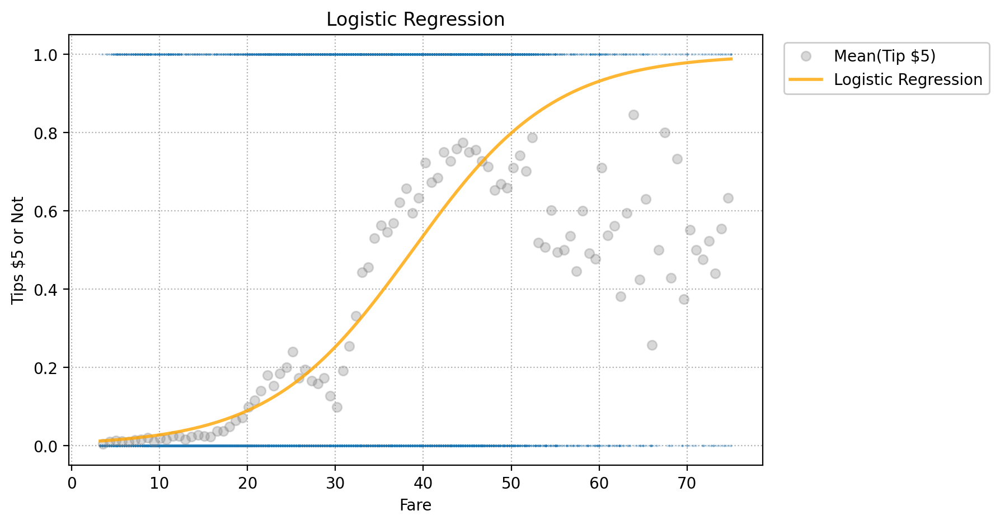

In [532]:
plt.figure(figsize=(8, 5))

# Plot x vs y
upper_fare = 75
df2 = df[['fare', 'tips_5']][df['fare'] <= upper_fare].copy()
plt.plot(df2['fare'], df2['tips_5'], '.', markersize=1, alpha=0.1)

# Plot bucket of x vs mean of y
num_bucket = 100
df2['tips_5'] = df2['tips_5'].astype(bool)
df2['fare_bucket'], buckets = pd.cut(df2['fare'], num_bucket, retbins=True)
df3 = (df2
       .groupby('fare_bucket', observed=False)
       .agg({'tips_5': 'mean'})
       .assign(bucket=(buckets[:-1] + buckets[1:]) / 2))
plt.plot(df3['bucket'], df3['tips_5'], 'o', color='gray', alpha=0.3, label='Mean(Tip $5)')

# Plot logistic regression
new_x = pd.DataFrame({'fare': np.linspace(df2['fare'].min(), df2['fare'].max(), 1000)})
plt.plot(new_x, model.predict_proba(new_x)[:,1], linewidth=2, color='orange', alpha=0.8, label='Logistic Regression')

plt.grid(linestyle=':')
plt.xlabel('Fare')
plt.ylabel('Tips $5 or Not')
plt.title('Logistic Regression')
plt.legend(framealpha=1, bbox_to_anchor=(1.02, 1))
plt.show()